# Нейросетевые модели на основе Image

Image - кадр временного ряда (фиксированная последовательность тиков до предсказания).

1) Отмена нормализации:
- уменьшает количество предсказаний в 10 раз,
- тем самым растёт метрика precision,
- уменьшается число сделок, максимальная прибыль с 300 usdt за 100_000 составляет 0.8 usdt при SLIP_N = 1.

## Импорты библиотек

In [1]:
from develop.augmentation import aug_all
from develop.create_labels import create_labels
from develop.score import trade
#from develop.loss import trade_loss


import json

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from tqdm import tqdm

from sqlalchemy import create_engine, Column, Integer, String, TIMESTAMP, ARRAY
from sqlalchemy.ext.declarative import declarative_base
from sqlalchemy.orm import sessionmaker

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.metrics import classification_report

from torchvision.models import resnet50
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data_utils
import torch.optim as optim

from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.linear_model import Lasso, Ridge
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier

from catboost import CatBoostRegressor
from catboost import CatBoostClassifier

from lightgbm import LGBMRegressor, LGBMClassifier

pd.set_option("display.max_columns", None)

## Константы

In [2]:
PAIRS_NAME = ['bnb_btc', 'eth_btc', 'bnb_eth','btc_usdt','eth_usdt','bnb_usdt']
LABELS_NAME = [
    'label',
    'bnb_btc_min',
    'bnb_btc_max',
    'bnb_btc_min_max',
    'eth_btc_min',
    'eth_btc_max',
    'eth_btc_min_max',
    'bnb_eth_min',
    'bnb_eth_max',
    'bnb_eth_min_max',
    'not_buy']

## Чтение данных

In [3]:
def config(service):
    with open('develop/config_connect.json', 'r') as f:
        config = json.load(f)
    if service == 'binance':
        config = config['binance']
    if service == 'postgres':
        config = config['postgres']

    return config

def config_model():
    with open('develop/config_model.json', 'r') as f:
        config_model = json.load(f)
    random = config_model['RANDOM']
    image_length = config_model['IMAGE_LENGTH']
    features_length = config_model['FEATURES_LENGTH']
    batch_size = config_model['BATCH_SIZE']
    epoch = config_model['EPOCH']
    fee = config_model['FEE']
    slip_n = config_model['SLIP_N']

    return random, image_length, features_length, batch_size, epoch, fee, slip_n

RANDOM, IMAGE_LENGTH, FEATURES_LENGTH, BATCH_SIZE, EPOCH, FEE, SLIP_N = config_model()

config_bin_dev = config('postgres')['binance']
engine = create_engine(f"postgresql+psycopg2://"
                       f"{config_bin_dev['user_name']}:"
                       f"{config_bin_dev['password']}@"
                       f"{config_bin_dev['server']}/"
                       f"{config_bin_dev['base_name']}")

ticker_price = pd.read_sql_table(table_name='ticker_price',
                                    con=engine,
                                    schema='public',
                                    index_col='id_ticker',
                                    columns=PAIRS_NAME)
ticker_price = ticker_price.astype('float')
ticker_price = ticker_price.sort_index()

In [8]:
bnb_btc_depth = np.load('features/bnb_btc_depth_10_scaler.npy', mmap_mode=None, allow_pickle=False, fix_imports=True, encoding='ASCII')
bnb_eth_depth = np.load('features/bnb_eth_depth_10_scaler.npy', mmap_mode=None, allow_pickle=False, fix_imports=True, encoding='ASCII')
eth_btc_depth = np.load('features/eth_btc_depth_10_scaler.npy', mmap_mode=None, allow_pickle=False, fix_imports=True, encoding='ASCII')
bnb_usdt_depth = np.load('features/bnb_usdt_depth_10_scaler.npy', mmap_mode=None, allow_pickle=False, fix_imports=True, encoding='ASCII')
btc_usdt_depth = np.load('features/btc_usdt_depth_10_scaler.npy', mmap_mode=None, allow_pickle=False, fix_imports=True, encoding='ASCII')
eth_usdt_depth = np.load('features/eth_usdt_depth_10_scaler.npy', mmap_mode=None, allow_pickle=False, fix_imports=True, encoding='ASCII')

In [9]:
tables_len = min([ticker_price.shape[0],
                  bnb_btc_depth.shape[0],
                  bnb_eth_depth.shape[0],
                  eth_btc_depth.shape[0],
                  bnb_usdt_depth.shape[0],
                  btc_usdt_depth.shape[0],
                  eth_usdt_depth.shape[0]])

ticker_price = ticker_price[:tables_len]
bnb_btc_depth = bnb_btc_depth[:tables_len]
bnb_eth_depth = bnb_eth_depth[:tables_len]
eth_btc_depth = eth_btc_depth[:tables_len]
bnb_usdt_depth = bnb_usdt_depth[:tables_len]
btc_usdt_depth = btc_usdt_depth[:tables_len]
eth_usdt_depth = eth_usdt_depth[:tables_len]

In [10]:
FEATURES_LENGTH_SMALL = 5
IMAGE_LENGTH_SMALL = 5
FEATURES_LENGTH_MEDIUM = 20
IMAGE_LENGTH_MEDIUM = 20
FEATURES_LENGTH_BIG = 80
IMAGE_LENGTH_BIG = 80
EPOCH = 51
BATCH_SIZE = 131072
#BATCH_SIZE = 65536
#BATCH_SIZE = 8192
#BATCH_SIZE = 4096
#BATCH_SIZE = 2048
#BATCH_SIZE = 1024

In [11]:
display(ticker_price.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 101 entries, 1 to 101
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   bnb_btc   101 non-null    float64
 1   eth_btc   101 non-null    float64
 2   bnb_eth   101 non-null    float64
 3   btc_usdt  101 non-null    float64
 4   eth_usdt  101 non-null    float64
 5   bnb_usdt  101 non-null    float64
dtypes: float64(6)
memory usage: 5.5 KB


None

## Создание выборок

### Выделение тестовой выборки

### Выделение валидационной выборки

In [12]:
(ticker_price, ticker_price_valid,
 bnb_btc_depth, bnb_btc_depth_valid,
 bnb_eth_depth, bnb_eth_depth_valid,
 eth_btc_depth, eth_btc_depth_valid,
 bnb_usdt_depth, bnb_usdt_depth_valid,
 btc_usdt_depth, btc_usdt_depth_valid,
 eth_usdt_depth, eth_usdt_depth_valid) = train_test_split(ticker_price,
                                                          bnb_btc_depth,
                                                          bnb_eth_depth,
                                                          eth_btc_depth,
                                                          bnb_usdt_depth,
                                                          btc_usdt_depth,
                                                          eth_usdt_depth,
                                                          test_size=0.15, random_state=RANDOM, shuffle=False)

In [13]:
ticker_price.shape, bnb_btc_depth.shape, ticker_price_valid.shape

((85, 6), (85, 20), (16, 6))

### Подготовка данных

FEATURES_LENGTH = 224

0-ой X_scaled будет соответствовать 223-ему элементу в начальном DF (или 224 id_ticker = FEATURES_LENGTH).

#### Обучающая выборка

##### Стакан

In [14]:
scaler_bnb_btc_depth = StandardScaler()
bnb_btc_depth_scaled = scaler_bnb_btc_depth.fit_transform(bnb_btc_depth)

scaler_bnb_eth_depth = StandardScaler()
bnb_eth_depth_scaled = scaler_bnb_eth_depth.fit_transform(bnb_eth_depth)

scaler_eth_btc_depth = StandardScaler()
eth_btc_depth_scaled = scaler_eth_btc_depth.fit_transform(eth_btc_depth)

scaler_bnb_usdt_depth = StandardScaler()
bnb_usdt_depth_scaled = scaler_bnb_usdt_depth.fit_transform(bnb_usdt_depth)

scaler_btc_usdt_depth = StandardScaler()
btc_usdt_depth_scaled = scaler_btc_usdt_depth.fit_transform(btc_usdt_depth)

scaler_eth_usdt_depth = StandardScaler()
eth_usdt_depth_scaled = scaler_eth_usdt_depth.fit_transform(eth_usdt_depth)

In [15]:
depth_scaled = np.concatenate((bnb_btc_depth_scaled,
                             bnb_eth_depth_scaled, 
                             eth_btc_depth_scaled,
                             bnb_usdt_depth_scaled,
                             btc_usdt_depth_scaled,
                             eth_usdt_depth_scaled), axis=1)

##### Добавление аугментированных данных.

In [16]:
ticker_price.shape

(85, 6)

In [17]:
# добавление аугмендации, на выходе np.array
ticker_price = np.concatenate((ticker_price.values, aug_all(ticker_price.values, 40)))
# сборка обратно DataFrame
ticker_price = pd.DataFrame(ticker_price, columns=PAIRS_NAME)
ticker_price['id_ticker'] = range(1,ticker_price.shape[0]+1)
ticker_price = ticker_price.set_index('id_ticker')


100%|█████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 667.77it/s]


In [18]:
depth_scaled = np.concatenate((depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled,
                              depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled,
                              depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled,
                              depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled, depth_scaled, 
                              depth_scaled
                             ), axis=0)

In [19]:
ticker_price.shape, depth_scaled.shape

((3485, 6), (3485, 120))

##### Создание labels

In [20]:
labels = create_labels(ticker_price, FEE, SLIP_N)

ticker_price = ticker_price[PAIRS_NAME]

3485it [00:00, 2174200.42it/s]
3485it [00:00, 1742626.30it/s]
3485it [00:00, ?it/s]
C:\Users\denis\binance\develop\create_labels.py:91: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  df['profit_max'] = df[df['duble_buy'] == 1][['bnb_btc_profit','eth_btc_profit','bnb_eth_profit']].idxmax(axis=1)


In [21]:
labels.shape

(3485, 11)

##### Создание признаков MinScaler.

In [22]:
# маленькие образы
X_scaled_small_list = list()
X_last_min_max_small_list = list()
# средние образы
X_scaled_medium_list = list()
X_last_min_max_medium_list = list()
# большие образы
X_scaled_big_list = list()
X_last_min_max_big_list = list()

labels_list = list()
depth_scaled_list = list()

for i in tqdm(range(FEATURES_LENGTH_BIG, ticker_price.shape[0])):
    
    if labels['label'].iloc[i-1] !=0 or i % 5 == 0: # добавляем в тренировочную выборку все не 0 labels и каждый 20-ый labels
        
        for j, FEATURES_LENGTH in enumerate([FEATURES_LENGTH_SMALL, FEATURES_LENGTH_MEDIUM, FEATURES_LENGTH_BIG]):

            X_trend = ticker_price.iloc[i-FEATURES_LENGTH:i] # .iloc невключая i
            X_min = X_trend.min()
            X_scaled_feature = ((X_trend - X_min)*1000/X_min)
            X_last_min = X_scaled_feature.iloc[FEATURES_LENGTH-1] - X_scaled_feature.min()
            X_last_max = X_scaled_feature.max() - X_scaled_feature.iloc[FEATURES_LENGTH-1]
            
            if j == 0:
                X_scaled_small_list.append(X_scaled_feature.T)
                X_last_min_max_small_list.append(np.concatenate((X_last_min.values, X_last_max.values), axis=0))
            elif j == 1:
                X_scaled_medium_list.append(X_scaled_feature.T)
                X_last_min_max_medium_list.append(np.concatenate((X_last_min.values, X_last_max.values), axis=0))
            elif j == 2:
                X_scaled_big_list.append(X_scaled_feature.T)
                X_last_min_max_big_list.append(np.concatenate((X_last_min.values, X_last_max.values), axis=0))
        
        labels_list.append(labels['label'].iloc[i-1])
        depth_scaled_list.append(depth_scaled[i-1])

X_scaled_small = np.array(X_scaled_small_list)
X_last_min_max_small = np.array(X_last_min_max_small_list)
X_scaled_medium = np.array(X_scaled_medium_list)
X_last_min_max_medium = np.array(X_last_min_max_medium_list)
X_scaled_big = np.array(X_scaled_big_list)
X_last_min_max_big = np.array(X_last_min_max_big_list)

labels = np.array(labels_list)
depth_scaled = np.array(depth_scaled_list)
X_last_min_max = np.concatenate((X_last_min_max_small, X_last_min_max_medium, X_last_min_max_big), axis=1)
del labels_list, X_last_min_max_small, X_last_min_max_medium, X_last_min_max_big, X_scaled_small_list, X_last_min_max_small_list, X_scaled_medium_list, X_last_min_max_medium_list, X_scaled_big_list, X_last_min_max_big_list, X_trend, X_min, X_scaled_feature, X_last_min, X_last_max, depth_scaled_list

100%|████████████████████████████████████████████████████████████████████████████| 3405/3405 [00:02<00:00, 1379.24it/s]


In [23]:
np.save('features/X_scaled_small', X_scaled_small, allow_pickle=True, fix_imports=True)
np.save('features/X_scaled_medium', X_scaled_medium, allow_pickle=True, fix_imports=True)
np.save('features/X_scaled_big', X_scaled_big, allow_pickle=True, fix_imports=True)
np.save('features/X_last_min_max', X_last_min_max, allow_pickle=True, fix_imports=True)
np.save('features/labels', labels, allow_pickle=True, fix_imports=True)
np.save('features/depth_scaled', depth_scaled, allow_pickle=True, fix_imports=True)

In [24]:
X_scaled_small = np.load('features/X_scaled_small.npy', mmap_mode=None, allow_pickle=False, fix_imports=True, encoding='ASCII')
X_scaled_medium = np.load('features/X_scaled_medium.npy', mmap_mode=None, allow_pickle=False, fix_imports=True, encoding='ASCII')
X_scaled_big = np.load('features/X_scaled_big.npy', mmap_mode=None, allow_pickle=False, fix_imports=True, encoding='ASCII')
X_last_min_max = np.load('features/X_last_min_max.npy', mmap_mode=None, allow_pickle=False, fix_imports=True, encoding='ASCII')
labels = np.load('features/labels.npy', mmap_mode=None, allow_pickle=False, fix_imports=True, encoding='ASCII')
depth_scaled = np.load('features/depth_scaled.npy', mmap_mode=None, allow_pickle=False, fix_imports=True, encoding='ASCII')

In [25]:
X_scaled_small.shape, X_scaled_medium.shape, X_scaled_big.shape, X_last_min_max.shape, labels.shape, depth_scaled.shape

((681, 6, 5), (681, 6, 20), (681, 6, 80), (681, 36), (681,), (681, 120))

In [26]:
labels[15318]

IndexError: index 15318 is out of bounds for axis 0 with size 681

#### Валидационная выборка

##### Стакан

In [27]:
bnb_btc_depth_scaled_valid = scaler_bnb_btc_depth.transform(bnb_btc_depth_valid)
bnb_eth_depth_scaled_valid = scaler_bnb_eth_depth.transform(bnb_eth_depth_valid)
eth_btc_depth_scaled_valid = scaler_eth_btc_depth.transform(eth_btc_depth_valid)
bnb_usdt_depth_scaled_valid = scaler_bnb_usdt_depth.transform(bnb_usdt_depth_valid)
btc_usdt_depth_scaled_valid = scaler_btc_usdt_depth.transform(btc_usdt_depth_valid)
eth_usdt_depth_scaled_valid = scaler_eth_usdt_depth.transform(eth_usdt_depth_valid)

In [28]:
depth_scaled_valid = np.concatenate((bnb_btc_depth_scaled_valid,
                             bnb_eth_depth_scaled_valid, 
                             eth_btc_depth_scaled_valid,
                             bnb_usdt_depth_scaled_valid,
                             btc_usdt_depth_scaled_valid,
                             eth_usdt_depth_scaled_valid), axis=1)

##### Создание labels

In [29]:
ticker_price_valid = pd.DataFrame(ticker_price_valid, columns=PAIRS_NAME)

In [30]:
ticker_price_valid['id_ticker'] = range(1,ticker_price_valid.shape[0]+1)
ticker_price_valid = ticker_price_valid.set_index('id_ticker')

labels_valid = create_labels(ticker_price_valid, FEE, SLIP_N)['label'].values

ticker_price_valid = ticker_price_valid[PAIRS_NAME]

16it [00:00, 36002.61it/s]
16it [00:00, ?it/s]
16it [00:00, ?it/s]
C:\Users\denis\binance\develop\create_labels.py:91: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  df['profit_max'] = df[df['duble_buy'] == 1][['bnb_btc_profit','eth_btc_profit','bnb_eth_profit']].idxmax(axis=1)


In [31]:
labels_valid.shape

(16,)

##### Создание признаков MinScaler.

In [32]:
X_scaled_small_valid_list = list()
X_last_min_max_small_valid_list = list()
X_scaled_medium_valid_list = list()
X_last_min_max_medium_valid_list = list()
X_scaled_big_valid_list = list()
X_last_min_max_big_valid_list = list()

for i in tqdm(range(FEATURES_LENGTH_BIG, ticker_price_valid.shape[0])):
    for j, FEATURES_LENGTH in enumerate([FEATURES_LENGTH_SMALL, FEATURES_LENGTH_MEDIUM, FEATURES_LENGTH_BIG]):
        X_trend = ticker_price_valid.iloc[i-FEATURES_LENGTH:i] # .iloc невключая i
        X_min = X_trend.min()
        X_scaled_feature = ((X_trend - X_min)*1000/X_min)
        X_last_min = X_scaled_feature.iloc[FEATURES_LENGTH-1] - X_scaled_feature.min()
        X_last_max = X_scaled_feature.max() - X_scaled_feature.iloc[FEATURES_LENGTH-1]
        if j == 0:
            X_scaled_small_valid_list.append(X_scaled_feature.T)
            X_last_min_max_small_valid_list.append(np.concatenate((X_last_min.values, X_last_max.values), axis=0))
        elif j == 1:
            X_scaled_medium_valid_list.append(X_scaled_feature.T)
            X_last_min_max_medium_valid_list.append(np.concatenate((X_last_min.values, X_last_max.values), axis=0))
        elif j == 2:
            X_scaled_big_valid_list.append(X_scaled_feature.T)
            X_last_min_max_big_valid_list.append(np.concatenate((X_last_min.values, X_last_max.values), axis=0))

X_scaled_small_valid = np.array(X_scaled_small_valid_list)
X_last_min_max_small_valid = np.array(X_last_min_max_small_valid_list)
X_scaled_medium_valid = np.array(X_scaled_medium_valid_list)
X_last_min_max_medium_valid = np.array(X_last_min_max_medium_valid_list)
X_scaled_big_valid = np.array(X_scaled_big_valid_list)
X_last_min_max_big_valid = np.array(X_last_min_max_big_valid_list)

X_last_min_max_valid = np.concatenate((X_last_min_max_small_valid, X_last_min_max_medium_valid, X_last_min_max_big_valid), axis=1)

del X_scaled_small_valid_list, X_last_min_max_small_valid_list, X_scaled_medium_valid_list, X_last_min_max_medium_valid_list, X_scaled_big_valid_list, X_last_min_max_big_valid_list, X_last_min_max_small_valid, X_last_min_max_medium_valid, X_last_min_max_big_valid, X_trend, X_min, X_last_min, X_last_max

0it [00:00, ?it/s]


AxisError: axis 1 is out of bounds for array of dimension 1

In [33]:
ticker_price_valid = ticker_price_valid.values[FEATURES_LENGTH:]
labels_valid = labels_valid[FEATURES_LENGTH-1:-1]
depth_scaled_valid = depth_scaled_valid[FEATURES_LENGTH-1:-1]

In [30]:
np.save('features/X_scaled_small_valid', X_scaled_small_valid, allow_pickle=True, fix_imports=True)
np.save('features/X_scaled_medium_valid', X_scaled_medium_valid, allow_pickle=True, fix_imports=True)
np.save('features/X_scaled_big_valid', X_scaled_big_valid, allow_pickle=True, fix_imports=True)
np.save('features/X_last_min_max_valid', X_last_min_max_valid, allow_pickle=True, fix_imports=True)
np.save('features/ticker_price_valid', ticker_price_valid, allow_pickle=True, fix_imports=True)
np.save('features/labels_valid', labels_valid, allow_pickle=True, fix_imports=True)
np.save('features/depth_scaled_valid', depth_scaled_valid, allow_pickle=True, fix_imports=True)

In [6]:
X_scaled_small_valid = np.load('features/X_scaled_small_valid.npy', mmap_mode=None, allow_pickle=False, fix_imports=True, encoding='ASCII')
X_scaled_medium_valid = np.load('features/X_scaled_medium_valid.npy', mmap_mode=None, allow_pickle=False, fix_imports=True, encoding='ASCII')
X_scaled_big_valid = np.load('features/X_scaled_big_valid.npy', mmap_mode=None, allow_pickle=False, fix_imports=True, encoding='ASCII')
X_last_min_max_valid = np.load('features/X_last_min_max_valid.npy', mmap_mode=None, allow_pickle=False, fix_imports=True, encoding='ASCII')
ticker_price_valid = np.load('features/ticker_price_valid.npy', mmap_mode=None, allow_pickle=False, fix_imports=True, encoding='ASCII')
labels_valid = np.load('features/labels_valid.npy', mmap_mode=None, allow_pickle=False, fix_imports=True, encoding='ASCII')
depth_scaled_valid = np.load('features/depth_scaled_valid.npy', mmap_mode=None, allow_pickle=False, fix_imports=True, encoding='ASCII')

In [7]:
X_scaled_small_valid.shape, X_scaled_medium_valid.shape, X_scaled_big_valid.shape, X_last_min_max_valid.shape, ticker_price_valid.shape, labels_valid.shape, depth_scaled_valid.shape

((108971, 6, 5),
 (108971, 6, 20),
 (108971, 6, 80),
 (108971, 36),
 (108971, 6),
 (108971,),
 (108971, 120))

#### Тестовая выборка

## Загрузчик данных

### Дисбаланс целевой функции

In [7]:
values, counts = np.unique(labels, return_counts=True)
print(values, counts)

[0 1 2 3 4 5 6] [5035813   29082   29077   14189   14180   34528   34480]


In [8]:
i, = np.where(labels == 1)
X_small_1 = X_scaled_small[i]
X_medium_1 = X_scaled_medium[i]
X_big_1 = X_scaled_big[i]
X_min_max_1 = X_last_min_max[i]
y_1 = labels[i]
depth_scaled_1 = depth_scaled[i]

i, = np.where(labels == 2)
X_small_2 = X_scaled_small[i]
X_medium_2 = X_scaled_medium[i]
X_big_2 = X_scaled_big[i]
X_min_max_2 = X_last_min_max[i]
y_2 = labels[i]
depth_scaled_2 = depth_scaled[i]

i, = np.where(labels == 3)
X_small_3 = X_scaled_small[i]
X_medium_3 = X_scaled_medium[i]
X_big_3 = X_scaled_big[i]
X_min_max_3 = X_last_min_max[i]
y_3 = labels[i]
depth_scaled_3 = depth_scaled[i]

i, = np.where(labels == 4)
X_small_4 = X_scaled_small[i]
X_medium_4 = X_scaled_medium[i]
X_big_4 = X_scaled_big[i]
X_min_max_4 = X_last_min_max[i]
y_4 = labels[i]
depth_scaled_4 = depth_scaled[i]

i, = np.where(labels == 5)
X_small_5 = X_scaled_small[i]
X_medium_5 = X_scaled_medium[i]
X_big_5 = X_scaled_big[i]
X_min_max_5 = X_last_min_max[i]
y_5 = labels[i]
depth_scaled_5 = depth_scaled[i]

i, = np.where(labels == 6)
X_small_6 = X_scaled_small[i]
X_medium_6 = X_scaled_medium[i]
X_big_6 = X_scaled_big[i]
X_min_max_6 = X_last_min_max[i]
y_6 = labels[i]
depth_scaled_6 = depth_scaled[i]


for i in tqdm(range(5)):
   
    #X_scaled_small = np.concatenate((X_scaled_small, X_small_3, X_small_4), axis=0)
    #X_scaled_medium = np.concatenate((X_scaled_medium, X_medium_3, X_medium_4), axis=0)
    #X_scaled_big = np.concatenate((X_scaled_big, X_big_3, X_big_4), axis=0)
    #X_last_min_max = np.concatenate((X_last_min_max, X_min_max_3, X_min_max_4), axis=0)
    #labels = np.concatenate((labels, y_3, y_4), axis=0)
    #depth_scaled = np.concatenate((depth_scaled, depth_scaled_3, depth_scaled_4), axis=0)
    
    X_scaled_small = np.concatenate((X_scaled_small, X_small_1, X_small_2, X_small_3, X_small_3, X_small_4, X_small_4, X_small_5, X_small_6), axis=0)
    X_scaled_medium = np.concatenate((X_scaled_medium, X_medium_1, X_medium_2, X_medium_3, X_medium_3, X_medium_4, X_medium_4, X_medium_5, X_medium_6), axis=0)
    X_scaled_big = np.concatenate((X_scaled_big, X_big_1, X_big_2, X_big_3, X_big_3, X_big_4, X_big_4, X_big_5, X_big_6), axis=0)
    X_last_min_max = np.concatenate((X_last_min_max, X_min_max_1, X_min_max_2, X_min_max_3, X_min_max_3, X_min_max_4, X_min_max_4, X_min_max_5, X_min_max_6), axis=0)
    labels = np.concatenate((labels, y_1, y_2, y_3, y_3, y_4, y_4, y_5, y_6), axis=0)
    depth_scaled = np.concatenate((depth_scaled, depth_scaled_1, depth_scaled_2, depth_scaled_3, depth_scaled_3, depth_scaled_4, depth_scaled_4, depth_scaled_5, depth_scaled_6), axis=0)


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [01:00<00:00, 12.18s/it]


In [9]:
values, counts = np.unique(labels, return_counts=True)
print(values, counts)

[0 1 2 3 4 5 6] [5035813  174492  174462  156079  155980  207168  206880]


In [10]:
print(f'X_scaled_small memory usage {(X_scaled_small.nbytes/1_000_000_000):.1f} GB')
print(f'X_scaled_medium memory usage {(X_scaled_medium.nbytes/1_000_000_000):.1f} GB')
print(f'X_scaled_big memory usage {(X_scaled_big.nbytes/1_000_000_000):.1f} GB')
print(f'X_last_min_max memory usage {(X_last_min_max.nbytes/1_000_000):.1f} MB')
print(f'depth_scaled memory usage {(depth_scaled.nbytes/1_000_000_000):.1f} GB')

X_scaled_small memory usage 1.5 GB
X_scaled_medium memory usage 5.9 GB
X_scaled_big memory usage 23.5 GB
X_last_min_max memory usage 1759.9 MB
depth_scaled memory usage 5.9 GB


### Перемешивание признаков

In [11]:
for i in tqdm(range (2)):
    X_scaled_small, X_scaled_medium, X_scaled_big, X_last_min_max, labels, depth_scaled = shuffle(X_scaled_small, X_scaled_medium, X_scaled_big, X_last_min_max, labels, depth_scaled, random_state=RANDOM*i)

100%|███████████████████████████████████████████████████████████████████████████████████| 2/2 [25:36<00:00, 768.14s/it]


### DataLoader

In [12]:
ticker_price_valid = pd.DataFrame(ticker_price_valid, columns=PAIRS_NAME)

#### train

In [13]:
X_small_tensor = torch.tensor(X_scaled_small.astype('float32'))
X_medium_tensor = torch.tensor(X_scaled_medium.astype('float32'))
X_big_tensor = torch.tensor(X_scaled_big.astype('float32'))
X_last_min_max_tensor = torch.tensor(X_last_min_max.astype('float32'))
depth_scaled_tensor = torch.tensor(depth_scaled.astype('float32'))
y_tensor = torch.tensor(labels).type(torch.LongTensor)

train = data_utils.TensorDataset(X_small_tensor, X_medium_tensor, X_big_tensor, X_last_min_max_tensor,  depth_scaled_tensor, y_tensor)
train_loader = data_utils.DataLoader(train, batch_size=BATCH_SIZE, shuffle=False)

X_scaled_small, X_scaled_medium, X_scaled_big, X_last_min_max, depth_scaled, labels
del X_small_tensor, X_medium_tensor, X_big_tensor, X_last_min_max_tensor, depth_scaled_tensor, y_tensor

Загрузчик для одной image

#### valid

In [14]:
X_small_valid_tensor = torch.tensor(X_scaled_small_valid.astype('float32'))
X_medium_valid_tensor = torch.tensor(X_scaled_medium_valid.astype('float32'))
X_big_valid_tensor = torch.tensor(X_scaled_big_valid.astype('float32'))
X_last_min_max_valid_tensor = torch.tensor(X_last_min_max_valid.astype('float32'))
depth_scaled_valid_tensor = torch.tensor(depth_scaled_valid.astype('float32'))
y_valid_tensor = torch.tensor(labels_valid).type(torch.LongTensor)

valid = data_utils.TensorDataset(X_small_valid_tensor, X_medium_valid_tensor, X_big_valid_tensor, X_last_min_max_valid_tensor, depth_scaled_valid_tensor, y_valid_tensor)
valid_loader = data_utils.DataLoader(valid, batch_size=512, shuffle=False)

X_scaled_small_valid, X_scaled_medium_valid, X_scaled_big_valid, X_last_min_max_valid, depth_scaled_valid, labels_valid
del X_small_valid_tensor, X_medium_valid_tensor, X_big_valid_tensor, X_last_min_max_valid_tensor, depth_scaled_valid_tensor, y_valid_tensor

Загрузчик для одной image

## Модель ResNet1D

In [14]:
class Bottleneck(nn.Module):
    def __init__(self, in_channels, inter_channels, out_channels, inter_stride):
        super(Bottleneck,self).__init__()
        self.conv1 = nn.Conv1d(in_channels, inter_channels, kernel_size=1, stride=1, bias=False)
        self.bn1 = nn.BatchNorm1d(inter_channels, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.conv2 = nn.Conv1d(inter_channels, inter_channels, kernel_size=3, stride=inter_stride, padding=1, bias=False)
        self.bn2 = nn.BatchNorm1d(inter_channels, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.conv3 = nn.Conv1d(inter_channels, out_channels, kernel_size=1, stride=1, bias=False)
        self.bn3 = nn.BatchNorm1d(out_channels, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.relu = nn.ReLU(inplace=True)
    
    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.conv3(x)
        x = self.bn3(x)
        x = self.relu(x)
        return x

class Downsample(nn.Module):
    def __init__(self, in_channels, out_channels, stride):
        super(Downsample,self).__init__()
        self.conv = nn.Conv1d(in_channels, out_channels, kernel_size=1, stride=stride, bias=False)
        self.bn = nn.BatchNorm1d(out_channels, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    
    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        return x
    
class ResNet1D(nn.Module):
    def __init__(self):
        super(ResNet1D,self).__init__()
        
        # input
        #self.conv1 = nn.Conv1d(6, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.conv1 = nn.Conv1d(6, 64, kernel_size=30, stride=2, padding=3, bias=False) # kernel_size = 4 по умолчанию 7
        self.bn1 = nn.BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.relu1 = nn.ReLU(inplace=True)
        self.max_pool1 = nn.MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
        
        # layer 1
        self.downsample_1 = Downsample(64, 256, 1)
        self.bottleneck_1_0 = Bottleneck(64, 64, 256, 1)
        self.bottleneck_1_1 = Bottleneck(256, 64, 256, 1)
        self.bottleneck_1_2 = Bottleneck(256, 64, 256, 1)
        
        # layer 2
        self.downsample_2 = Downsample(256, 512, 2) 
        self.bottleneck_2_0 = Bottleneck(256, 128, 512, 2)
        self.bottleneck_2_1 = Bottleneck(512, 128, 512, 1)
        self.bottleneck_2_2 = Bottleneck(512, 128, 512, 1)
        self.bottleneck_2_3 = Bottleneck(512, 128, 512, 1)
               
        # layer 3
        self.downsample_3 = Downsample(512, 1024, 2)
        self.bottleneck_3_0 = Bottleneck(512, 256, 1024, 2)
        self.bottleneck_3_1 = Bottleneck(1024, 256, 1024, 1)
        self.bottleneck_3_2 = Bottleneck(1024, 256, 1024, 1)
        self.bottleneck_3_3 = Bottleneck(1024, 256, 1024, 1)
        self.bottleneck_3_4 = Bottleneck(1024, 256, 1024, 1)
        self.bottleneck_3_5 = Bottleneck(1024, 256, 1024, 1)
                   
        # layer 4
        self.downsample_4 = Downsample(1024, 2048, 2)
        self.bottleneck_4_0 = Bottleneck(1024, 512, 2048, 2)
        self.bottleneck_4_1 = Bottleneck(2048, 512, 2048, 1)
        self.bottleneck_4_2 = Bottleneck(2048, 512, 2048, 1)
        
        # linear
        self.bn2 = nn.BatchNorm1d(12, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.avg_pool = nn.AdaptiveAvgPool1d(output_size=1)
        self.flatten = nn.Flatten()
        self.linear1 = nn.Linear(in_features=2048, out_features=500, bias=True)
        #self.linear1 = nn.Linear(in_features=2048, out_features=7, bias=True)
        self.relu2 = nn.ReLU(inplace=True)
        #self.sigmoid = nn.Sigmoid()
        self.linear2 = nn.Linear(512, 7, bias=False)
        self.sm = nn.Softmax(dim=1)
    
    def forward(self, x, x_min_max):
        # input
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu1(x)
        x = self.max_pool1(x)
        # layer 1
        x_downsampled = self.downsample_1(x)
        x = self.bottleneck_1_0(x)
        x = self.bottleneck_1_1(x)
        x = self.bottleneck_1_2(x)
        x = x + x_downsampled
        # layer 2
        x_downsampled = self.downsample_2(x)
        x = self.bottleneck_2_0(x)
        x = self.bottleneck_2_1(x)
        x = self.bottleneck_2_2(x)
        x = self.bottleneck_2_3(x)
        x = x + x_downsampled        
        # layer 3
        x_downsampled = self.downsample_3(x)
        x = self.bottleneck_3_0(x)
        x = self.bottleneck_3_1(x)
        x = self.bottleneck_3_2(x)
        x = self.bottleneck_3_3(x)
        x = self.bottleneck_3_4(x)
        x = self.bottleneck_3_5(x)
        x = x + x_downsampled          
        # layer 4
        x_downsampled = self.downsample_4(x)
        x = self.bottleneck_4_0(x)
        x = self.bottleneck_4_1(x)
        x = self.bottleneck_4_2(x)
        x = x + x_downsampled        
        # linear
        x_min_max = self.bn2(x_min_max)
        x = self.avg_pool(x)
        x = self.flatten(x)
        x = self.linear1(x)
        x = torch.cat((x, x_min_max), 1)
        x = self.relu2(x)
        #x = self.sigmoid(x)
        
        
        x = self.linear2(x)
        return x
    
    def inference(self, x, x_min_max):
        x = self.forward(x, x_min_max)
        x = self.sm(x)
        return x    

In [15]:
%%time

epoch_list = list()
loss_list = list()
traid_counts_list = list()
profit_300_1_list = list()
profit_300_2_list = list()
profit_300_3_list = list()
profit_300_4_list = list()

res_net = ResNet1D().to('cuda')

loss_fn = nn.CrossEntropyLoss()
optimizer = optim.Adam(res_net.parameters(), lr=0.0001)

for epoch in range(EPOCH):
    loss_array = np.array([], dtype=float)
    for i, batch in enumerate(train_loader):
        optimizer.zero_grad()
        X_big_batch, X_last_min_max_batch, y_batch = batch
        X_big_batch = X_big_batch.to('cuda')
        X_last_min_max_batch = X_last_min_max_batch.to('cuda')
        y_batch = y_batch.to('cuda')
        output = res_net.forward(X_big_batch, X_last_min_max_batch[:,-12:])
        loss =loss_fn(output, y_batch)
        loss.backward()
        optimizer.step()
        loss_array = np.append(loss_array, loss.to('cpu').detach().numpy())
    if epoch % 5 == 0:
        print('---***---***---***---***---***---***---***---***---***---***---***---***---')
        print('Predict start')
        predict = torch.empty((1), dtype=torch.float).to('cuda')
        y_valid_tensor = torch.empty((1), dtype=torch.float)
        
        for i_valid, batch_valid in enumerate(valid_loader):
            X_big_batch_valid, X_last_min_max_batch_valid, y_batch_valid = batch_valid
            X_big_batch_valid = X_big_batch_valid.to('cuda')
            X_last_min_max_batch_valid = X_last_min_max_batch_valid.to('cuda')
            
            predict_batch = torch.argmax(res_net.inference(X_big_batch_valid, X_last_min_max_batch_valid[:,-12:]), dim=1)
            predict = torch.cat((predict, predict_batch), 0)
            y_valid_tensor = torch.cat((y_valid_tensor, y_batch_valid), 0)
        
        
        predict = predict[1:]
        y_valid_tensor = y_valid_tensor[1:]
        epoch_list.append(epoch)
        loss_mean = loss_array.mean()
        loss_list.append(loss_mean)
        print(f'Epoch: {epoch}, loss: {loss_mean:.3f}')
        traid_counts = (predict!=0).sum()
        traid_counts_list.append(traid_counts)
        print(f'Traid counts: {traid_counts}',
              f'1: {(predict==1).sum()}',
              f'2: {(predict==2).sum()}',
              f'3: {(predict==3).sum()}',
              f'4: {(predict==4).sum()}',
              f'5: {(predict==5).sum()}',
              f'6: {(predict==6).sum()}'
             )
        predict = predict.to('cpu').detach().numpy()
        print(classification_report(y_valid_tensor.detach().numpy(), predict))
        
        for slip_n in range(1,5):
            print("-------------")
            print(f'SLIP_N = {slip_n}')
            trade_result, volume_not_trade = trade(ticker_price_valid, predict, FEE, slip_n)
            trade_result = np.array(trade_result)
            print(f'Без торгов за счёт изменения курса с 300 usdt: {volume_not_trade}')
            print(f'Результат торгов с 300 usdt: {trade_result[-1]}')
            
            profit_300 = (trade_result[-1]-300)*100_000/predict.shape[0]
            if slip_n == 1:
                profit_300_1_list.append(profit_300)
            elif slip_n == 2:
                profit_300_2_list.append(profit_300)
            elif slip_n == 3:
                profit_300_3_list.append(profit_300)
            elif slip_n == 4:
                profit_300_4_list.append(profit_300)
            print(f'Прибыль от 300 usdt за 100_000 тиков: {profit_300}')
            sns.lineplot(x=range(trade_result.shape[0]),y=trade_result)
            plt.show()
            
        # отрисовка сделок на тренде
        x_len = predict.shape[0]

        ticker_price_valid_fig[PAIRS_NAME[0]+'_min'] = ticker_price_valid_values[:,0]*(predict == 1)
        ticker_price_valid_fig[PAIRS_NAME[0]+'_max'] = ticker_price_valid_values[:,0]*(predict == 2)
        ticker_price_valid_fig[PAIRS_NAME[1]+'_min'] = ticker_price_valid_values[:,1]*(predict == 3)
        ticker_price_valid_fig[PAIRS_NAME[1]+'_max'] = ticker_price_valid_values[:,1]*(predict == 4)
        ticker_price_valid_fig[PAIRS_NAME[2]+'_min'] = ticker_price_valid_values[:,2]*(predict == 5)
        ticker_price_valid_fig[PAIRS_NAME[2]+'_max'] = ticker_price_valid_values[:,2]*(predict == 6)
        ticker_price_valid_fig = ticker_price_valid_fig.replace(0, np.nan)

        for i, pair in enumerate(['bnb_btc','eth_btc','bnb_eth']):

            fig, ax = plt.subplots()
            ax.plot(range(x_len),ticker_price_valid_values[:x_len,i])
            #ax.plot(range(x_len),trade_result['bnb_btc_max'][:x_len])
            sns.scatterplot(data=ticker_price_valid_fig[:x_len], x=range(x_len), y=pair+'_max', ax=ax, color='green')
            sns.scatterplot(data=ticker_price_valid_fig[:x_len], x=range(x_len), y=pair+'_min', ax=ax, color='red')
            #plt.ylim([ticker_price_valid_fig[pair+'_min'][:x_len].min(), ticker_price_valid_fig[pair+'_max'][:x_len].max()])
            plt.show()

trade_df = pd.DataFrame(data=[epoch_list, 
                              loss_list, 
                              traid_counts_list, 
                              profit_300_1_list, 
                              profit_300_2_list, 
                              profit_300_3_list, 
                              profit_300_4_list]).T.rename(columns={0:'epoch',
                                                                     1:'loss',
                                                                     2:'traid_counts',
                                                                     3:'profit_300_1',
                                                                     4:'profit_300_2',
                                                                     5:'profit_300_3',
                                                                     6:'profit_300_4'})

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 0, loss: 0.393
Traid counts: 11581 1: 1188 2: 1051 3: 2093 4: 1663 5: 3342 6: 2244
              precision    recall  f1-score   support

         0.0       1.00      0.89      0.94    108801
         1.0       0.01      0.35      0.02        31
         2.0       0.01      0.25      0.01        32
         3.0       0.00      0.31      0.00        16
         4.0       0.00      0.50      0.01        16
         5.0       0.01      0.62      0.01        37
         6.0       0.01      0.63      0.02        38

    accuracy                           0.89    108971
   macro avg       0.15      0.51      0.15    108971
weighted avg       1.00      0.89      0.94    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.33421081840197
Прибыль от 300 usdt за 100_000 тиков: 1.2243723728349478
-------------
SLIP_N = 2
Бе

Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.5529614297981
Прибыль от 300 usdt за 100_000 тиков: 0.5074390707601786
-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0473914524573
Прибыль от 300 usdt за 100_000 тиков: 0.043489967475112364
-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0
-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0
---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 30, loss: 0.020
Traid counts: 7635 1: 1390 2: 1037 3: 909 4: 1281 5: 1937 6: 1081
              precision    recall  f1-score   support

         0.0       1.00      0.93      0.96    108801
         1.0 

Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0376704135977
Прибыль от 300 usdt за 100_000 тиков: 0.03456920978765845
---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 55, loss: 0.012
Traid counts: 6619 1: 1019 2: 977 3: 1105 4: 1083 5: 1570 6: 865
              precision    recall  f1-score   support

         0.0       1.00      0.94      0.97    108801
         1.0       0.01      0.19      0.01        31
         2.0       0.01      0.28      0.02        32
         3.0       0.00      0.12      0.00        16
         4.0       0.00      0.19      0.01        16
         5.0       0.01      0.30      0.01        37
         6.0       0.01      0.24      0.02        38

    accuracy                           0.94    108971
   macro avg       0.15      0.32      0.15    108971
weighted avg       1.00      0.94      0.97    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения 

KeyboardInterrupt: 

In [18]:
trade_df

NameError: name 'trade_df' is not defined

## Модель ResNet1D_N

In [15]:
class Bottleneck(nn.Module):
    def __init__(self, in_channels, inter_channels, out_channels, inter_stride):
        super(Bottleneck,self).__init__()
        self.conv1 = nn.Conv1d(in_channels, inter_channels, kernel_size=1, stride=1, bias=False)
        self.bn1 = nn.BatchNorm1d(inter_channels, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.conv2 = nn.Conv1d(inter_channels, inter_channels, kernel_size=3, stride=inter_stride, padding=1, bias=False)
        self.bn2 = nn.BatchNorm1d(inter_channels, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.conv3 = nn.Conv1d(inter_channels, out_channels, kernel_size=1, stride=1, bias=False)
        self.bn3 = nn.BatchNorm1d(out_channels, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.relu = nn.ReLU(inplace=True)
    
    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.conv3(x)
        x = self.bn3(x)
        x = self.relu(x)
        return x

class Downsample(nn.Module):
    def __init__(self, in_channels, out_channels, stride):
        super(Downsample,self).__init__()
        self.conv = nn.Conv1d(in_channels, out_channels, kernel_size=1, stride=stride, bias=False)
        self.bn = nn.BatchNorm1d(out_channels, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    
    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        return x
    
class ResNet1D(nn.Module):
    def __init__(self, kernel):
        super(ResNet1D,self).__init__()
        
        # input
        #self.conv1 = nn.Conv1d(6, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.conv1 = nn.Conv1d(6, 64, kernel_size=kernel, stride=2, padding=3, bias=False) # kernel_size = 4 по умолчанию 7
        self.bn1 = nn.BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.relu1 = nn.ReLU(inplace=True)
        self.max_pool1 = nn.MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
        
        # layer 1
        self.downsample_1 = Downsample(64, 256, 1)
        self.bottleneck_1_0 = Bottleneck(64, 64, 256, 1)
        self.bottleneck_1_1 = Bottleneck(256, 64, 256, 1)
        self.bottleneck_1_2 = Bottleneck(256, 64, 256, 1)
        
        # layer 2
        self.downsample_2 = Downsample(256, 512, 2) 
        self.bottleneck_2_0 = Bottleneck(256, 128, 512, 2)
        self.bottleneck_2_1 = Bottleneck(512, 128, 512, 1)
        self.bottleneck_2_2 = Bottleneck(512, 128, 512, 1)
        self.bottleneck_2_3 = Bottleneck(512, 128, 512, 1)
               
        # layer 3
        self.downsample_3 = Downsample(512, 1024, 2)
        self.bottleneck_3_0 = Bottleneck(512, 256, 1024, 2)
        self.bottleneck_3_1 = Bottleneck(1024, 256, 1024, 1)
        self.bottleneck_3_2 = Bottleneck(1024, 256, 1024, 1)
        self.bottleneck_3_3 = Bottleneck(1024, 256, 1024, 1)
        self.bottleneck_3_4 = Bottleneck(1024, 256, 1024, 1)
        self.bottleneck_3_5 = Bottleneck(1024, 256, 1024, 1)
                   
        # layer 4
        self.downsample_4 = Downsample(1024, 2048, 2)
        self.bottleneck_4_0 = Bottleneck(1024, 512, 2048, 2)
        self.bottleneck_4_1 = Bottleneck(2048, 512, 2048, 1)
        self.bottleneck_4_2 = Bottleneck(2048, 512, 2048, 1)
        
        # linear
        self.bn2 = nn.BatchNorm1d(12, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.avg_pool = nn.AdaptiveAvgPool1d(output_size=1)
        self.flatten = nn.Flatten()
        self.linear1 = nn.Linear(in_features=2048, out_features=1024, bias=True)

    
    def forward(self, x):
        # input
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu1(x)
        x = self.max_pool1(x)
        # layer 1
        x_downsampled = self.downsample_1(x)
        x = self.bottleneck_1_0(x)
        x = self.bottleneck_1_1(x)
        x = self.bottleneck_1_2(x)
        x = x + x_downsampled
        # layer 2
        x_downsampled = self.downsample_2(x)
        x = self.bottleneck_2_0(x)
        x = self.bottleneck_2_1(x)
        x = self.bottleneck_2_2(x)
        x = self.bottleneck_2_3(x)
        x = x + x_downsampled        
        # layer 3
        x_downsampled = self.downsample_3(x)
        x = self.bottleneck_3_0(x)
        x = self.bottleneck_3_1(x)
        x = self.bottleneck_3_2(x)
        x = self.bottleneck_3_3(x)
        x = self.bottleneck_3_4(x)
        x = self.bottleneck_3_5(x)
        x = x + x_downsampled          
        # layer 4
        x_downsampled = self.downsample_4(x)
        x = self.bottleneck_4_0(x)
        x = self.bottleneck_4_1(x)
        x = self.bottleneck_4_2(x)
        x = x + x_downsampled        
        # linear
        x = self.avg_pool(x)
        x = self.flatten(x)
        x = self.linear1(x)
        return x
    
class ResNet1D_N(nn.Module):
    def __init__(self):
        super(ResNet1D_N,self).__init__()
        # ResNet kernel=FEATURES_LENGTH_SMALL
        self.res_net_small = ResNet1D(FEATURES_LENGTH_SMALL)
        # ResNet kernel=FEATURES_LENGTH_MEDIUM
        self.res_net_medium = ResNet1D(FEATURES_LENGTH_MEDIUM)
        # ResNet kernel=FEATURES_LENGTH_BIG
        self.res_net_big = ResNet1D(FEATURES_LENGTH_BIG)
        
        # ResNet1D_N
        self.linear1 = nn.Linear(1024*3, 500, bias=True)
        self.bn_min_max = nn.BatchNorm1d(36, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.linear2 = nn.Linear(536, 256, bias=False)
        #self.linear2 = nn.Linear(500, 256, bias=False)  # убрал min-max
        self.linear3 = nn.Linear(256, 7, bias=False)
        
        self.sm = nn.Softmax(dim=1)

    def forward(self, x_small, x_medium, x_big, x_min_max):
        x_small = self.res_net_small(x_small)
        x_medium = self.res_net_medium(x_medium)
        x_big = self.res_net_big(x_big)
        x = torch.cat((x_small, x_medium, x_big), 1)
        x = self.linear1(x)
        x = F.relu(x)
        x_min_max = self.bn_min_max(x_min_max)  # убрал min-max
        x = torch.cat((x, x_min_max), 1)   # убрал min-max
        x = self.linear2(x)
        x = F.relu(x)
        x = self.linear3(x)
        return x    


    def inference(self, x_small, x_medium, x_big, x_min_max):
        x = self.forward(x_small, x_medium, x_big, x_min_max)
        x = self.sm(x)
        return x

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 0, loss: 0.346
Traid counts: 9095 1: 1619 2: 1470 3: 1255 4: 1096 5: 2527 6: 1128
              precision    recall  f1-score   support

         0.0       1.00      0.92      0.96    108801
         1.0       0.01      0.55      0.02        31
         2.0       0.01      0.59      0.03        32
         3.0       0.01      0.44      0.01        16
         4.0       0.00      0.31      0.01        16
         5.0       0.01      0.65      0.02        37
         6.0       0.02      0.50      0.03        38

    accuracy                           0.92    108971
   macro avg       0.15      0.57      0.15    108971
weighted avg       1.00      0.92      0.96    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.7116405343706
Прибыль от 300 usdt за 100_000 тиков: 0.6530549727639352


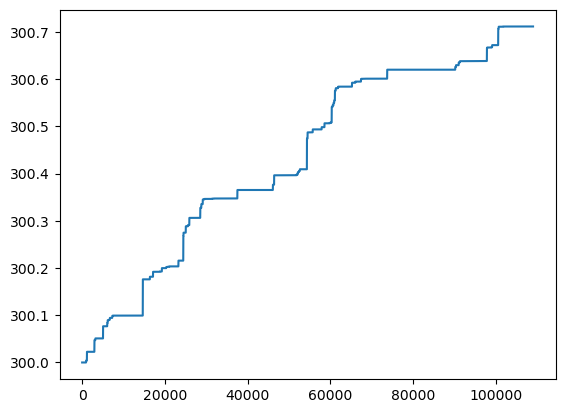

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.1027515292427
Прибыль от 300 usdt за 100_000 тиков: 0.09429254502822741


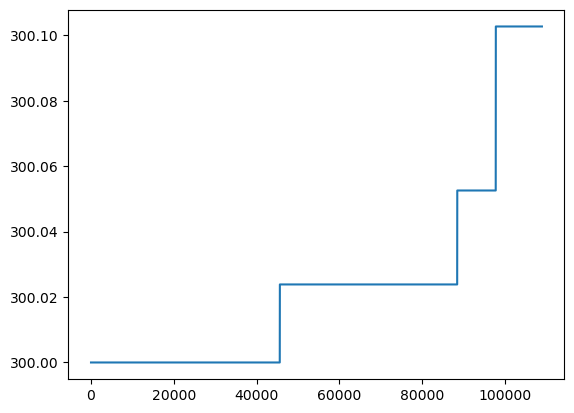

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0073127290509
Прибыль от 300 usdt за 100_000 тиков: 0.0067107111533428005


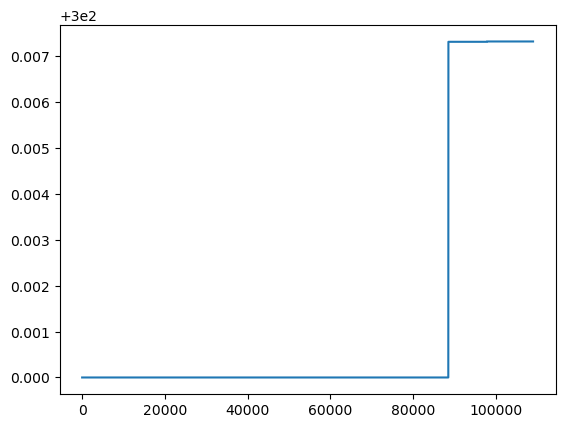

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


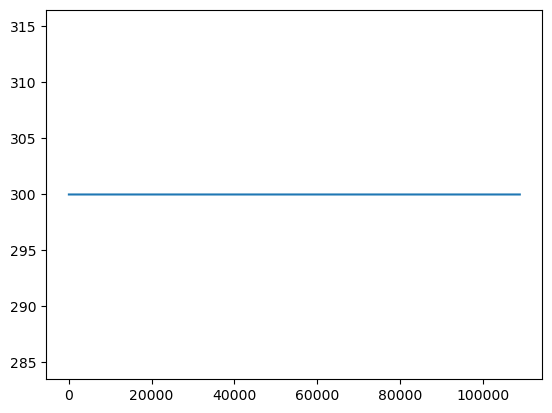

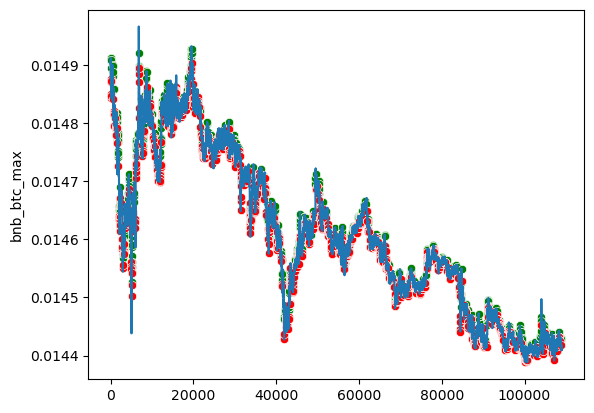

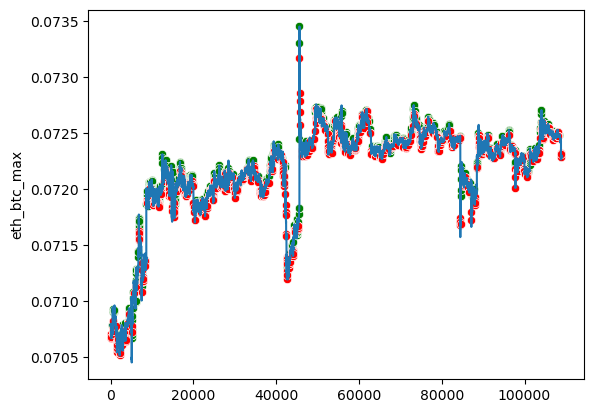

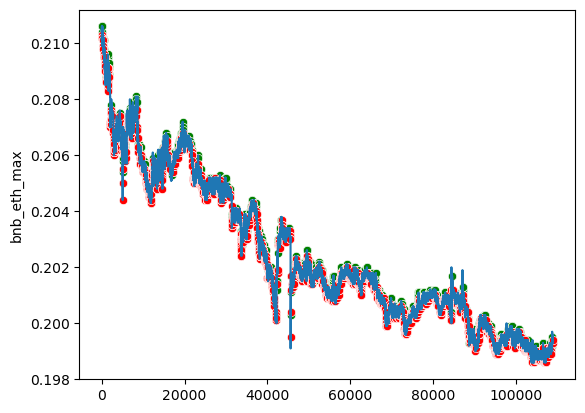

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 5, loss: 0.176
Traid counts: 9198 1: 1741 2: 1853 3: 818 4: 726 5: 2419 6: 1641
              precision    recall  f1-score   support

         0.0       1.00      0.92      0.96    108801
         1.0       0.01      0.52      0.02        31
         2.0       0.01      0.38      0.01        32
         3.0       0.01      0.44      0.02        16
         4.0       0.00      0.06      0.00        16
         5.0       0.01      0.57      0.02        37
         6.0       0.01      0.42      0.02        38

    accuracy                           0.92    108971
   macro avg       0.15      0.47      0.15    108971
weighted avg       1.00      0.92      0.95    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.4016972092562
Прибыль от 300 usdt за 100_000 тиков: 1.2863029698325361


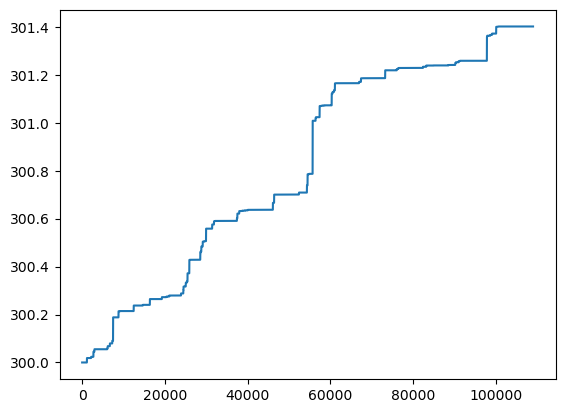

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.25522330984586
Прибыль от 300 usdt за 100_000 тиков: 0.23421213886801082


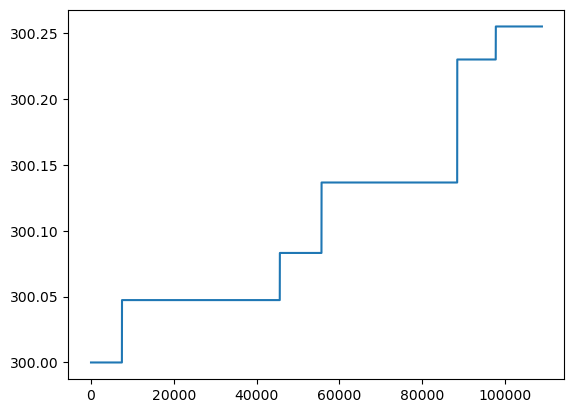

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0073127290509
Прибыль от 300 usdt за 100_000 тиков: 0.0067107111533428005


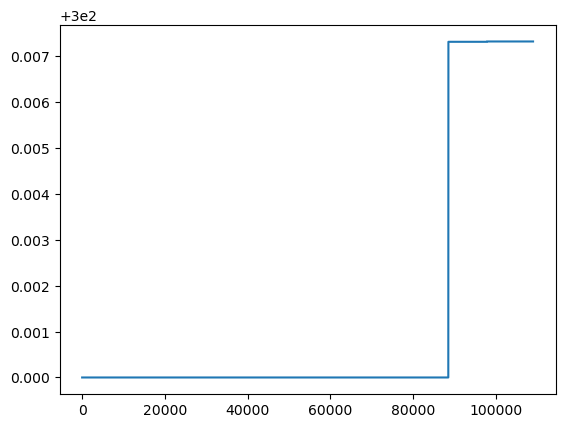

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


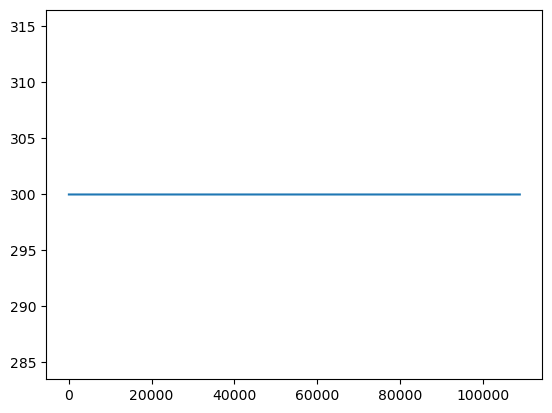

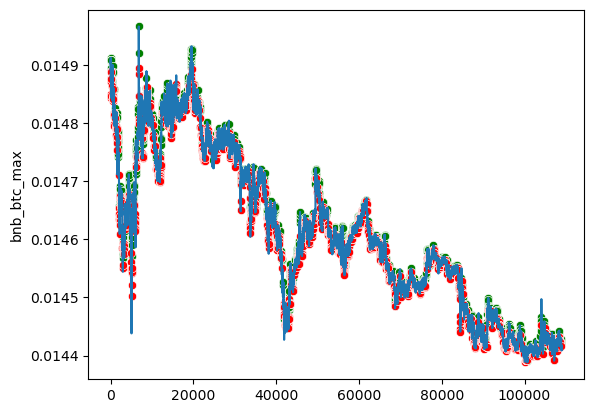

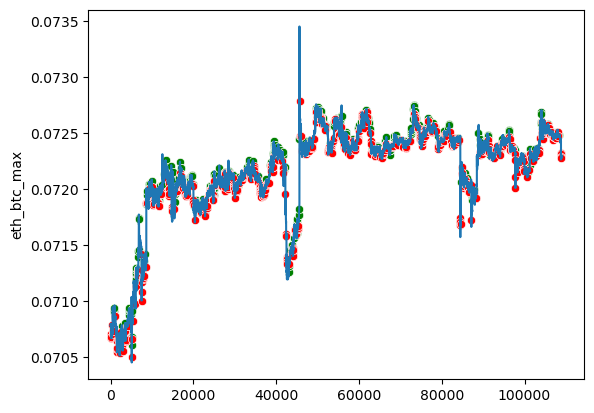

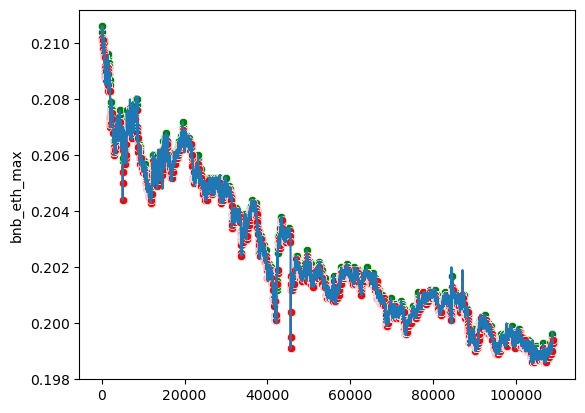

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 10, loss: 0.112
Traid counts: 8228 1: 1535 2: 1615 3: 508 4: 613 5: 2259 6: 1698
              precision    recall  f1-score   support

         0.0       1.00      0.93      0.96    108801
         1.0       0.01      0.45      0.02        31
         2.0       0.01      0.44      0.02        32
         3.0       0.01      0.38      0.02        16
         4.0       0.00      0.19      0.01        16
         5.0       0.01      0.41      0.01        37
         6.0       0.01      0.42      0.02        38

    accuracy                           0.92    108971
   macro avg       0.15      0.46      0.15    108971
weighted avg       1.00      0.92      0.96    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.3751676376427
Прибыль от 300 usdt за 100_000 тиков: 1.2619574360542491


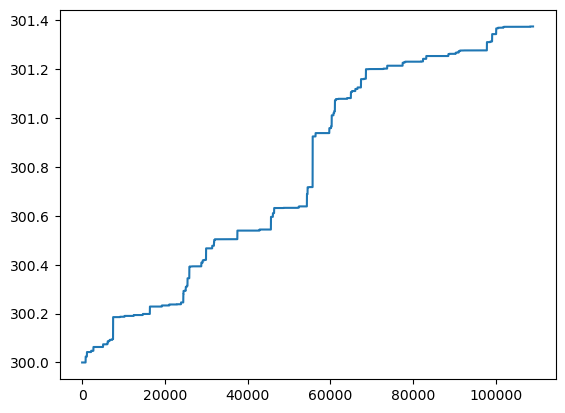

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.25522330984586
Прибыль от 300 usdt за 100_000 тиков: 0.23421213886801082


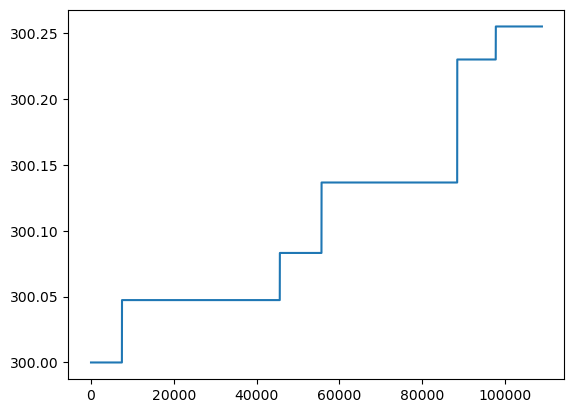

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0073127290509
Прибыль от 300 usdt за 100_000 тиков: 0.0067107111533428005


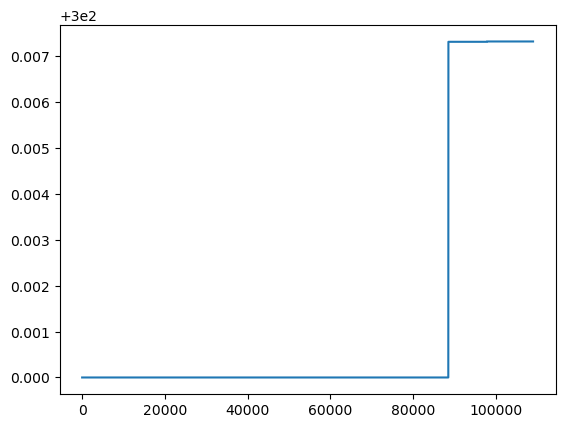

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


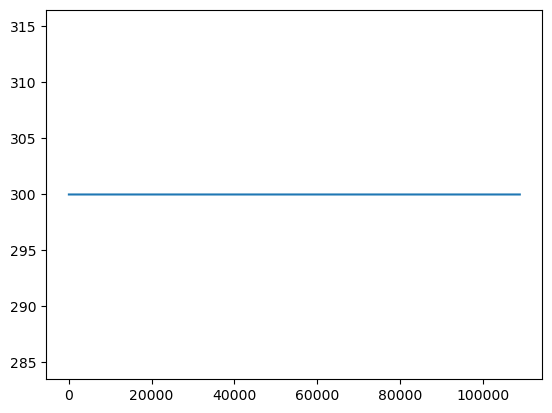

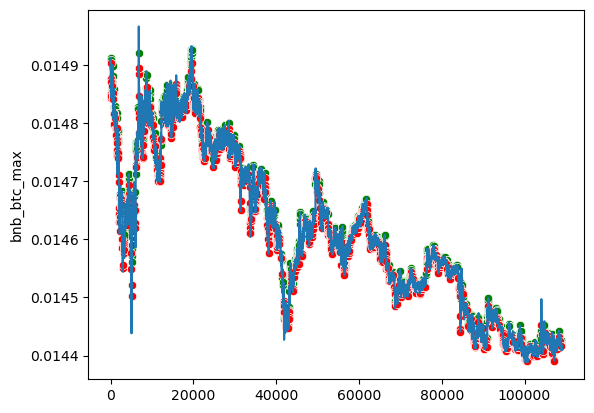

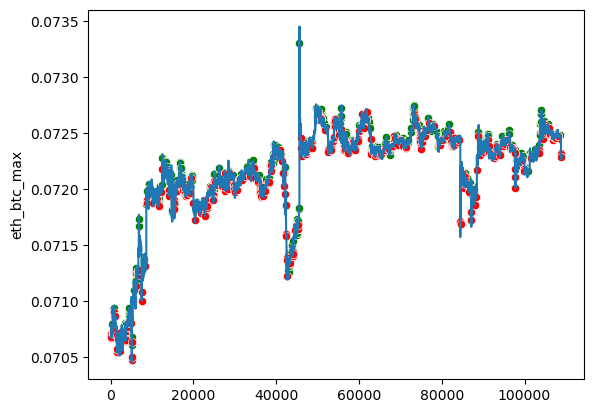

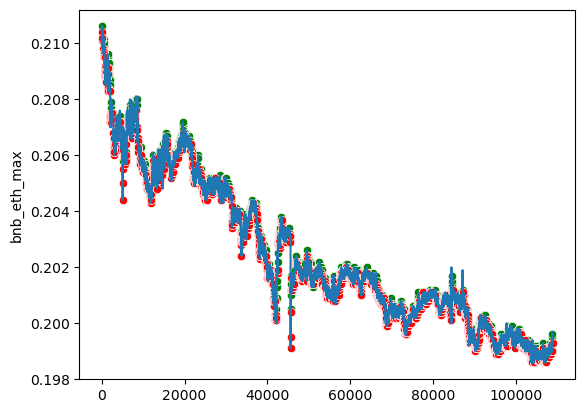

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 15, loss: 0.078
Traid counts: 6665 1: 1142 2: 1408 3: 492 4: 538 5: 1561 6: 1524
              precision    recall  f1-score   support

         0.0       1.00      0.94      0.97    108801
         1.0       0.01      0.32      0.02        31
         2.0       0.01      0.28      0.01        32
         3.0       0.01      0.38      0.02        16
         4.0       0.00      0.12      0.01        16
         5.0       0.01      0.41      0.02        37
         6.0       0.01      0.39      0.02        38

    accuracy                           0.94    108971
   macro avg       0.15      0.41      0.15    108971
weighted avg       1.00      0.94      0.97    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.04338155505593
Прибыль от 300 usdt за 100_000 тиков: 0.957485528311138


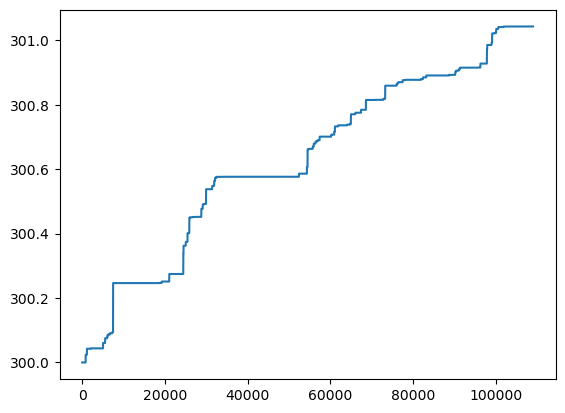

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.22207938816473
Прибыль от 300 usdt за 100_000 тиков: 0.20379677911070798


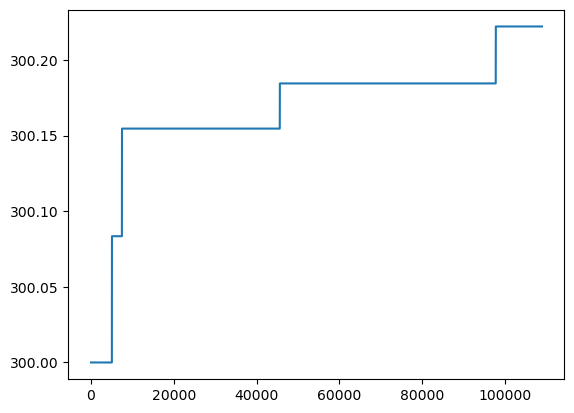

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.03328561281813
Прибыль от 300 usdt за 100_000 тиков: 0.030545386220309403


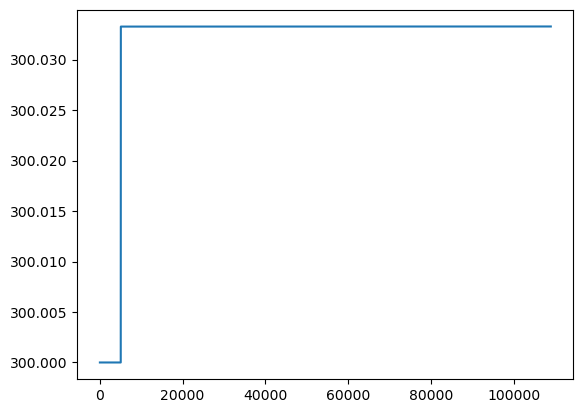

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


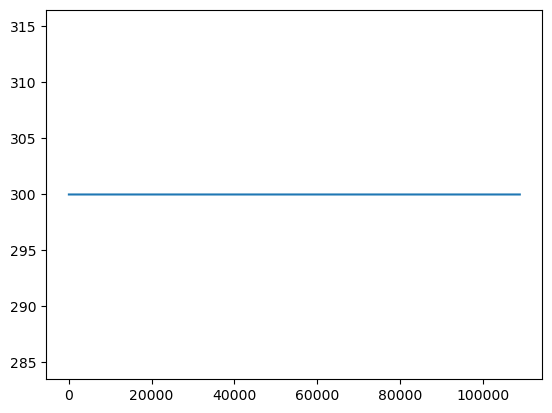

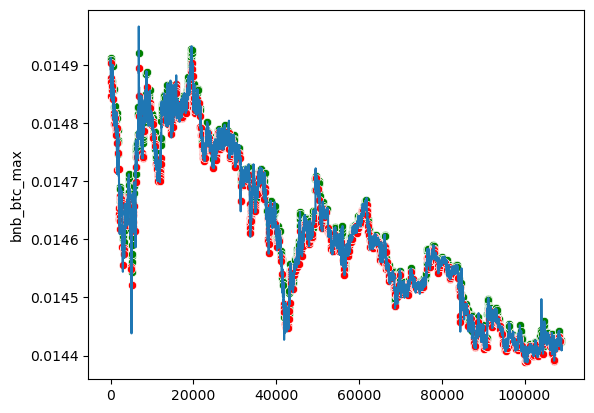

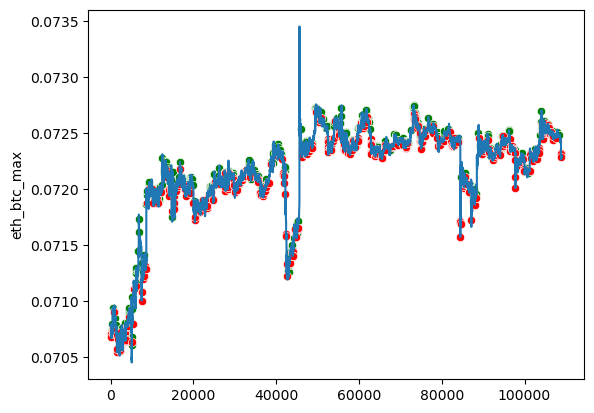

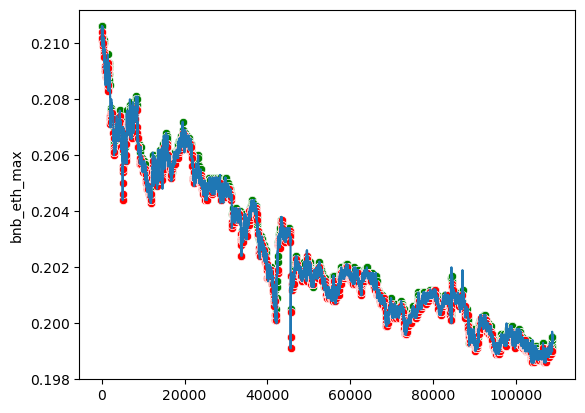

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 20, loss: 0.058
Traid counts: 5357 1: 784 2: 1113 3: 452 4: 482 5: 1181 6: 1345
              precision    recall  f1-score   support

         0.0       1.00      0.95      0.97    108801
         1.0       0.01      0.23      0.02        31
         2.0       0.01      0.31      0.02        32
         3.0       0.01      0.31      0.02        16
         4.0       0.00      0.06      0.00        16
         5.0       0.01      0.32      0.02        37
         6.0       0.01      0.39      0.02        38

    accuracy                           0.95    108971
   macro avg       0.15      0.37      0.15    108971
weighted avg       1.00      0.95      0.97    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.07120886370603
Прибыль от 300 usdt за 100_000 тиков: 0.9830219633719368


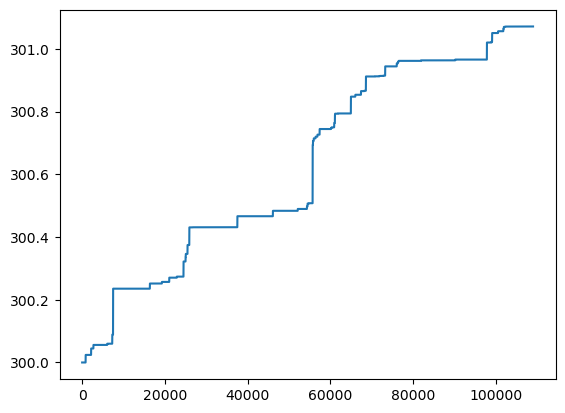

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.1617838031155
Прибыль от 300 usdt за 100_000 тиков: 0.1484650073097406


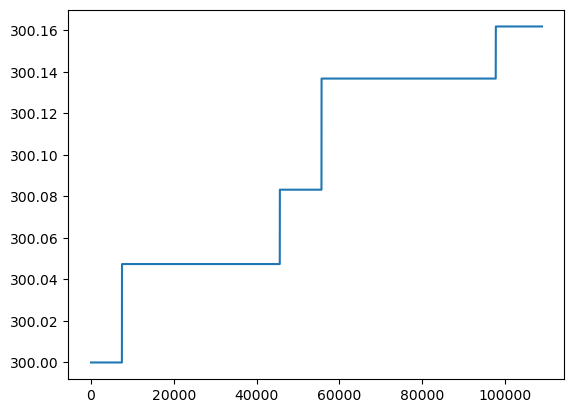

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.00000709457777
Прибыль от 300 usdt за 100_000 тиков: 6.510519099512602e-06


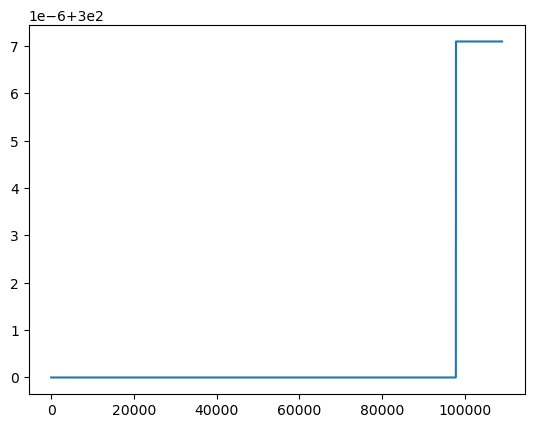

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


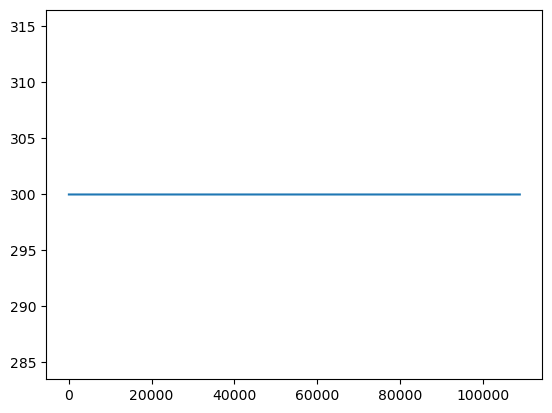

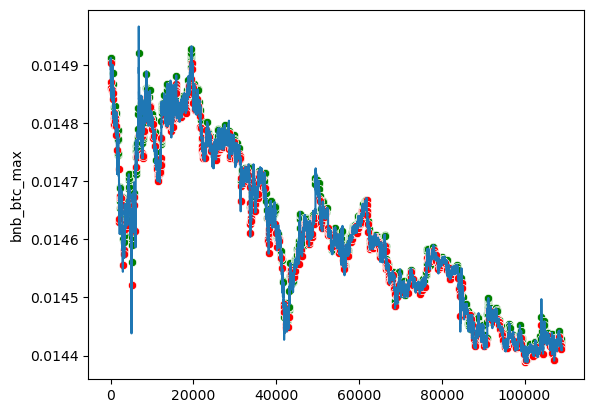

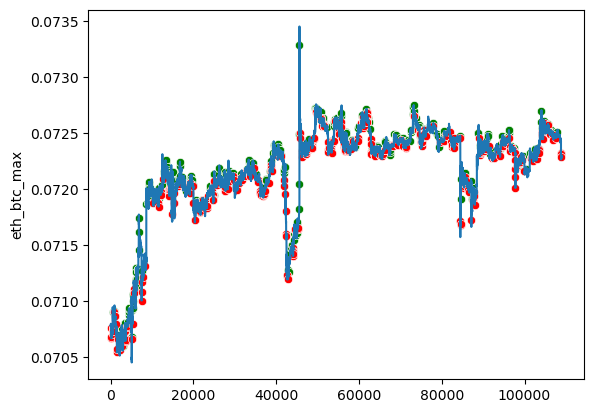

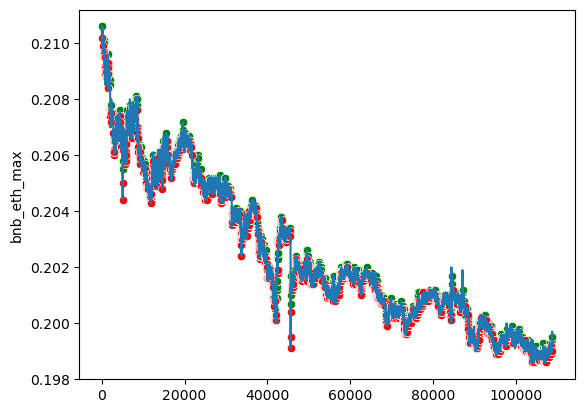

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 25, loss: 0.047
Traid counts: 5674 1: 912 2: 1106 3: 447 4: 558 5: 1242 6: 1409
              precision    recall  f1-score   support

         0.0       1.00      0.95      0.97    108801
         1.0       0.01      0.35      0.02        31
         2.0       0.01      0.19      0.01        32
         3.0       0.01      0.31      0.02        16
         4.0       0.01      0.19      0.01        16
         5.0       0.01      0.35      0.02        37
         6.0       0.01      0.26      0.01        38

    accuracy                           0.95    108971
   macro avg       0.15      0.37      0.15    108971
weighted avg       1.00      0.95      0.97    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.18712989138686
Прибыль от 300 usdt за 100_000 тиков: 1.0893998324204237


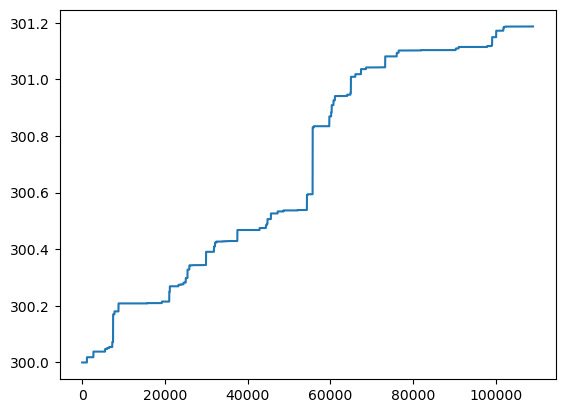

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.13670502659164
Прибыль от 300 usdt за 100_000 тиков: 0.1254508324156352


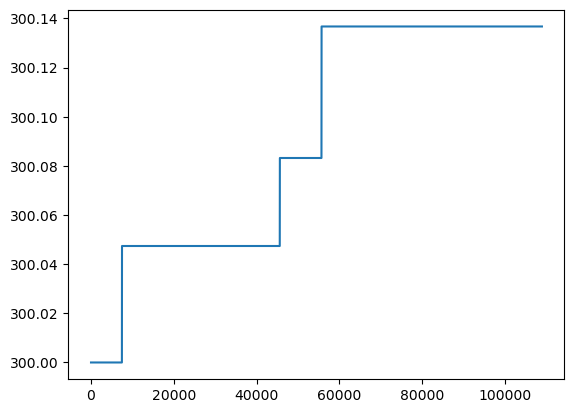

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


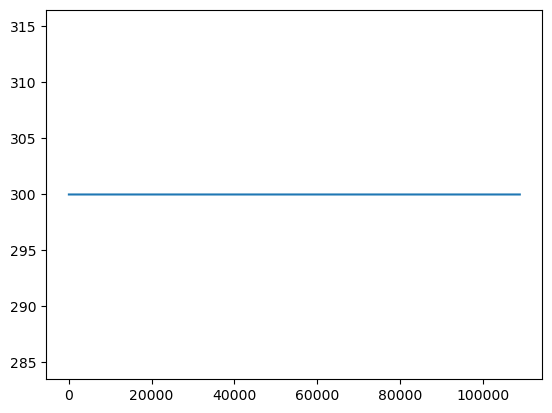

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


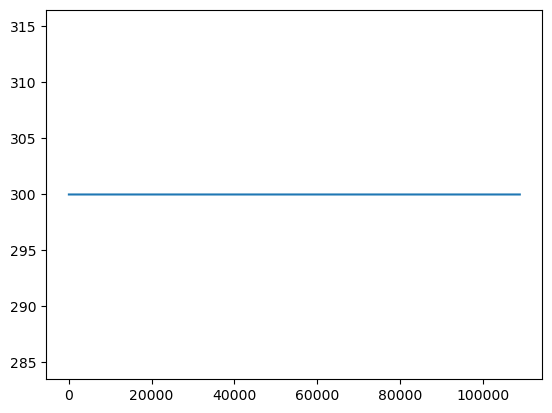

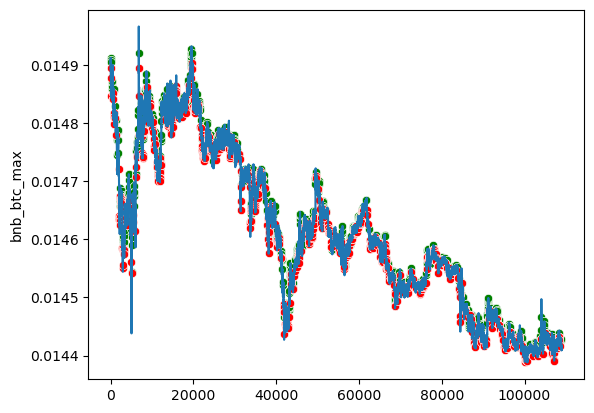

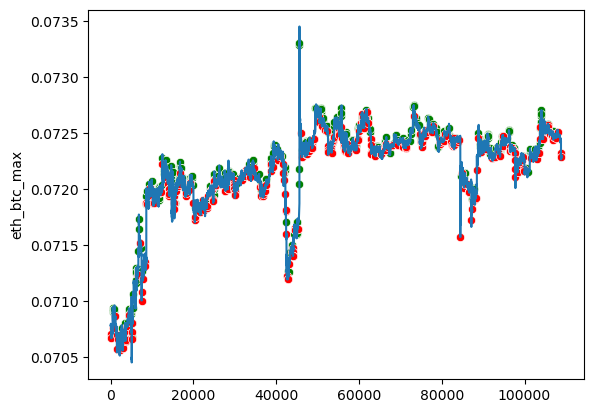

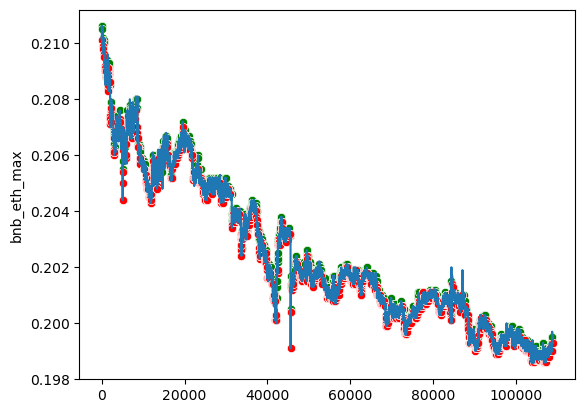

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 30, loss: 0.039
Traid counts: 5547 1: 1030 2: 919 3: 523 4: 460 5: 1169 6: 1446
              precision    recall  f1-score   support

         0.0       1.00      0.95      0.97    108801
         1.0       0.01      0.32      0.02        31
         2.0       0.01      0.22      0.01        32
         3.0       0.01      0.38      0.02        16
         4.0       0.00      0.12      0.01        16
         5.0       0.01      0.38      0.02        37
         6.0       0.01      0.37      0.02        38

    accuracy                           0.95    108971
   macro avg       0.15      0.39      0.15    108971
weighted avg       1.00      0.95      0.97    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.16535856950685
Прибыль от 300 usdt за 100_000 тиков: 1.0694208271070744


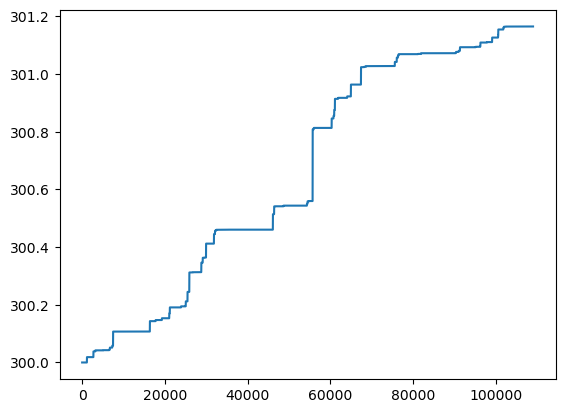

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.1617838031155
Прибыль от 300 usdt за 100_000 тиков: 0.1484650073097406


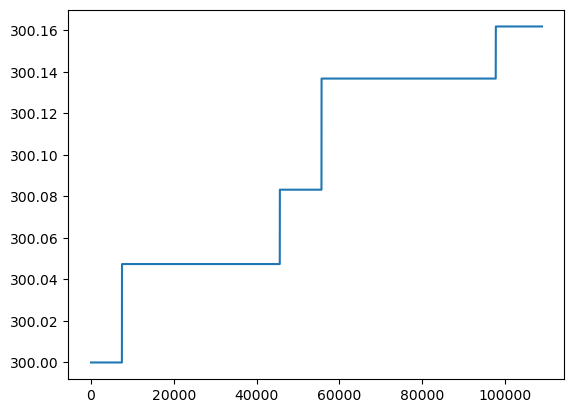

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.00000709457777
Прибыль от 300 usdt за 100_000 тиков: 6.510519099512602e-06


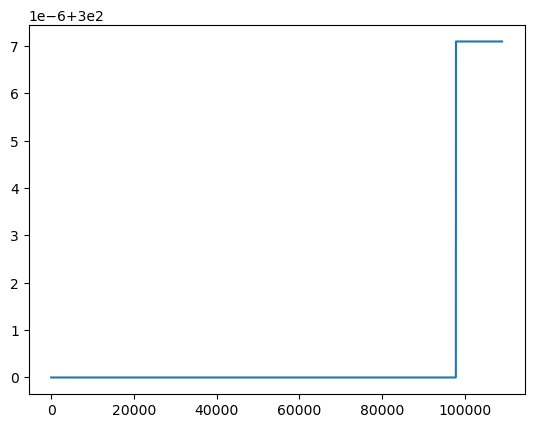

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


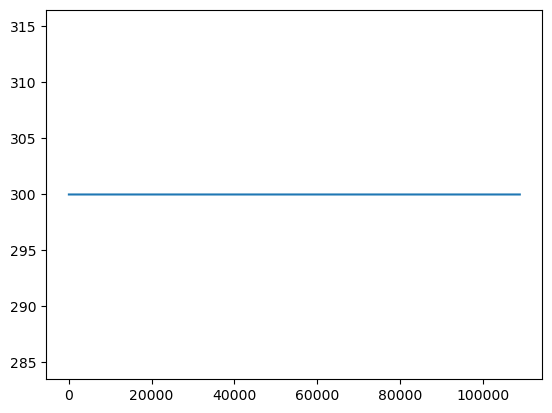

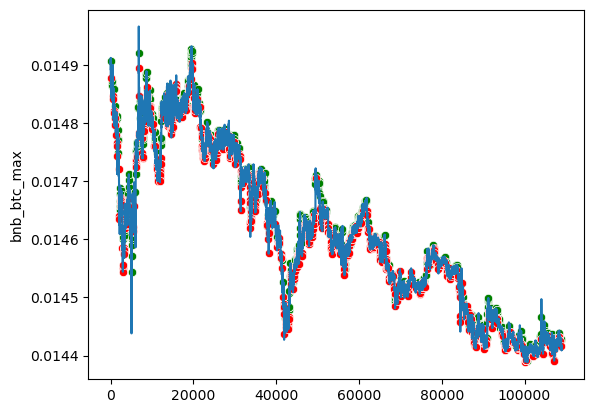

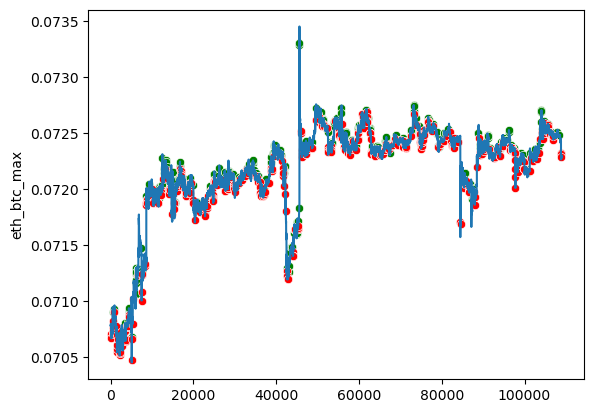

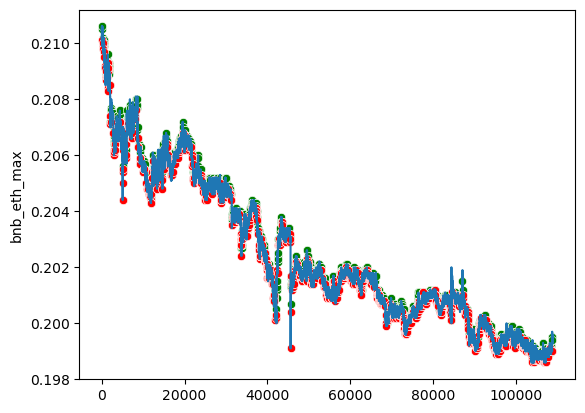

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 35, loss: 0.033
Traid counts: 4576 1: 979 2: 831 3: 433 4: 459 5: 967 6: 907
              precision    recall  f1-score   support

         0.0       1.00      0.96      0.98    108801
         1.0       0.01      0.32      0.02        31
         2.0       0.01      0.16      0.01        32
         3.0       0.01      0.31      0.02        16
         4.0       0.00      0.12      0.01        16
         5.0       0.01      0.27      0.02        37
         6.0       0.01      0.21      0.02        38

    accuracy                           0.96    108971
   macro avg       0.15      0.34      0.15    108971
weighted avg       1.00      0.96      0.98    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.54696255156523
Прибыль от 300 usdt за 100_000 тиков: 0.5019340481093407


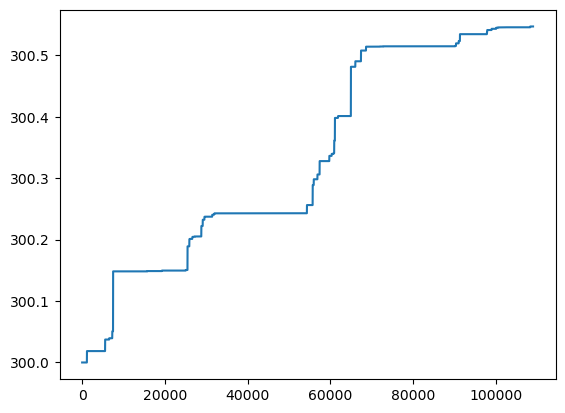

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.1082749418663
Прибыль от 300 usdt за 100_000 тиков: 0.09936124461213008


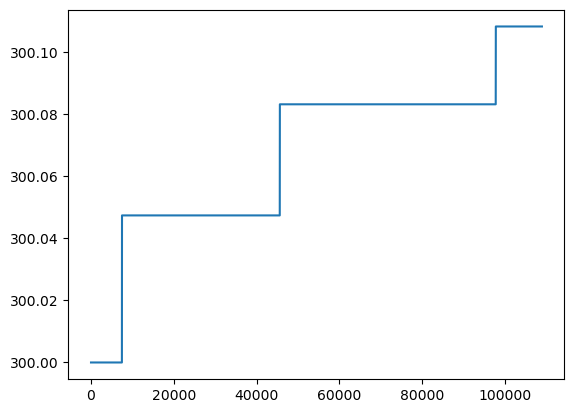

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.00000709457777
Прибыль от 300 usdt за 100_000 тиков: 6.510519099512602e-06


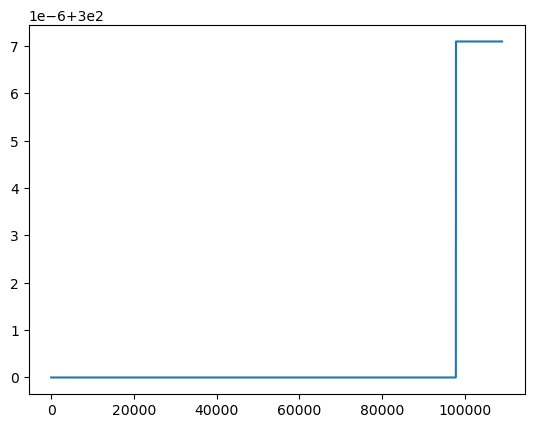

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


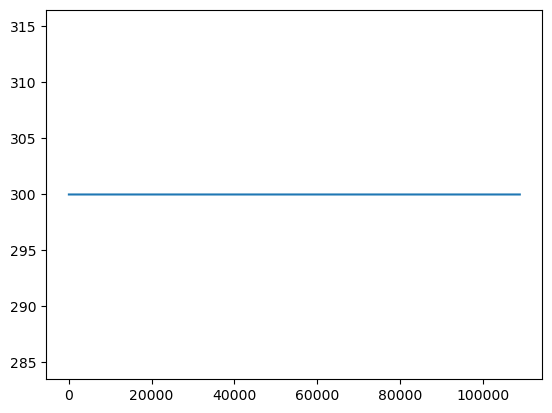

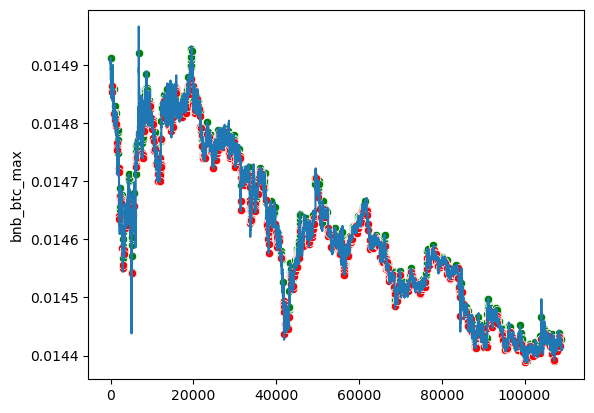

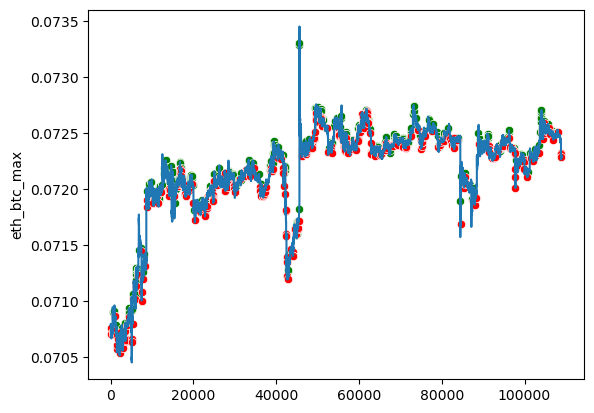

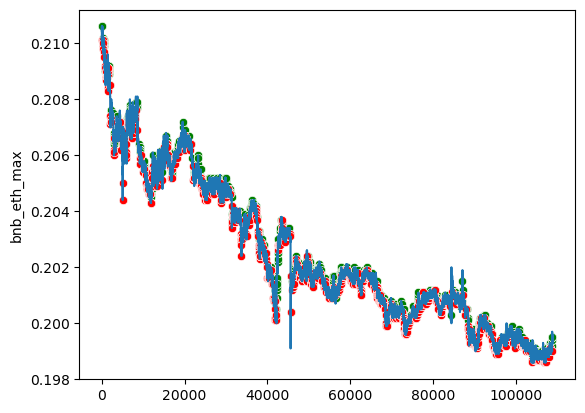

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 40, loss: 0.029
Traid counts: 4535 1: 881 2: 867 3: 414 4: 454 5: 904 6: 1015
              precision    recall  f1-score   support

         0.0       1.00      0.96      0.98    108801
         1.0       0.01      0.32      0.02        31
         2.0       0.00      0.12      0.01        32
         3.0       0.01      0.31      0.02        16
         4.0       0.01      0.25      0.02        16
         5.0       0.01      0.22      0.02        37
         6.0       0.01      0.26      0.02        38

    accuracy                           0.96    108971
   macro avg       0.15      0.35      0.16    108971
weighted avg       1.00      0.96      0.98    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.0042055074738
Прибыль от 300 usdt за 100_000 тиков: 0.9215346353376445


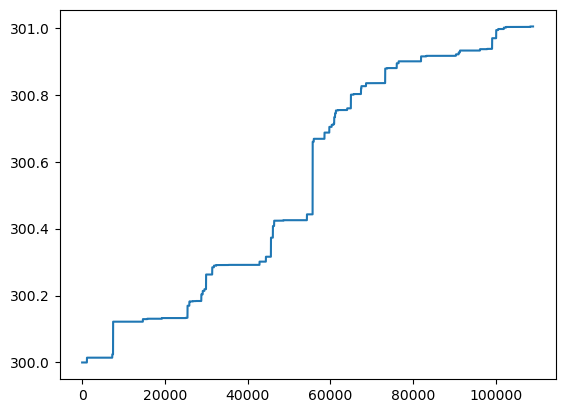

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.13670502659164
Прибыль от 300 usdt за 100_000 тиков: 0.1254508324156352


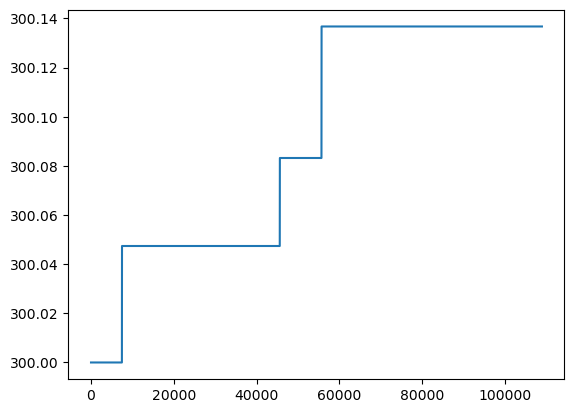

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


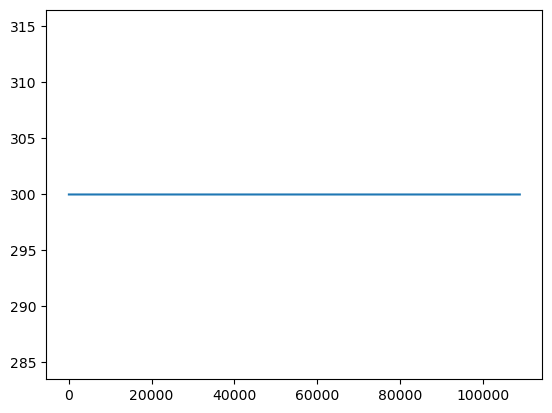

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


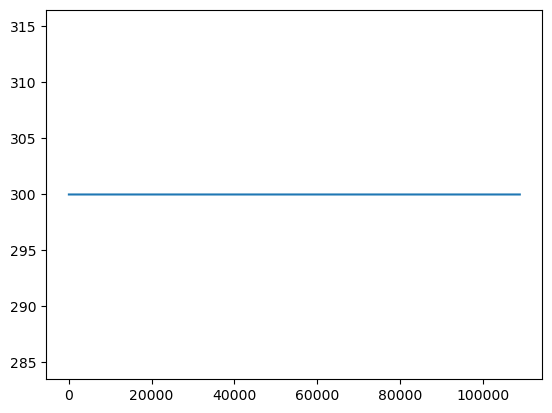

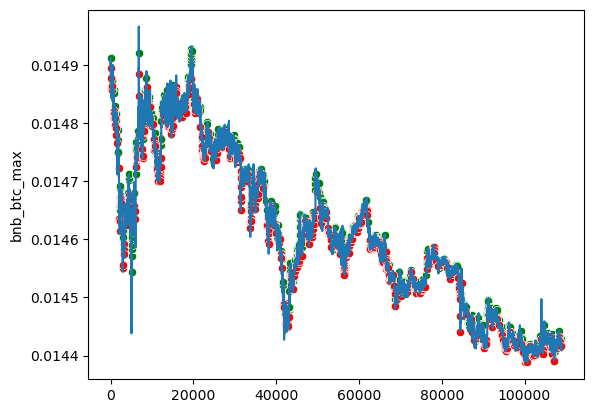

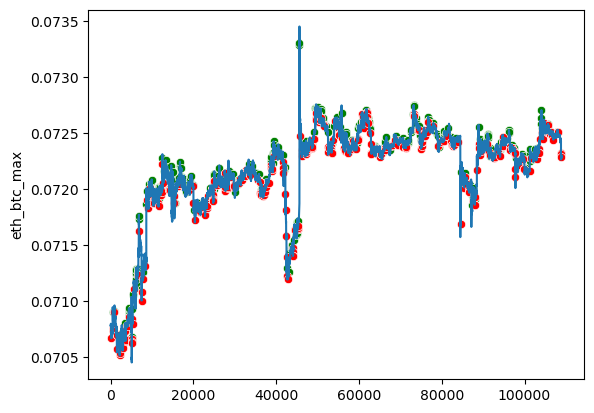

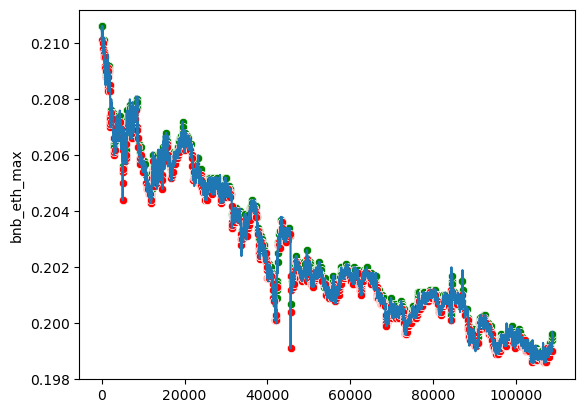

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 45, loss: 0.026
Traid counts: 4319 1: 907 2: 871 3: 361 4: 415 5: 824 6: 941
              precision    recall  f1-score   support

         0.0       1.00      0.96      0.98    108801
         1.0       0.01      0.23      0.01        31
         2.0       0.01      0.25      0.02        32
         3.0       0.01      0.25      0.02        16
         4.0       0.01      0.25      0.02        16
         5.0       0.01      0.27      0.02        37
         6.0       0.01      0.29      0.02        38

    accuracy                           0.96    108971
   macro avg       0.15      0.36      0.16    108971
weighted avg       1.00      0.96      0.98    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.4837247305221
Прибыль от 300 usdt за 100_000 тиков: 0.4439022588781535


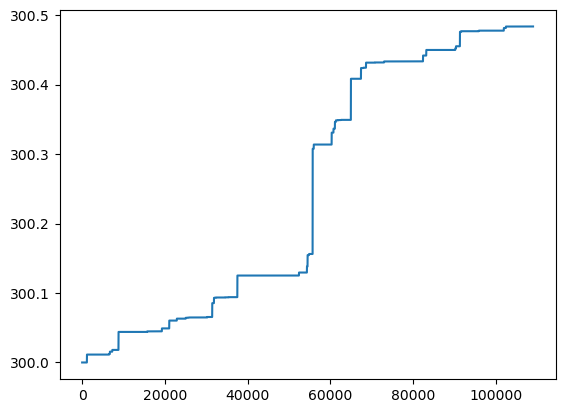

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0697187126255
Прибыль от 300 usdt за 100_000 тиков: 0.06397914364877047


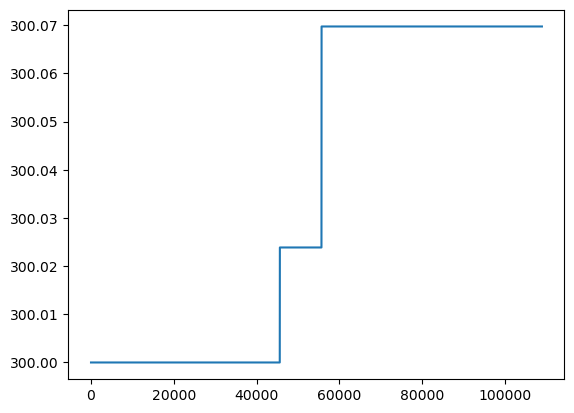

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


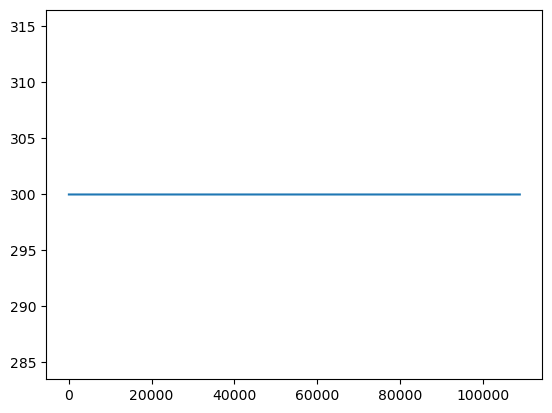

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


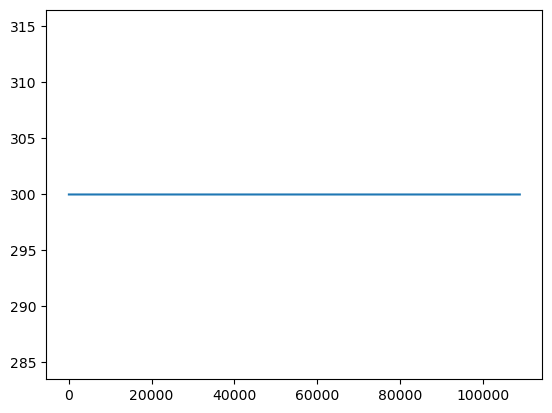

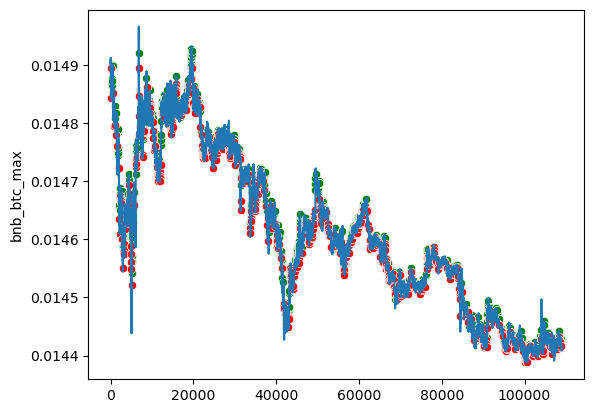

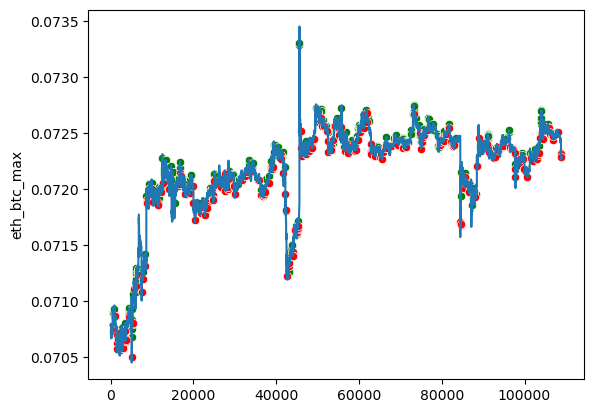

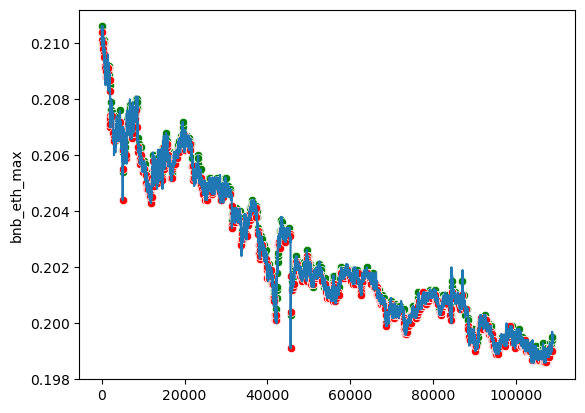

CPU times: total: 4h 50min 10s
Wall time: 7h 17min 54s


In [17]:
%%time

epoch_list = list()
loss_list = list()
traid_counts_list = list()
profit_300_1_list = list()
profit_300_2_list = list()
profit_300_3_list = list()
profit_300_4_list = list()

ticker_price_valid_values = ticker_price_valid.values
ticker_price_valid_fig = ticker_price_valid

res_net_n = ResNet1D_N().to('cuda')

loss_fn = nn.CrossEntropyLoss()
optimizer = optim.Adam(res_net_n.parameters(), lr=0.0001)

for epoch in range(EPOCH):
    loss_array = np.array([], dtype=float)
    for i, batch in enumerate(train_loader):
        optimizer.zero_grad()
        X_small_batch, X_medium_batch, X_big_batch, X_last_min_max_batch,  depth_scaled_batch, y_batch = batch
        X_small_batch = X_small_batch.to('cuda')
        X_medium_batch = X_medium_batch.to('cuda')
        X_big_batch = X_big_batch.to('cuda')
        X_last_min_max_batch = X_last_min_max_batch.to('cuda')
        depth_scaled_batch = depth_scaled_batch.to('cuda')
        y_batch = y_batch.to('cuda')
        output = res_net_n.forward(X_small_batch, X_medium_batch, X_big_batch, X_last_min_max_batch)
        loss =loss_fn(output, y_batch)
        loss.backward()
        optimizer.step()
        loss_array = np.append(loss_array, loss.to('cpu').detach().numpy())
    if epoch % 5 == 0:
        print('---***---***---***---***---***---***---***---***---***---***---***---***---')
        print('Predict start')
        predict = torch.empty((1), dtype=torch.float).to('cuda')
        y_valid_tensor = torch.empty((1), dtype=torch.float)
        
        for i_valid, batch_valid in enumerate(valid_loader):
            X_small_batch_valid, X_medium_batch_valid, X_big_batch_valid, X_last_min_max_batch_valid,  depth_scaled_batch_valid, y_batch_valid = batch_valid
            X_small_batch_valid = X_small_batch_valid.to('cuda')
            X_medium_batch_valid = X_medium_batch_valid.to('cuda')
            X_big_batch_valid = X_big_batch_valid.to('cuda')
            X_last_min_max_batch_valid = X_last_min_max_batch_valid.to('cuda')
            depth_scaled_batch_valid = depth_scaled_batch_valid.to('cuda')
            
            predict_batch = torch.argmax(res_net_n.inference(X_small_batch_valid, X_medium_batch_valid, X_big_batch_valid, X_last_min_max_batch_valid), dim=1)
            predict = torch.cat((predict, predict_batch), 0)
            y_valid_tensor = torch.cat((y_valid_tensor, y_batch_valid), 0)
        
        
        predict = predict[1:]
        y_valid_tensor = y_valid_tensor[1:]
        epoch_list.append(epoch)
        loss_mean = loss_array.mean()
        loss_list.append(loss_mean)
        print(f'Epoch: {epoch}, loss: {loss_mean:.3f}')
        traid_counts = (predict!=0).sum()
        traid_counts_list.append(traid_counts)
        print(f'Traid counts: {traid_counts}',
              f'1: {(predict==1).sum()}',
              f'2: {(predict==2).sum()}',
              f'3: {(predict==3).sum()}',
              f'4: {(predict==4).sum()}',
              f'5: {(predict==5).sum()}',
              f'6: {(predict==6).sum()}'
             )
        predict = predict.to('cpu').detach().numpy()
        print(classification_report(y_valid_tensor.detach().numpy(), predict))
        
        for slip_n in range(1,5):
            print("-------------")
            print(f'SLIP_N = {slip_n}')
            trade_result, volume_not_trade = trade(ticker_price_valid_values, predict, FEE, slip_n)
            trade_result = np.array(trade_result)
            print(f'Без торгов за счёт изменения курса с 300 usdt: {volume_not_trade}')
            print(f'Результат торгов с 300 usdt: {trade_result[-1]}')
            
            profit_300 = (trade_result[-1]-300)*100_000/predict.shape[0]
            if slip_n == 1:
                profit_300_1_list.append(profit_300)
            elif slip_n == 2:
                profit_300_2_list.append(profit_300)
            elif slip_n == 3:
                profit_300_3_list.append(profit_300)
            elif slip_n == 4:
                profit_300_4_list.append(profit_300)
            print(f'Прибыль от 300 usdt за 100_000 тиков: {profit_300}')
            sns.lineplot(x=range(trade_result.shape[0]),y=trade_result)
            plt.show()
            
        # отрисовка сделок на тренде
        x_len = predict.shape[0]

        ticker_price_valid_fig[PAIRS_NAME[0]+'_min'] = ticker_price_valid_values[:,0]*(predict == 1)
        ticker_price_valid_fig[PAIRS_NAME[0]+'_max'] = ticker_price_valid_values[:,0]*(predict == 2)
        ticker_price_valid_fig[PAIRS_NAME[1]+'_min'] = ticker_price_valid_values[:,1]*(predict == 3)
        ticker_price_valid_fig[PAIRS_NAME[1]+'_max'] = ticker_price_valid_values[:,1]*(predict == 4)
        ticker_price_valid_fig[PAIRS_NAME[2]+'_min'] = ticker_price_valid_values[:,2]*(predict == 5)
        ticker_price_valid_fig[PAIRS_NAME[2]+'_max'] = ticker_price_valid_values[:,2]*(predict == 6)
        ticker_price_valid_fig = ticker_price_valid_fig.replace(0, np.nan)

        for i, pair in enumerate(['bnb_btc','eth_btc','bnb_eth']):

            fig, ax = plt.subplots()
            ax.plot(range(x_len),ticker_price_valid_values[:x_len,i])
            #ax.plot(range(x_len),trade_result['bnb_btc_max'][:x_len])
            sns.scatterplot(data=ticker_price_valid_fig[:x_len], x=range(x_len), y=pair+'_max', ax=ax, color='green')
            sns.scatterplot(data=ticker_price_valid_fig[:x_len], x=range(x_len), y=pair+'_min', ax=ax, color='red')
            #plt.ylim([ticker_price_valid_fig[pair+'_min'][:x_len].min(), ticker_price_valid_fig[pair+'_max'][:x_len].max()])
            plt.show()

trade_df = pd.DataFrame(data=[epoch_list, 
                              loss_list, 
                              traid_counts_list, 
                              profit_300_1_list, 
                              profit_300_2_list, 
                              profit_300_3_list, 
                              profit_300_4_list]).T.rename(columns={0:'epoch',
                                                                     1:'loss',
                                                                     2:'traid_counts',
                                                                     3:'profit_300_1',
                                                                     4:'profit_300_2',
                                                                     5:'profit_300_3',
                                                                     6:'profit_300_4'})

In [18]:
trade_df

,epoch,loss,traid_counts,profit_300_1,profit_300_2,profit_300_3,profit_300_4
0,0,0.346211,"tensor(9095, device='cuda:0')",0.653055,0.094293,0.006711,0.0
1,5,0.176022,"tensor(9198, device='cuda:0')",1.286303,0.234212,0.006711,0.0
2,10,0.112188,"tensor(8228, device='cuda:0')",1.261957,0.234212,0.006711,0.0
3,15,0.077955,"tensor(6665, device='cuda:0')",0.957486,0.203797,0.030545,0.0
4,20,0.058462,"tensor(5357, device='cuda:0')",0.983022,0.148465,0.000007,0.0
5,25,0.046686,"tensor(5674, device='cuda:0')",1.0894,0.125451,0.0,0.0
6,30,0.038725,"tensor(5547, device='cuda:0')",1.069421,0.148465,0.000007,0.0
7,35,0.033264,"tensor(4576, device='cuda:0')",0.501934,0.099361,0.000007,0.0
8,40,0.02923,"tensor(4535, device='cuda:0')",0.921535,0.125451,0.0,0.0
9,45,0.026327,"tensor(4319, device='cuda:0')",0.443902,0.063979,0.0,0.0


In [42]:
trade_df

NameError: name 'trade_df' is not defined

In [ ]:
trade_df[trade_df['profit_300_1'] == trade_df['profit_300_1'].max()]

## Модель LineNet

In [15]:
class LineNet(nn.Module):
    def __init__(self):
        super(LineNet,self).__init__()
        
        self.linear_small = nn.Linear(in_features=FEATURES_LENGTH_SMALL*6, out_features=64, bias=True)
        self.bn_small = nn.BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        
        self.linear_medium = nn.Linear(in_features=FEATURES_LENGTH_MEDIUM*6, out_features=256, bias=True)
        self.bn_medium = nn.BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)        
        
        self.linear_big = nn.Linear(in_features=FEATURES_LENGTH_BIG*6, out_features=512, bias=True)
        self.bn_big = nn.BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)        
        
        self.linear_min_max = nn.Linear(in_features=36, out_features=64, bias=True)
        self.bn_min_max = nn.BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)         
        
        self.linear_depth = nn.Linear(in_features=120, out_features=256, bias=True)
        self.bn_depth = nn.BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)        
        
        self.linear2 = nn.Linear(in_features=1152, out_features=1024, bias=True)
        self.bn2 = nn.BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.linear3 = nn.Linear(in_features=1024, out_features=512, bias=True)
        self.bn3 = nn.BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.linear4 = nn.Linear(in_features=512, out_features=1024, bias=True)
        self.bn4 = nn.BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
                
        self.linear5 = nn.Linear(1024, 7, bias=False)
        self.sm = nn.Softmax(dim=1)

    def forward(self, X_small_batch, X_medium_batch, X_big_batch, X_last_min_max_batch,  depth_scaled_batch):
        
        X_small_batch = torch.flatten(X_small_batch, start_dim=1)
        X_small_batch = self.linear_small(X_small_batch)
        X_small_batch = self.bn_small(X_small_batch)
        X_small_batch = F.relu(X_small_batch)
        
        X_medium_batch = torch.flatten(X_medium_batch, start_dim=1)
        X_medium_batch = self.linear_medium(X_medium_batch)
        X_medium_batch = self.bn_medium(X_medium_batch)
        X_medium_batch = F.relu(X_medium_batch)        
        
        X_big_batch = torch.flatten(X_big_batch, start_dim=1)
        X_big_batch = self.linear_big(X_big_batch)
        X_big_batch = self.bn_big(X_big_batch)
        X_big_batch = F.relu(X_big_batch)        
        
        X_last_min_max_batch = self.linear_min_max(X_last_min_max_batch)
        X_last_min_max_batch = self.bn_min_max(X_last_min_max_batch)
        X_last_min_max_batch = F.relu(X_last_min_max_batch)         
        
        depth_scaled_batch = self.linear_depth(depth_scaled_batch)
        depth_scaled_batch = self.bn_depth(depth_scaled_batch)
        depth_scaled_batch = F.relu(depth_scaled_batch)         

        x = torch.cat((X_small_batch, X_medium_batch, X_big_batch, X_last_min_max_batch, depth_scaled_batch), 1)
        
        x = self.linear2(x)
        x = self.bn2(x)
        x = F.relu(x)        
        x = self.linear3(x)
        x = self.bn3(x)
        x = F.relu(x)        
        x = self.linear4(x)
        x = self.bn4(x)        
        x = F.relu(x)               
        x = self.linear5(x)
        return x
    
    def inference(self, X_small_batch, X_medium_batch, X_big_batch, X_last_min_max_batch,  depth_scaled_batch):
        x = self.forward(X_small_batch, X_medium_batch, X_big_batch, X_last_min_max_batch,  depth_scaled_batch)
        x = self.sm(x)
        return x 

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 0, loss: 0.809
Traid counts: 20606 1: 3966 2: 1331 3: 2079 4: 1956 5: 5248 6: 6026
              precision    recall  f1-score   support

         0.0       1.00      0.81      0.90    108801
         1.0       0.00      0.55      0.01        31
         2.0       0.00      0.19      0.01        32
         3.0       0.00      0.44      0.01        16
         4.0       0.00      0.44      0.01        16
         5.0       0.01      0.73      0.01        37
         6.0       0.00      0.68      0.01        38

    accuracy                           0.81    108971
   macro avg       0.15      0.55      0.14    108971
weighted avg       1.00      0.81      0.89    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 302.3941358481226
Прибыль от 300 usdt за 100_000 тиков: 2.197039439963452


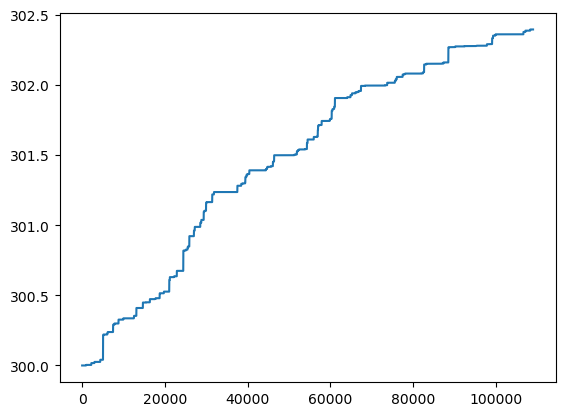

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.2420379245305
Прибыль от 300 usdt за 100_000 тиков: 0.2221122358522057


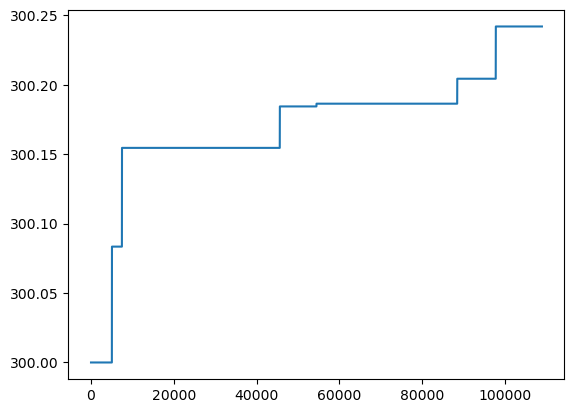

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0369384300547
Прибыль от 300 usdt за 100_000 тиков: 0.03389748653743105


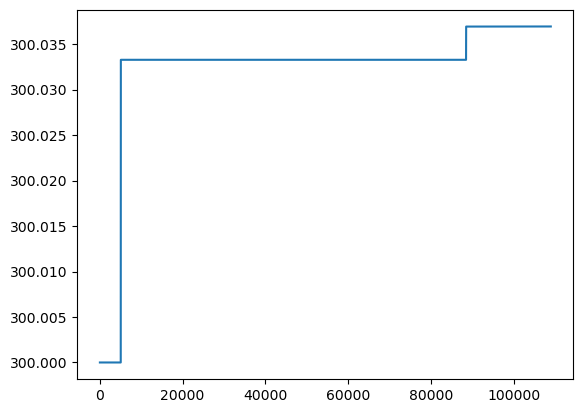

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


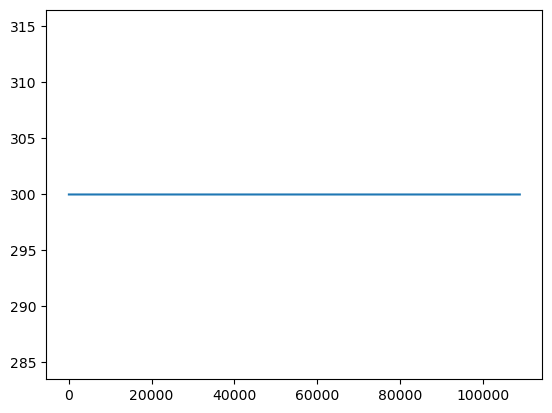

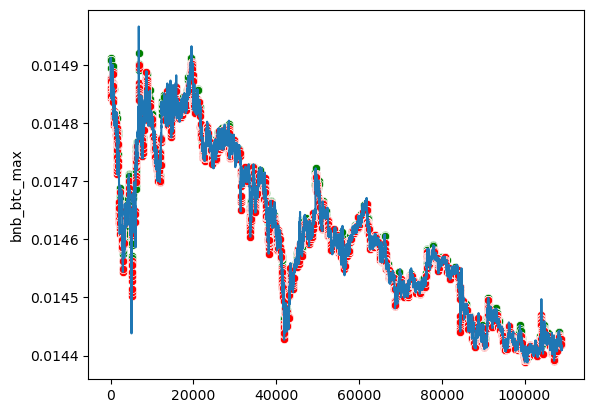

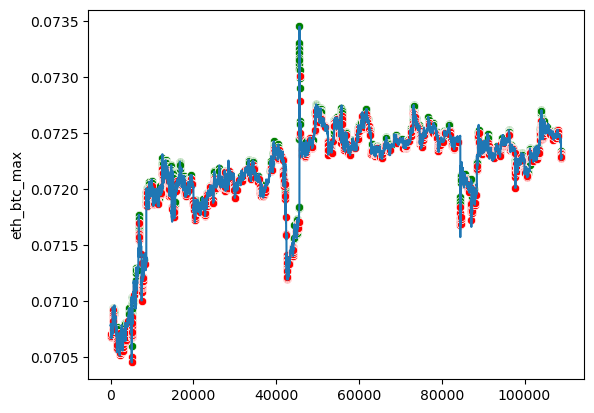

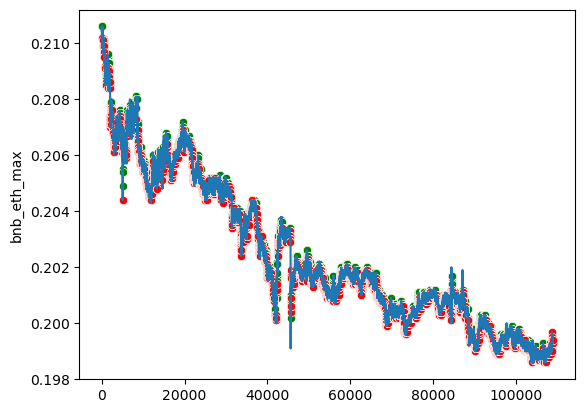

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 5, loss: 0.316
Traid counts: 17839 1: 2847 2: 1701 3: 1509 4: 1666 5: 4252 6: 5864
              precision    recall  f1-score   support

         0.0       1.00      0.84      0.91    108801
         1.0       0.01      0.65      0.01        31
         2.0       0.01      0.53      0.02        32
         3.0       0.01      0.50      0.01        16
         4.0       0.00      0.44      0.01        16
         5.0       0.01      0.70      0.01        37
         6.0       0.00      0.74      0.01        38

    accuracy                           0.84    108971
   macro avg       0.15      0.63      0.14    108971
weighted avg       1.00      0.84      0.91    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.8233211205584
Прибыль от 300 usdt за 100_000 тиков: 1.6732168380196344


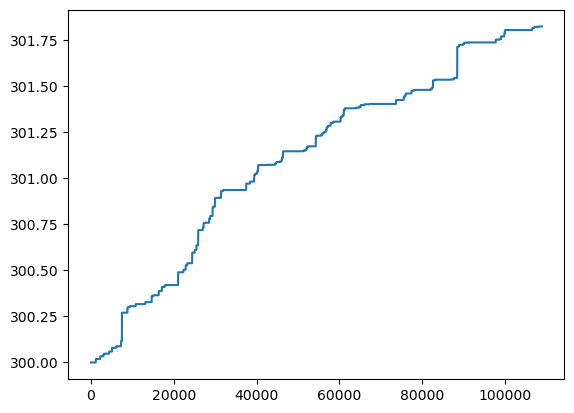

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.36178750341764
Прибыль от 300 usdt за 100_000 тиков: 0.33200347194909197


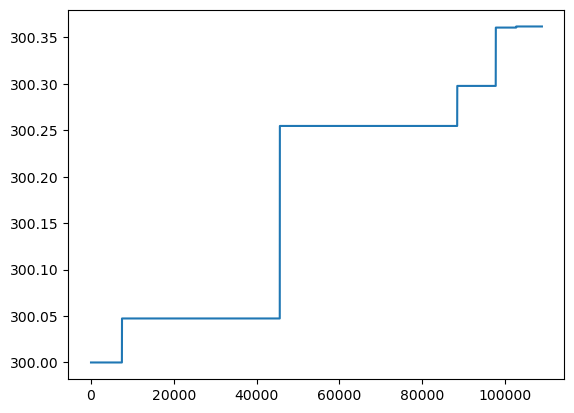

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.09157250385095
Прибыль от 300 usdt за 100_000 тиков: 0.08403382904713634


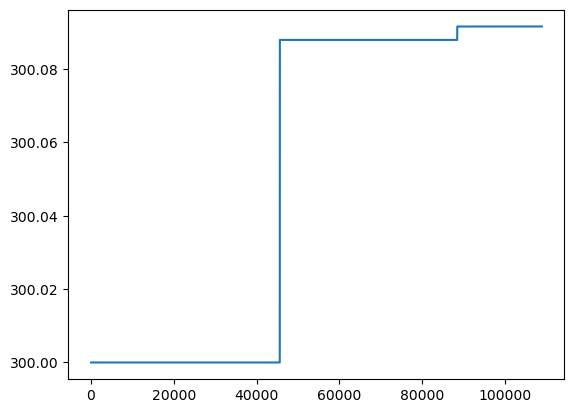

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0376704135977
Прибыль от 300 usdt за 100_000 тиков: 0.03456920978765845


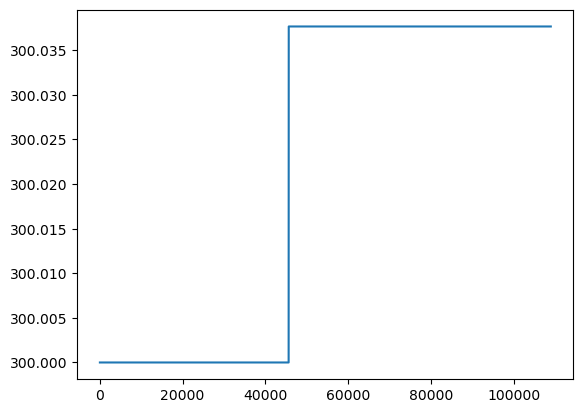

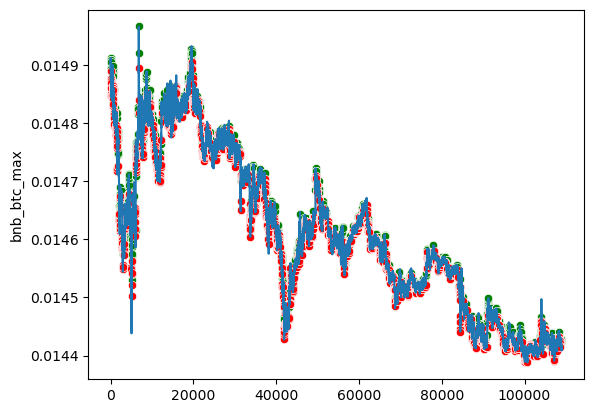

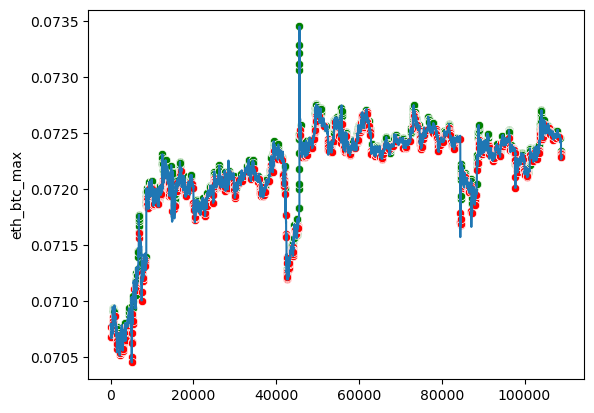

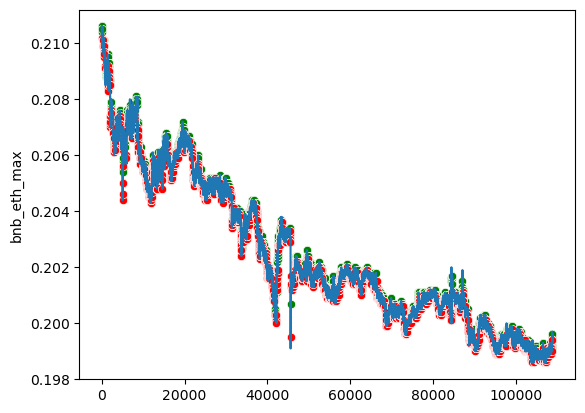

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 10, loss: 0.248
Traid counts: 12718 1: 2064 2: 1341 3: 981 4: 1093 5: 2920 6: 4319
              precision    recall  f1-score   support

         0.0       1.00      0.88      0.94    108801
         1.0       0.01      0.61      0.02        31
         2.0       0.01      0.38      0.02        32
         3.0       0.01      0.38      0.01        16
         4.0       0.00      0.31      0.01        16
         5.0       0.01      0.49      0.01        37
         6.0       0.01      0.58      0.01        38

    accuracy                           0.88    108971
   macro avg       0.15      0.52      0.15    108971
weighted avg       1.00      0.88      0.94    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.4597379185943
Прибыль от 300 usdt за 100_000 тиков: 1.339565497787786


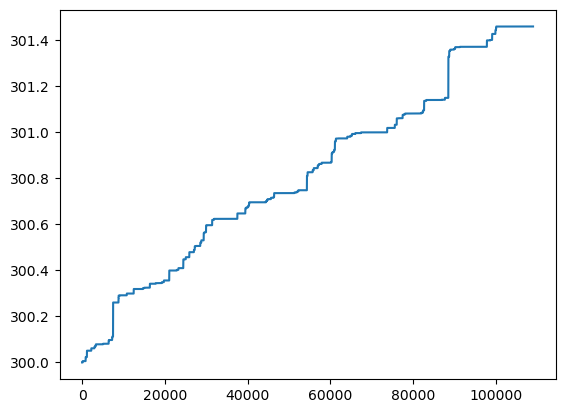

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.1521258447202
Прибыль от 300 usdt за 100_000 тиков: 0.13960213700912827


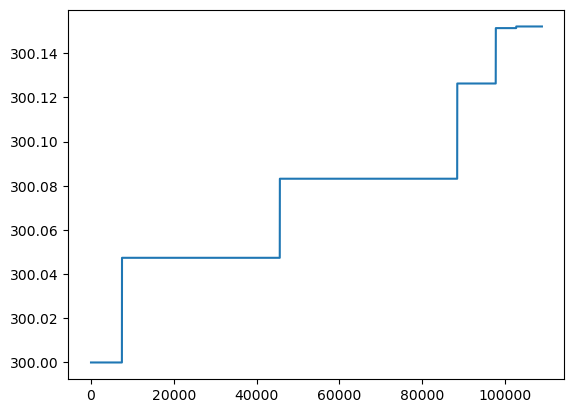

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0073127290509
Прибыль от 300 usdt за 100_000 тиков: 0.0067107111533428005


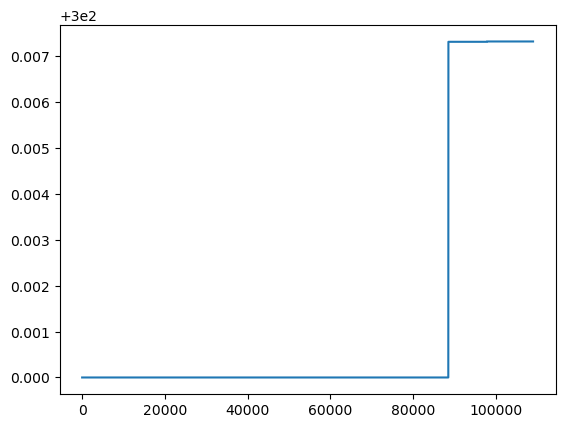

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


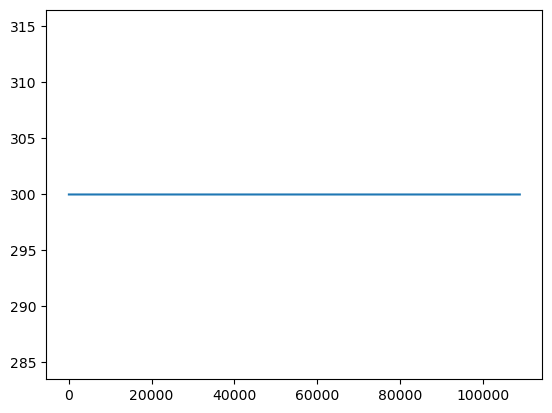

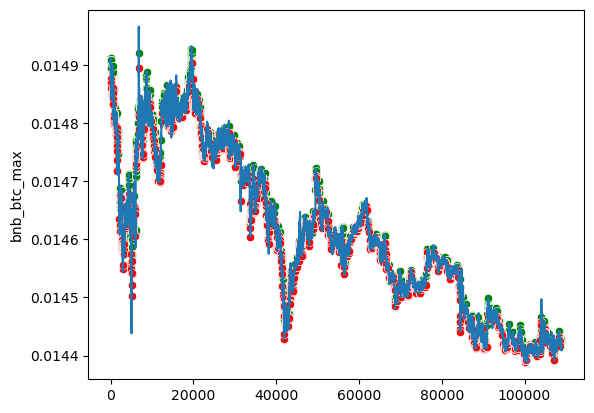

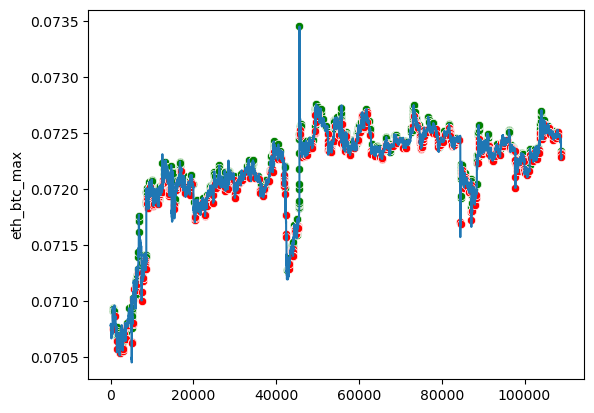

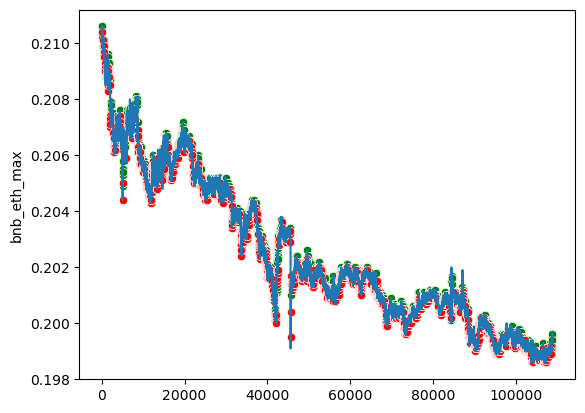

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 15, loss: 0.192
Traid counts: 9278 1: 1566 2: 1176 3: 873 4: 665 5: 2070 6: 2928
              precision    recall  f1-score   support

         0.0       1.00      0.92      0.96    108801
         1.0       0.01      0.48      0.02        31
         2.0       0.01      0.44      0.02        32
         3.0       0.01      0.31      0.01        16
         4.0       0.00      0.19      0.01        16
         5.0       0.01      0.41      0.01        37
         6.0       0.00      0.37      0.01        38

    accuracy                           0.91    108971
   macro avg       0.15      0.44      0.15    108971
weighted avg       1.00      0.91      0.95    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.9400935281731
Прибыль от 300 usdt за 100_000 тиков: 0.8627006526260401


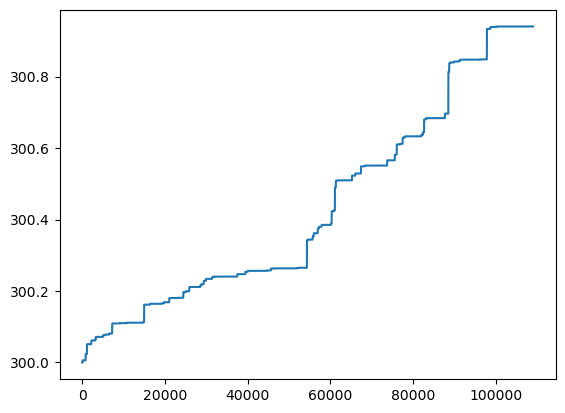

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.145442918784
Прибыль от 300 usdt за 100_000 тиков: 0.1334693806462262


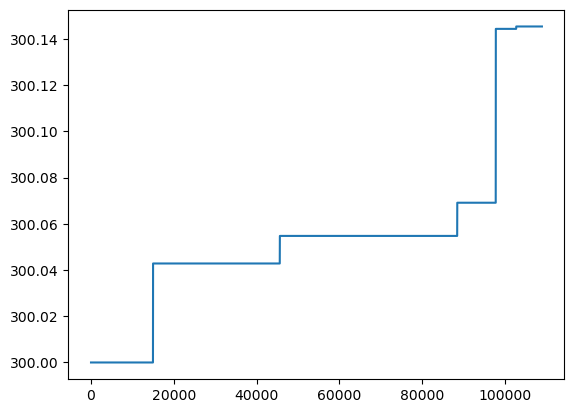

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0073127290509
Прибыль от 300 usdt за 100_000 тиков: 0.0067107111533428005


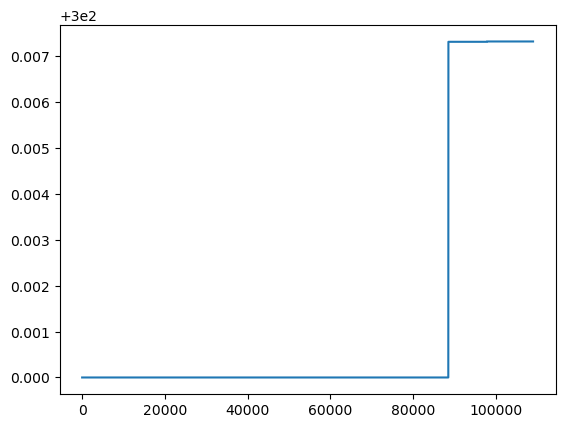

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


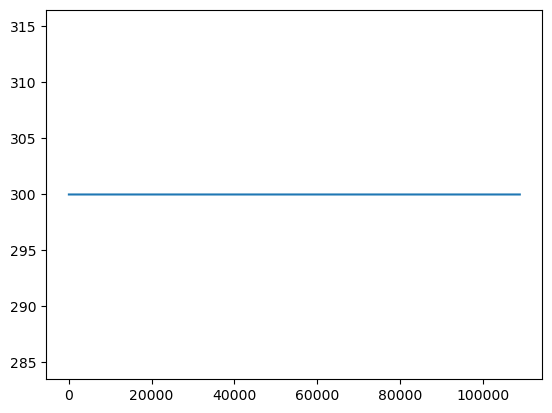

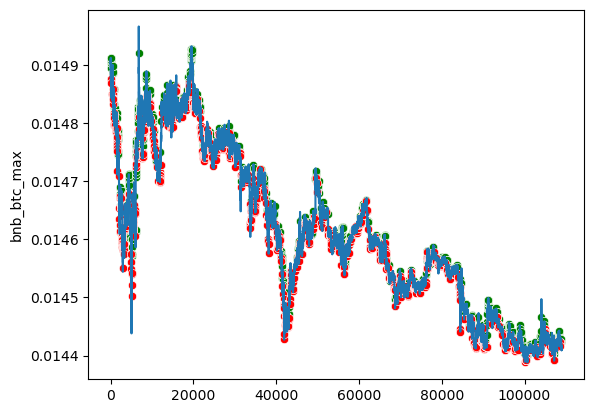

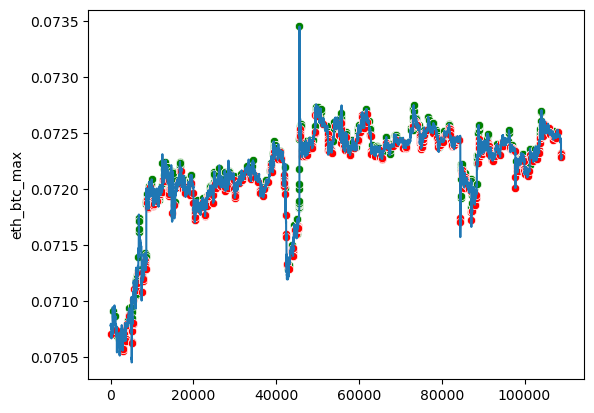

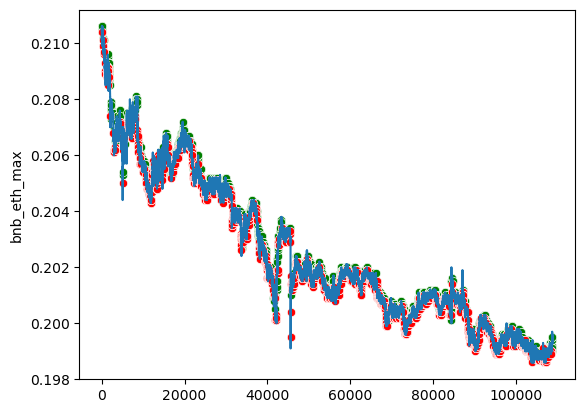

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 20, loss: 0.156
Traid counts: 7561 1: 1386 2: 1118 3: 710 4: 515 5: 1589 6: 2243
              precision    recall  f1-score   support

         0.0       1.00      0.93      0.96    108801
         1.0       0.01      0.52      0.02        31
         2.0       0.01      0.41      0.02        32
         3.0       0.01      0.25      0.01        16
         4.0       0.01      0.19      0.01        16
         5.0       0.01      0.32      0.01        37
         6.0       0.00      0.26      0.01        38

    accuracy                           0.93    108971
   macro avg       0.15      0.41      0.15    108971
weighted avg       1.00      0.93      0.96    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.80262294999875
Прибыль от 300 usdt за 100_000 тиков: 0.7365472923977474


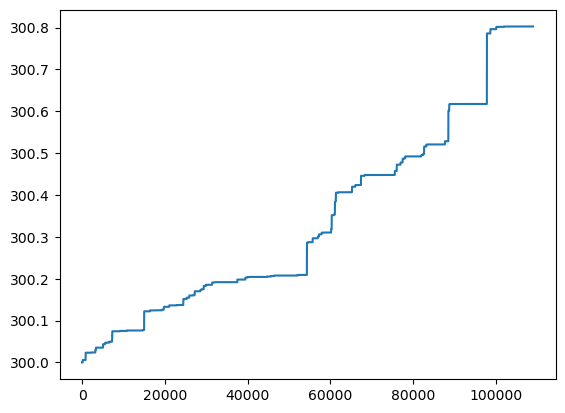

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.1480254953299
Прибыль от 300 usdt за 100_000 тиков: 0.13583934746847823


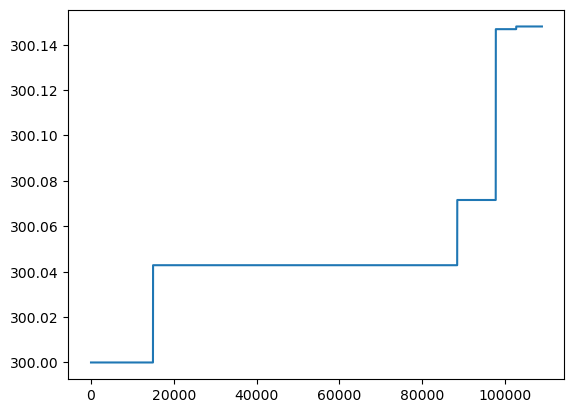

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0073127290509
Прибыль от 300 usdt за 100_000 тиков: 0.0067107111533428005


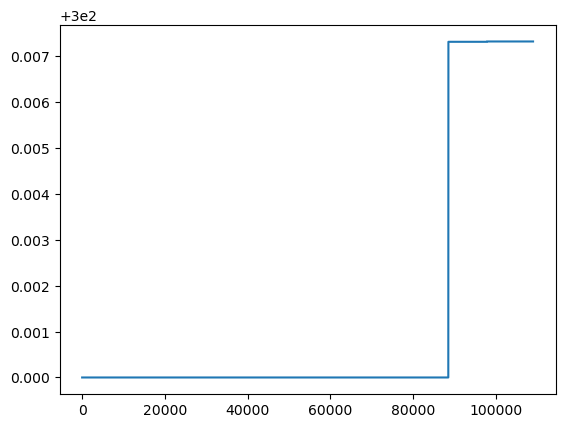

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


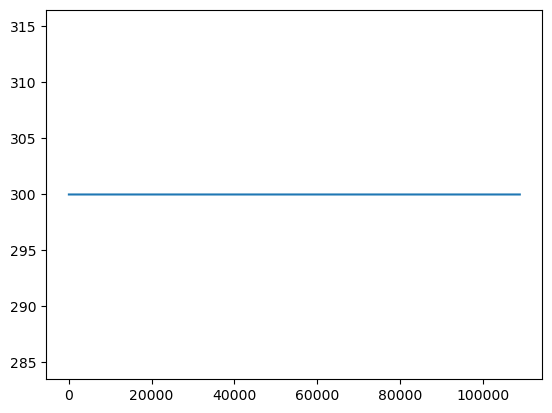

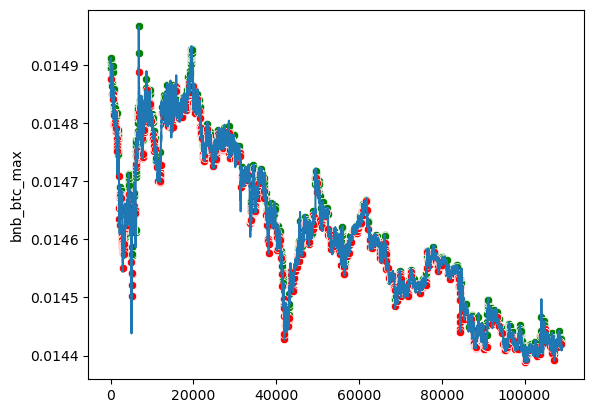

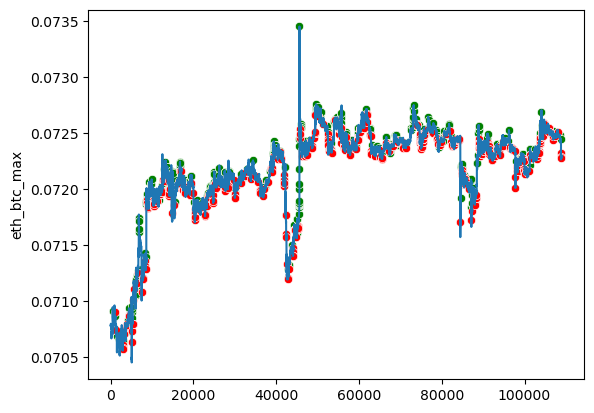

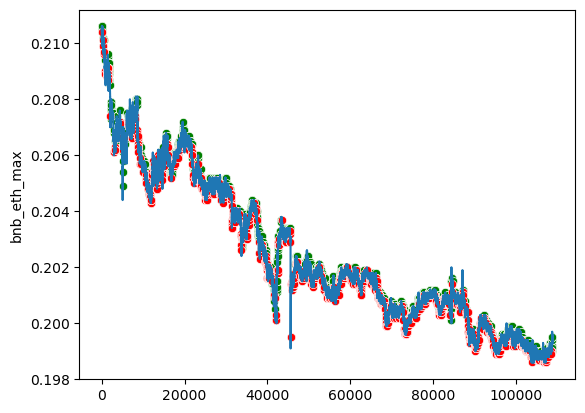

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 25, loss: 0.125
Traid counts: 6633 1: 1127 2: 1110 3: 744 4: 355 5: 1300 6: 1997
              precision    recall  f1-score   support

         0.0       1.00      0.94      0.97    108801
         1.0       0.01      0.45      0.02        31
         2.0       0.01      0.31      0.02        32
         3.0       0.01      0.31      0.01        16
         4.0       0.00      0.06      0.01        16
         5.0       0.01      0.32      0.02        37
         6.0       0.00      0.24      0.01        38

    accuracy                           0.94    108971
   macro avg       0.15      0.38      0.15    108971
weighted avg       1.00      0.94      0.97    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.5852734029909
Прибыль от 300 usdt за 100_000 тиков: 0.5370909719015874


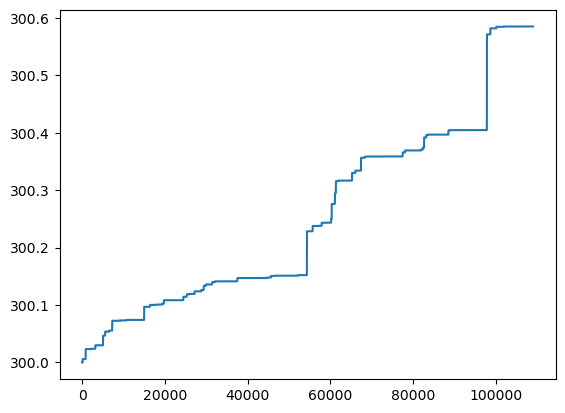

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.1468414883235
Прибыль от 300 usdt за 100_000 тиков: 0.13475281343064002


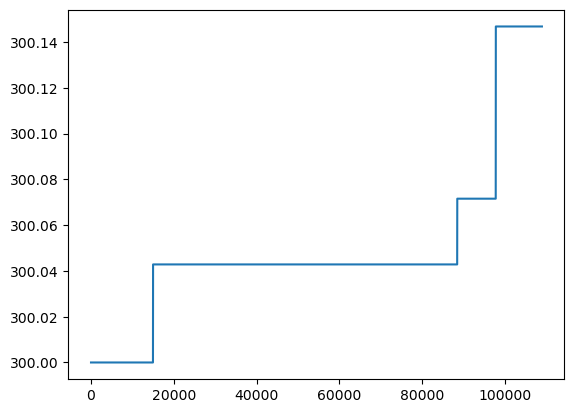

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0073127290509
Прибыль от 300 usdt за 100_000 тиков: 0.0067107111533428005


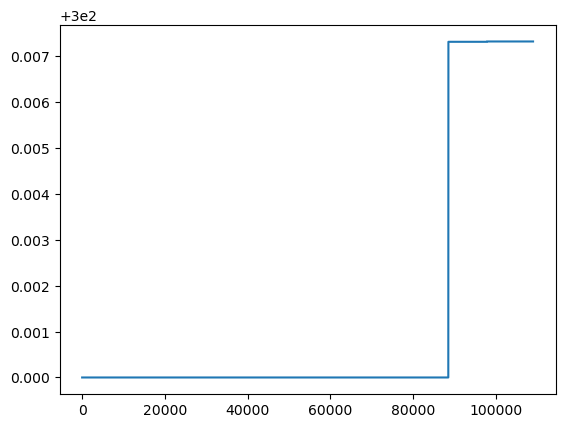

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


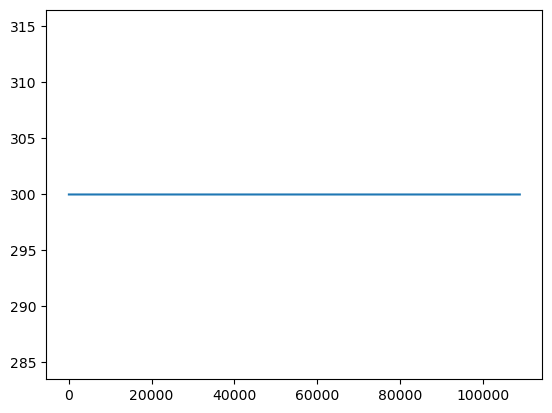

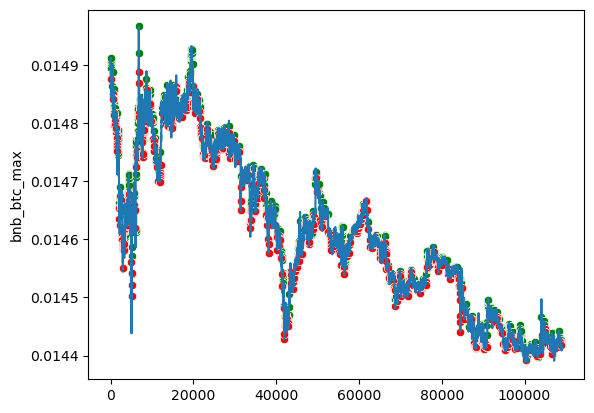

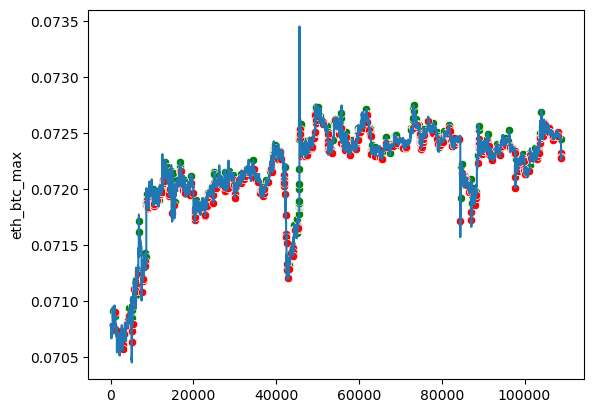

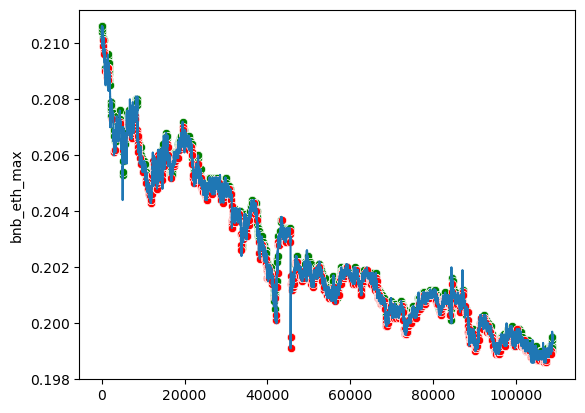

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 30, loss: 0.100
Traid counts: 6197 1: 1188 2: 978 3: 672 4: 373 5: 1282 6: 1704
              precision    recall  f1-score   support

         0.0       1.00      0.94      0.97    108801
         1.0       0.01      0.39      0.02        31
         2.0       0.01      0.28      0.02        32
         3.0       0.01      0.31      0.01        16
         4.0       0.01      0.12      0.01        16
         5.0       0.01      0.30      0.02        37
         6.0       0.00      0.18      0.01        38

    accuracy                           0.94    108971
   macro avg       0.15      0.36      0.15    108971
weighted avg       1.00      0.94      0.97    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.53021994377264
Прибыль от 300 usdt за 100_000 тиков: 0.48656976973014454


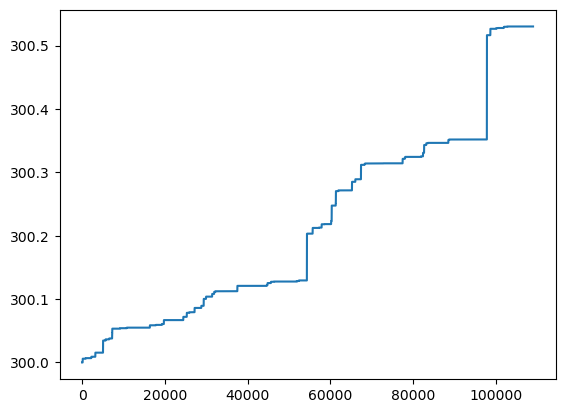

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.10880442315676
Прибыль от 300 usdt за 100_000 тиков: 0.09984713653793678


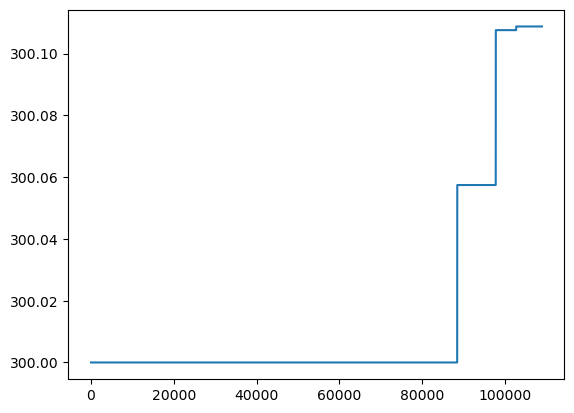

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0073127290509
Прибыль от 300 usdt за 100_000 тиков: 0.0067107111533428005


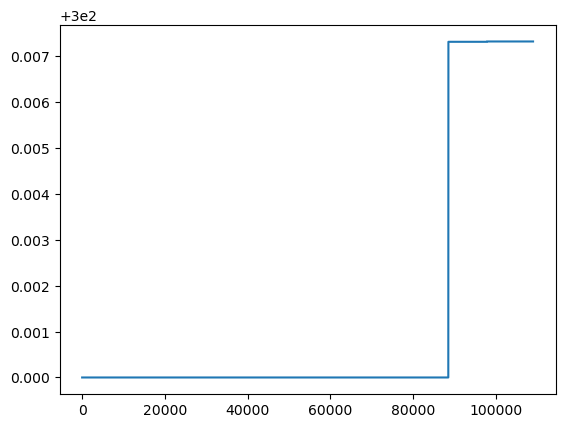

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


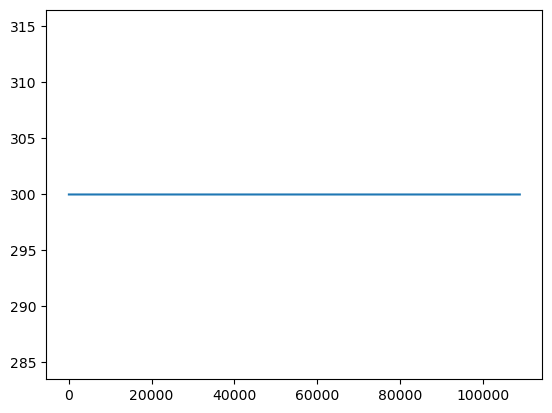

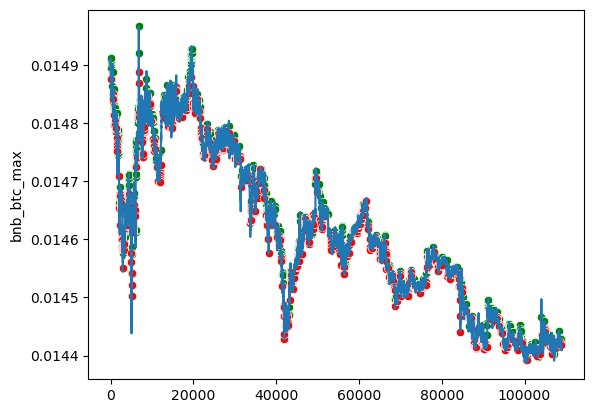

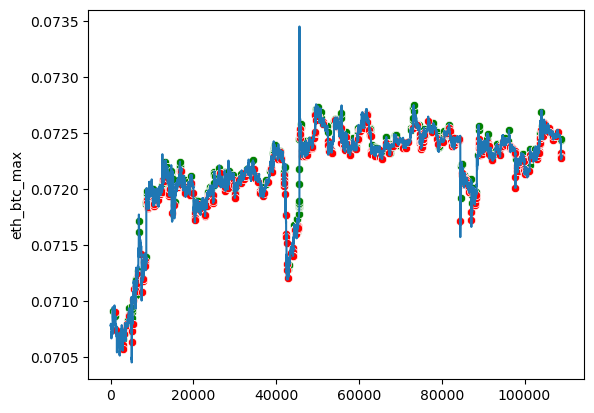

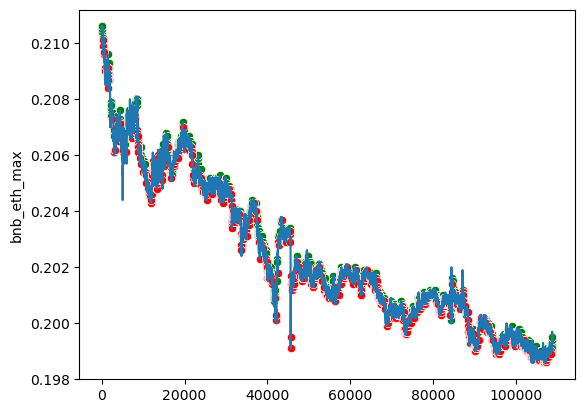

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 35, loss: 0.093
Traid counts: 5919 1: 1187 2: 991 3: 626 4: 408 5: 1192 6: 1515
              precision    recall  f1-score   support

         0.0       1.00      0.95      0.97    108801
         1.0       0.01      0.48      0.02        31
         2.0       0.01      0.25      0.02        32
         3.0       0.01      0.31      0.02        16
         4.0       0.01      0.19      0.01        16
         5.0       0.01      0.16      0.01        37
         6.0       0.00      0.13      0.01        38

    accuracy                           0.95    108971
   macro avg       0.15      0.35      0.15    108971
weighted avg       1.00      0.95      0.97    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.70004668339186
Прибыль от 300 usdt за 100_000 тиков: 0.6424155815692807


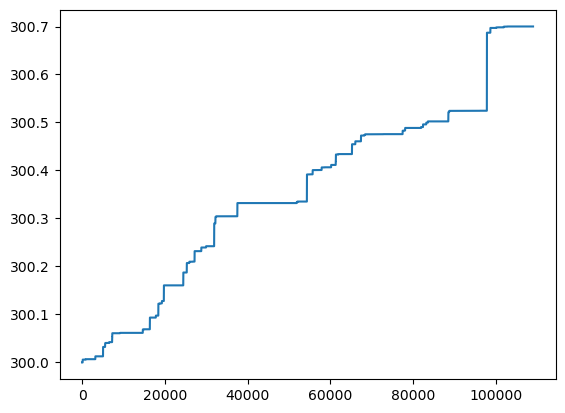

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.1480254953299
Прибыль от 300 usdt за 100_000 тиков: 0.13583934746847823


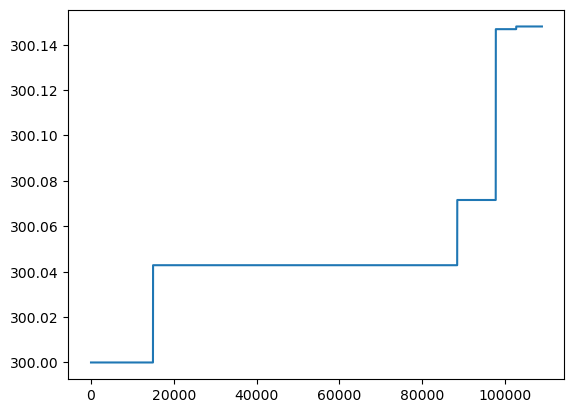

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0073127290509
Прибыль от 300 usdt за 100_000 тиков: 0.0067107111533428005


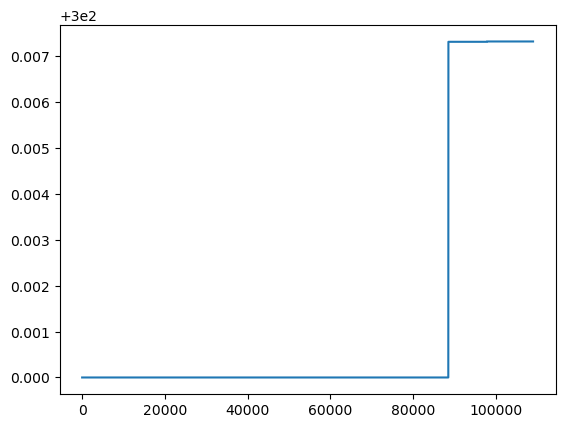

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


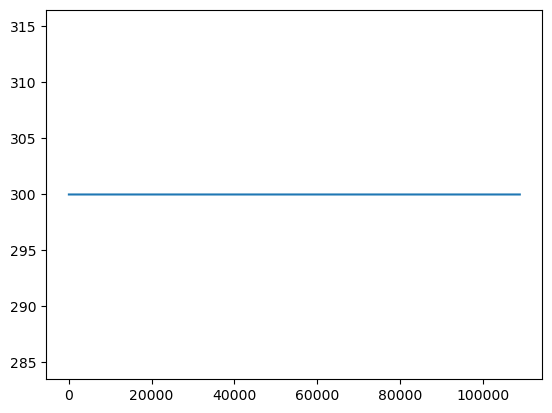

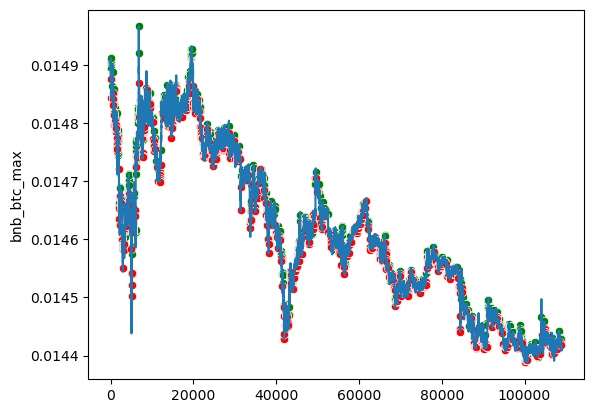

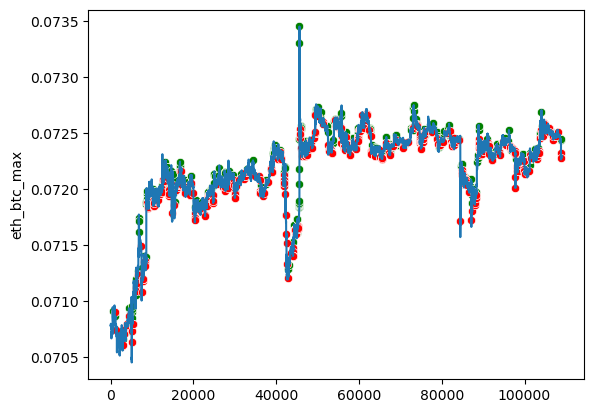

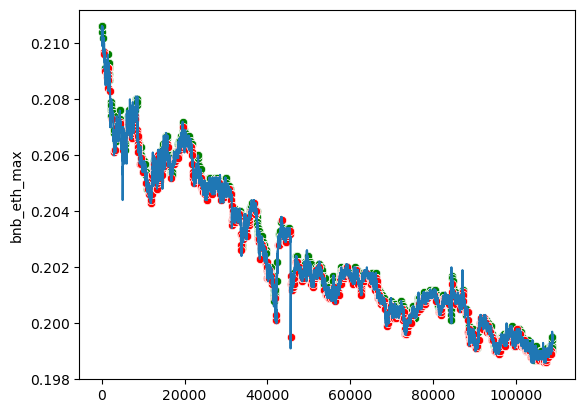

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 40, loss: 0.079
Traid counts: 5657 1: 971 2: 1000 3: 551 4: 434 5: 1245 6: 1456
              precision    recall  f1-score   support

         0.0       1.00      0.95      0.97    108801
         1.0       0.01      0.32      0.02        31
         2.0       0.01      0.31      0.02        32
         3.0       0.01      0.25      0.01        16
         4.0       0.00      0.12      0.01        16
         5.0       0.01      0.32      0.02        37
         6.0       0.00      0.18      0.01        38

    accuracy                           0.95    108971
   macro avg       0.15      0.35      0.15    108971
weighted avg       1.00      0.95      0.97    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.526153822012
Прибыль от 300 usdt за 100_000 тиков: 0.4828383900414056


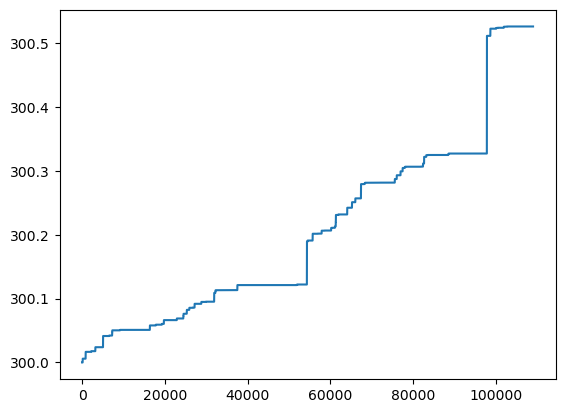

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.08090504396245
Прибыль от 300 usdt за 100_000 тиков: 0.07424456411563231


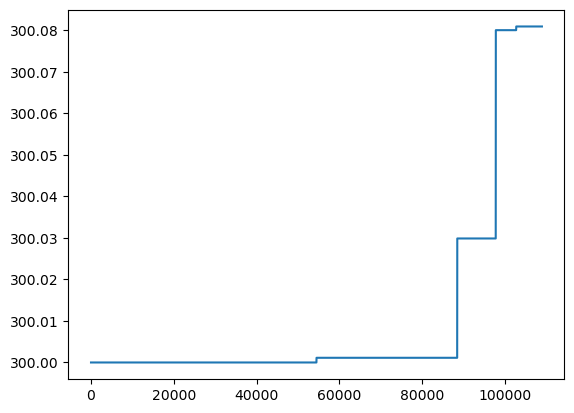

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0073127290509
Прибыль от 300 usdt за 100_000 тиков: 0.0067107111533428005


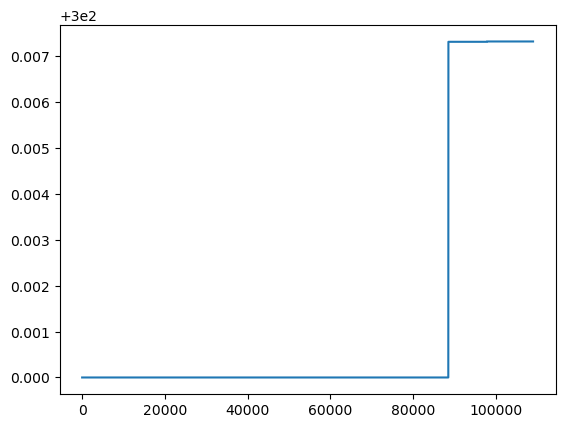

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


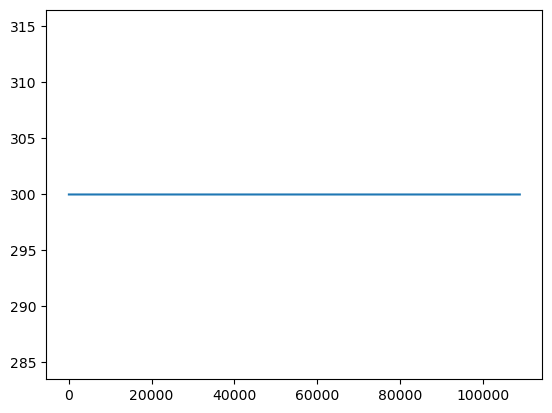

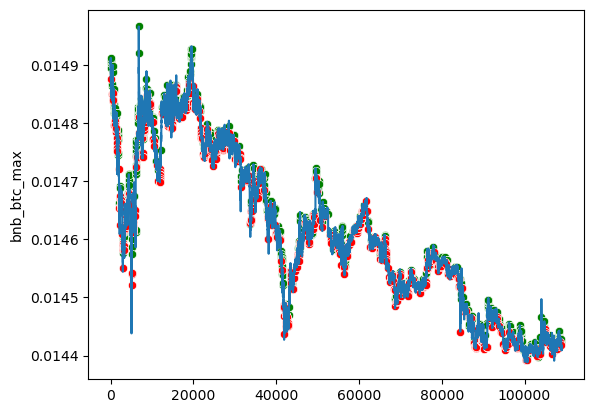

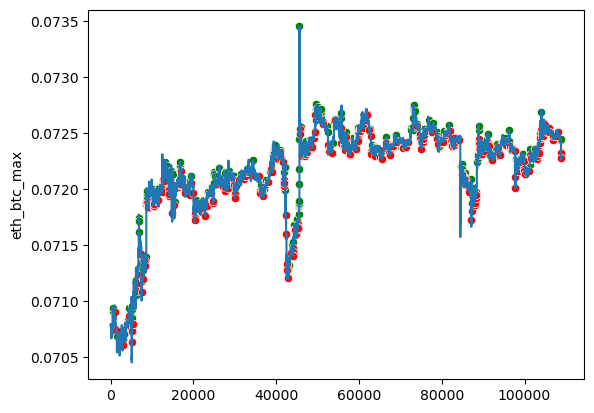

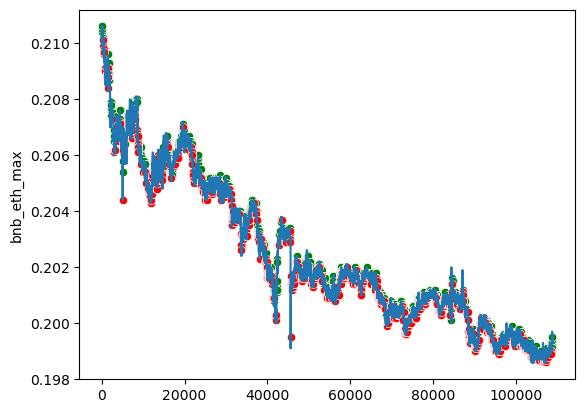

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 45, loss: 0.062
Traid counts: 5881 1: 1076 2: 1045 3: 642 4: 389 5: 1133 6: 1596
              precision    recall  f1-score   support

         0.0       1.00      0.95      0.97    108801
         1.0       0.01      0.39      0.02        31
         2.0       0.01      0.28      0.02        32
         3.0       0.01      0.25      0.01        16
         4.0       0.01      0.19      0.01        16
         5.0       0.01      0.22      0.01        37
         6.0       0.00      0.16      0.01        38

    accuracy                           0.95    108971
   macro avg       0.15      0.35      0.15    108971
weighted avg       1.00      0.95      0.97    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.7098336739632
Прибыль от 300 usdt за 100_000 тиков: 0.6513968615165532


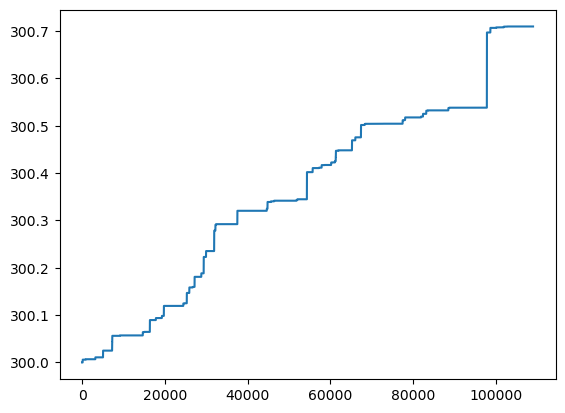

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.1480254953299
Прибыль от 300 usdt за 100_000 тиков: 0.13583934746847823


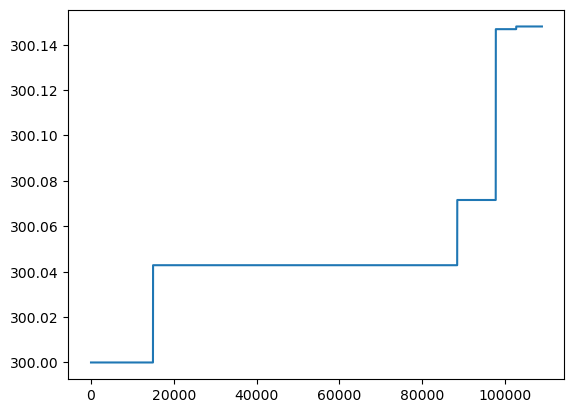

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0073127290509
Прибыль от 300 usdt за 100_000 тиков: 0.0067107111533428005


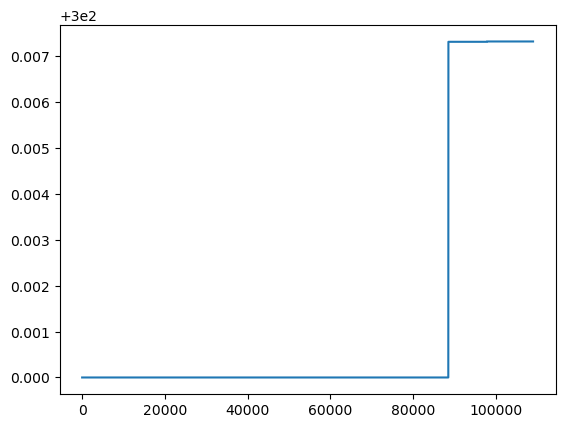

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


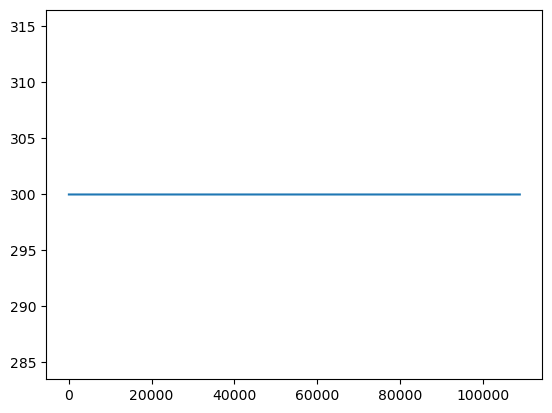

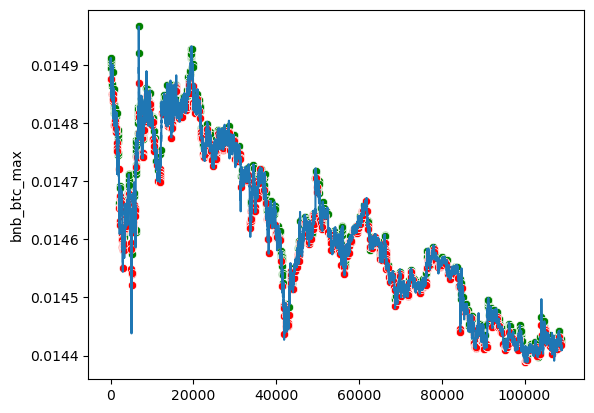

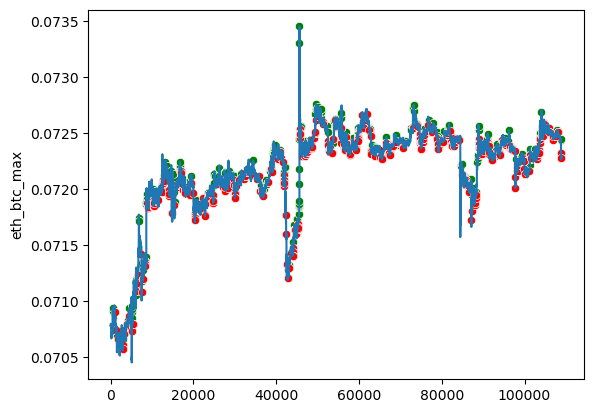

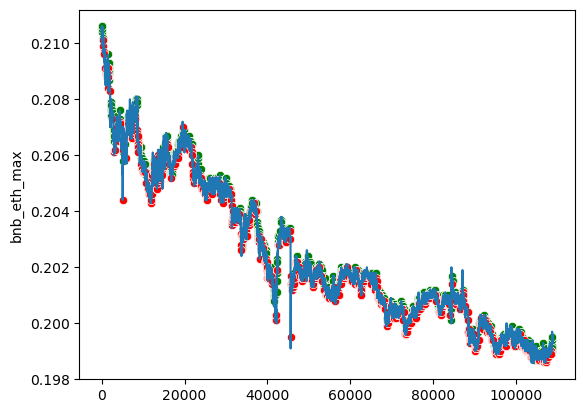

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 50, loss: 0.056
Traid counts: 5761 1: 998 2: 1085 3: 614 4: 351 5: 1197 6: 1516
              precision    recall  f1-score   support

         0.0       1.00      0.95      0.97    108801
         1.0       0.01      0.29      0.02        31
         2.0       0.01      0.19      0.01        32
         3.0       0.01      0.25      0.01        16
         4.0       0.01      0.19      0.02        16
         5.0       0.01      0.22      0.01        37
         6.0       0.01      0.21      0.01        38

    accuracy                           0.95    108971
   macro avg       0.15      0.33      0.15    108971
weighted avg       1.00      0.95      0.97    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.64589349815896
Прибыль от 300 usdt за 100_000 тиков: 0.5927205386377614


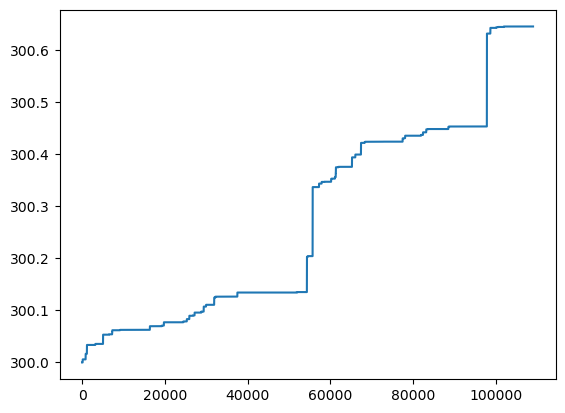

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.208590226026
Прибыль от 300 usdt за 100_000 тиков: 0.19141810759375427


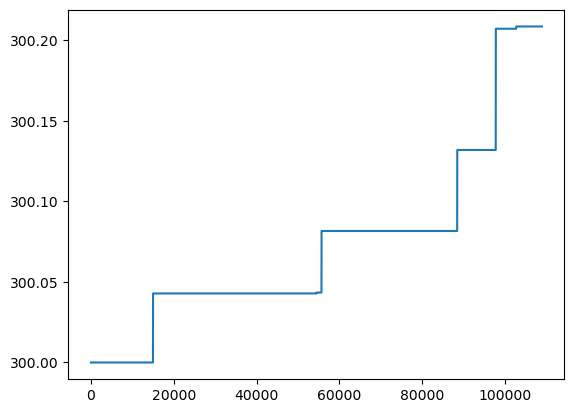

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0073127290509
Прибыль от 300 usdt за 100_000 тиков: 0.0067107111533428005


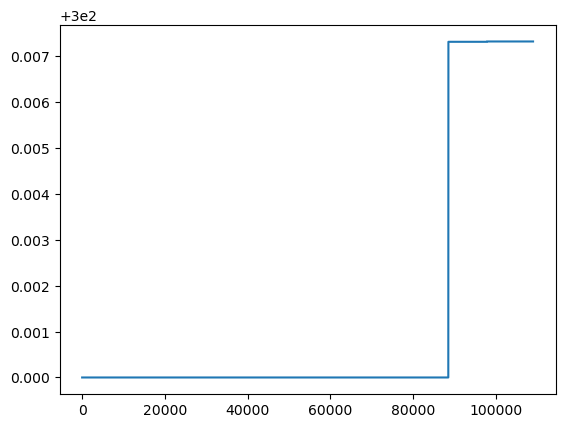

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


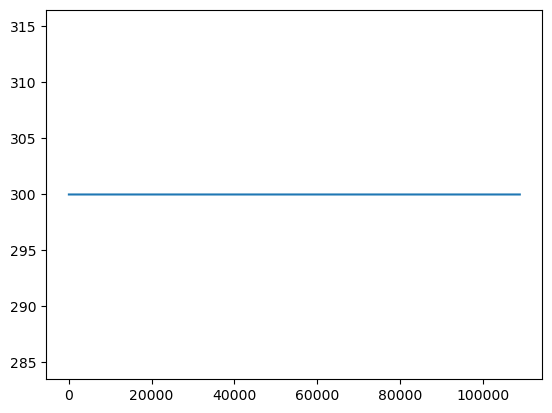

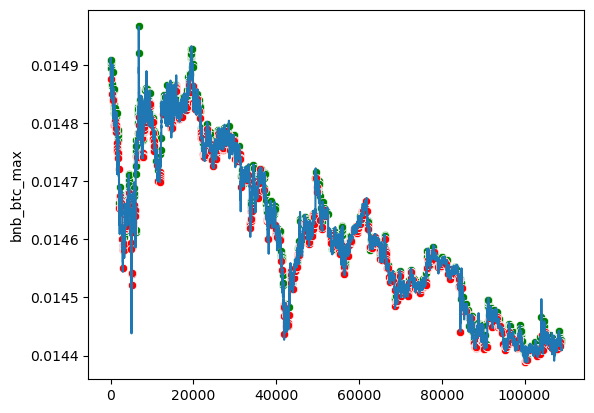

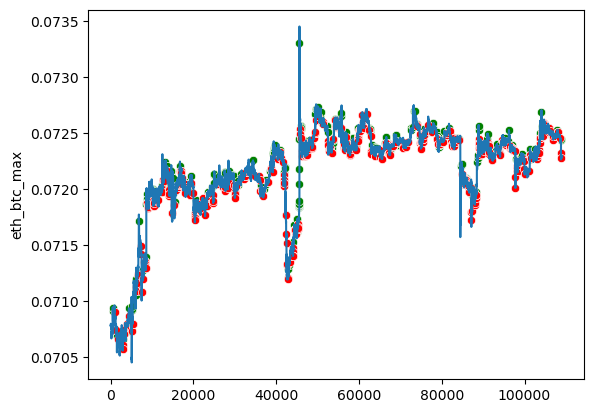

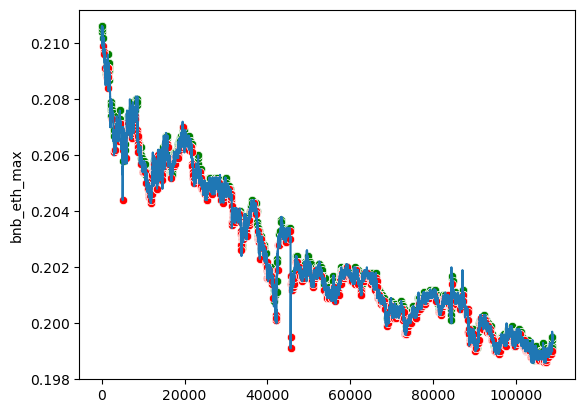

CPU times: total: 2h 45min 6s
Wall time: 2h 43min 21s


In [19]:
%%time

line_net = LineNet().to('cuda')

loss_fn = nn.CrossEntropyLoss()
optimizer = optim.Adam(line_net.parameters(), lr=0.0001)

epoch_list = list()
loss_list = list()
traid_counts_list = list()
profit_300_1_list = list()
profit_300_2_list = list()
profit_300_3_list = list()
profit_300_4_list = list()

ticker_price_valid_values = ticker_price_valid.values
ticker_price_valid_fig = ticker_price_valid

for epoch in range(EPOCH):
    loss_array = np.array([], dtype=float)
    for i, batch in enumerate(train_loader):
        optimizer.zero_grad()
        
        X_small_batch, X_medium_batch, X_big_batch, X_last_min_max_batch,  depth_scaled_batch, y_batch = batch
        X_small_batch = X_small_batch.to('cuda')
        X_medium_batch = X_medium_batch.to('cuda')
        X_big_batch = X_big_batch.to('cuda')
        X_last_min_max_batch = X_last_min_max_batch.to('cuda')
        depth_scaled_batch = depth_scaled_batch.to('cuda')
        y_batch = y_batch.to('cuda')
        
        output = line_net.forward(X_small_batch, X_medium_batch, X_big_batch, X_last_min_max_batch,  depth_scaled_batch)
        loss =loss_fn(output, y_batch)
        loss.backward()
        optimizer.step()
        loss_array = np.append(loss_array, loss.to('cpu').detach().numpy())
    if epoch % 5 == 0:
        print('---***---***---***---***---***---***---***---***---***---***---***---***---')
        print('Predict start')
        predict = torch.empty((1), dtype=torch.float).to('cuda')
        y_valid_tensor = torch.empty((1), dtype=torch.float)
        
        for i_valid, batch_valid in enumerate(valid_loader):
            
            X_small_batch_valid, X_medium_batch_valid, X_big_batch_valid, X_last_min_max_batch_valid,  depth_scaled_batch_valid, y_batch_valid = batch_valid
            X_small_batch_valid = X_small_batch_valid.to('cuda')
            X_medium_batch_valid = X_medium_batch_valid.to('cuda')
            X_big_batch_valid = X_big_batch_valid.to('cuda')
            X_last_min_max_batch_valid = X_last_min_max_batch_valid.to('cuda')
            depth_scaled_batch_valid = depth_scaled_batch_valid.to('cuda')
            
            predict_batch = torch.argmax(line_net.inference(X_small_batch_valid, X_medium_batch_valid, X_big_batch_valid, X_last_min_max_batch_valid,  depth_scaled_batch_valid), dim=1)
            predict = torch.cat((predict, predict_batch), 0)
            y_valid_tensor = torch.cat((y_valid_tensor, y_batch_valid), 0)
        
        
        predict = predict[1:]
        y_valid_tensor = y_valid_tensor[1:]
        epoch_list.append(epoch)
        loss_mean = loss_array.mean()
        loss_list.append(loss_mean)
        print(f'Epoch: {epoch}, loss: {loss_mean:.3f}')
        traid_counts = (predict!=0).sum()
        traid_counts_list.append(traid_counts)
        print(f'Traid counts: {traid_counts}',
              f'1: {(predict==1).sum()}',
              f'2: {(predict==2).sum()}',
              f'3: {(predict==3).sum()}',
              f'4: {(predict==4).sum()}',
              f'5: {(predict==5).sum()}',
              f'6: {(predict==6).sum()}'
             )
        predict = predict.to('cpu').detach().numpy()
        print(classification_report(y_valid_tensor.detach().numpy(), predict))
        
        for slip_n in range(1,5):
            print("-------------")
            print(f'SLIP_N = {slip_n}')
            trade_result, volume_not_trade = trade(ticker_price_valid_values, predict, FEE, slip_n)
            trade_result = np.array(trade_result)
            print(f'Без торгов за счёт изменения курса с 300 usdt: {volume_not_trade}')
            print(f'Результат торгов с 300 usdt: {trade_result[-1]}')
            
            profit_300 = (trade_result[-1]-300)*100_000/predict.shape[0]
            if slip_n == 1:
                profit_300_1_list.append(profit_300)
            elif slip_n == 2:
                profit_300_2_list.append(profit_300)
            elif slip_n == 3:
                profit_300_3_list.append(profit_300)
            elif slip_n == 4:
                profit_300_4_list.append(profit_300)
            print(f'Прибыль от 300 usdt за 100_000 тиков: {profit_300}')
            sns.lineplot(x=range(trade_result.shape[0]),y=trade_result)
            plt.show()
            
        # отрисовка сделок на тренде
        x_len = predict.shape[0]

        ticker_price_valid_fig[PAIRS_NAME[0]+'_min'] = ticker_price_valid_values[:,0]*(predict == 1)
        ticker_price_valid_fig[PAIRS_NAME[0]+'_max'] = ticker_price_valid_values[:,0]*(predict == 2)
        ticker_price_valid_fig[PAIRS_NAME[1]+'_min'] = ticker_price_valid_values[:,1]*(predict == 3)
        ticker_price_valid_fig[PAIRS_NAME[1]+'_max'] = ticker_price_valid_values[:,1]*(predict == 4)
        ticker_price_valid_fig[PAIRS_NAME[2]+'_min'] = ticker_price_valid_values[:,2]*(predict == 5)
        ticker_price_valid_fig[PAIRS_NAME[2]+'_max'] = ticker_price_valid_values[:,2]*(predict == 6)
        ticker_price_valid_fig = ticker_price_valid_fig.replace(0, np.nan)

        for i, pair in enumerate(['bnb_btc','eth_btc','bnb_eth']):

            fig, ax = plt.subplots()
            ax.plot(range(x_len),ticker_price_valid_values[:x_len,i])
            #ax.plot(range(x_len),trade_result['bnb_btc_max'][:x_len])
            sns.scatterplot(data=ticker_price_valid_fig[:x_len], x=range(x_len), y=pair+'_max', ax=ax, color='green')
            sns.scatterplot(data=ticker_price_valid_fig[:x_len], x=range(x_len), y=pair+'_min', ax=ax, color='red')
            #plt.ylim([ticker_price_valid_fig[pair+'_min'][:x_len].min(), ticker_price_valid_fig[pair+'_max'][:x_len].max()])
            plt.show()

trade_df = pd.DataFrame(data=[epoch_list, 
                              loss_list, 
                              traid_counts_list, 
                              profit_300_1_list, 
                              profit_300_2_list, 
                              profit_300_3_list, 
                              profit_300_4_list]).T.rename(columns={0:'epoch',
                                                                     1:'loss',
                                                                     2:'traid_counts',
                                                                     3:'profit_300_1',
                                                                     4:'profit_300_2',
                                                                     5:'profit_300_3',
                                                                     6:'profit_300_4'})

In [18]:
trade_df

,epoch,loss,traid_counts,profit_300_1,profit_300_2,profit_300_3,profit_300_4
0,NaN,NaN,NaN,2.130463,0.221761,0.029734,0.000000
1,NaN,NaN,NaN,2.118924,0.325834,0.084034,0.034569
2,NaN,NaN,NaN,1.702662,0.226140,0.084034,0.034569
3,NaN,NaN,NaN,1.343937,0.222247,0.084034,0.034569
4,NaN,NaN,NaN,1.454810,0.192213,0.084024,0.034569
5,NaN,NaN,NaN,1.204345,0.192213,0.084024,0.034569
6,NaN,NaN,NaN,0.846719,0.153141,0.084024,0.034569
7,NaN,NaN,NaN,0.805388,0.140475,0.084024,0.034569
8,NaN,NaN,NaN,0.660076,0.126775,0.080672,0.034569
9,NaN,NaN,NaN,0.586581,0.127292,0.080672,0.034569


## Модель MinMaxNet
Только min_max_last признаки.

In [46]:
class MinMaxNet(nn.Module):
    def __init__(self):
        super(MinMaxNet,self).__init__()
        
        self.linear_min_max = nn.Linear(in_features=36, out_features=512, bias=True)
        self.bn_min_max = nn.BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.linear_depth = nn.Linear(in_features=120, out_features=512, bias=True)
        self.bn_depth = nn.BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.linear2 = nn.Linear(in_features=1024, out_features=2048, bias=True)
        self.bn2 = nn.BatchNorm1d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.linear3 = nn.Linear(in_features=2048, out_features=1024, bias=True)
        self.bn3 = nn.BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.linear4 = nn.Linear(in_features=1024, out_features=7, bias=True)
        self.sm = nn.Softmax(dim=1)

    def forward(self, x_min_max, depth_scaled):
        
        x_min_max = self.linear_min_max(x_min_max)
        x_min_max = self.bn_min_max(x_min_max)
        x_min_max = F.relu(x_min_max)
        depth_scaled = self.linear_depth(depth_scaled)
        depth_scaled = self.bn_depth(depth_scaled)
        depth_scaled = F.relu(depth_scaled)
        
        x = torch.cat((x_min_max, depth_scaled), 1)
        x = self.linear2(x)
        x = self.bn2(x)
        x = F.relu(x)        
        x = self.linear3(x)
        x = self.bn3(x)
        x = F.relu(x)        
        x = self.linear4(x)
        return x
    
    def inference(self, x_min_max, depth_scaled):
        x = self.forward(x_min_max, depth_scaled)
        x = self.sm(x)
        return x 

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 0, loss: 0.835
Traid counts: 30152 1: 2228 2: 3213 3: 1424 4: 3048 5: 9967 6: 10272
              precision    recall  f1-score   support

         0.0       1.00      0.72      0.84    108801
         1.0       0.01      0.45      0.01        31
         2.0       0.01      0.59      0.01        32
         3.0       0.00      0.44      0.01        16
         4.0       0.00      0.69      0.01        16
         5.0       0.00      0.68      0.00        37
         6.0       0.00      0.71      0.01        38

    accuracy                           0.72    108971
   macro avg       0.15      0.61      0.13    108971
weighted avg       1.00      0.72      0.84    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 302.54850277610825
Прибыль от 300 usdt за 100_000 тиков: 2.338698163830974


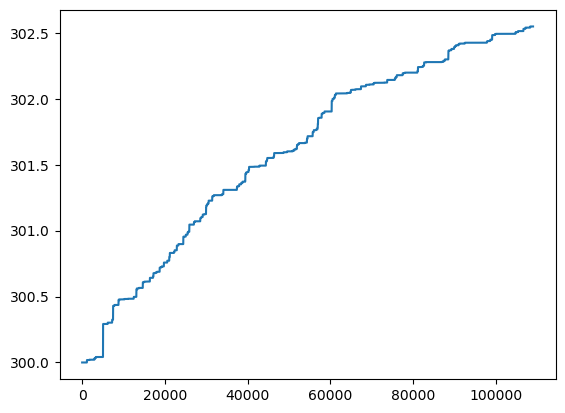

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.233940752044
Прибыль от 300 usdt за 100_000 тиков: 0.21468166029863028


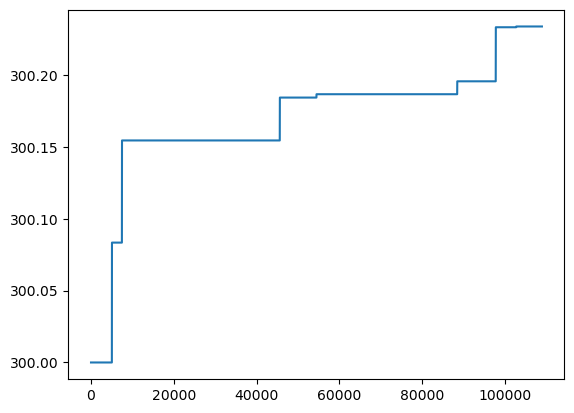

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0369384300547
Прибыль от 300 usdt за 100_000 тиков: 0.03389748653743105


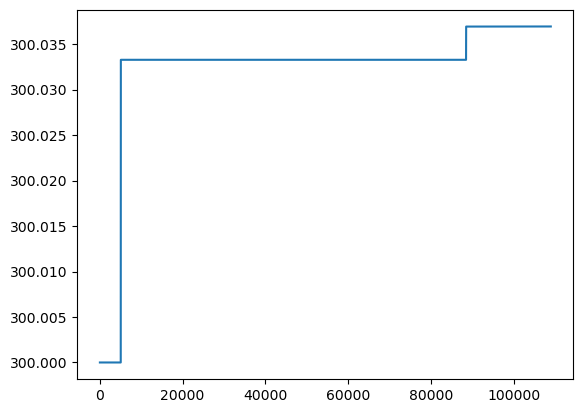

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300
Прибыль от 300 usdt за 100_000 тиков: 0.0


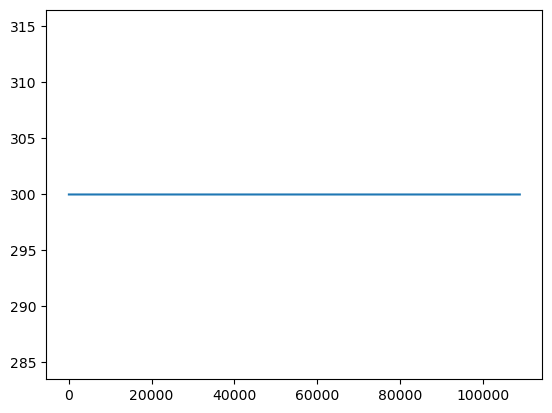

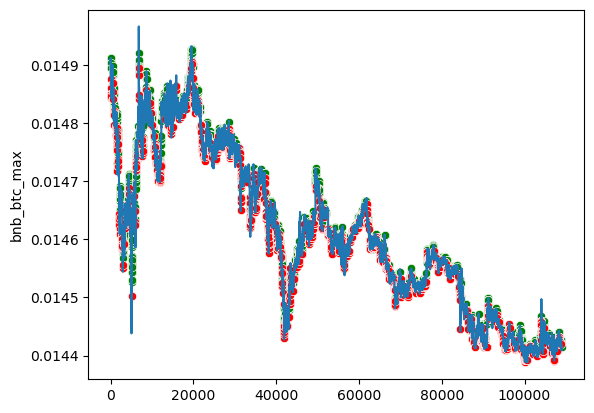

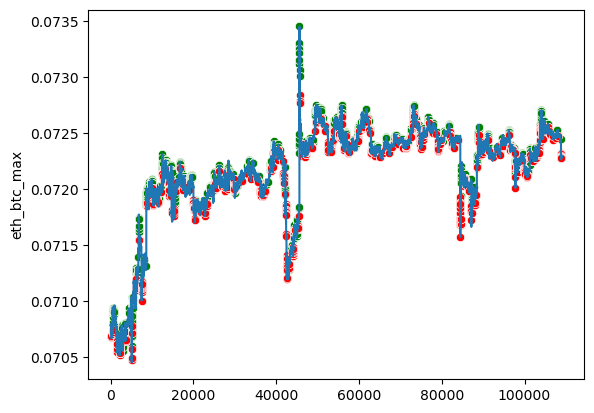

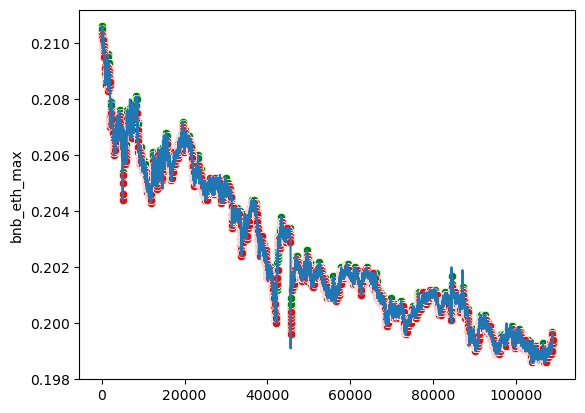

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 5, loss: 0.336
Traid counts: 32057 1: 3689 2: 4430 3: 1807 4: 2819 5: 9380 6: 9932
              precision    recall  f1-score   support

         0.0       1.00      0.71      0.83    108801
         1.0       0.00      0.52      0.01        31
         2.0       0.01      0.75      0.01        32
         3.0       0.00      0.50      0.01        16
         4.0       0.00      0.75      0.01        16
         5.0       0.00      0.59      0.00        37
         6.0       0.00      0.63      0.00        38

    accuracy                           0.71    108971
   macro avg       0.15      0.64      0.12    108971
weighted avg       1.00      0.71      0.83    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 302.6361222500617
Прибыль от 300 usdt за 100_000 тиков: 2.41910439480385


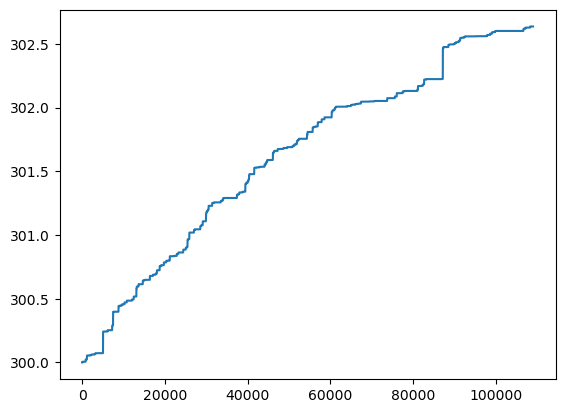

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.3847857804869
Прибыль от 300 usdt за 100_000 тиков: 0.35310842378878743


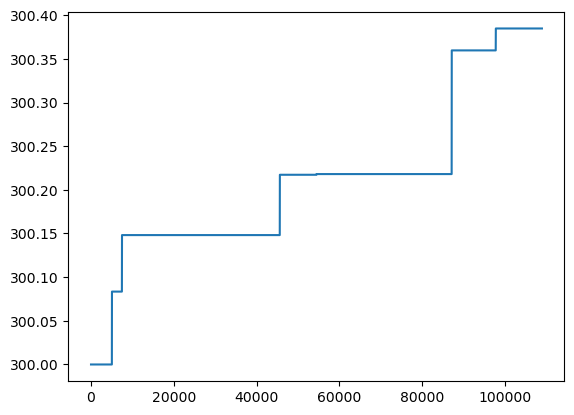

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.23696706666607
Прибыль от 300 usdt за 100_000 тиков: 0.2174588346129412


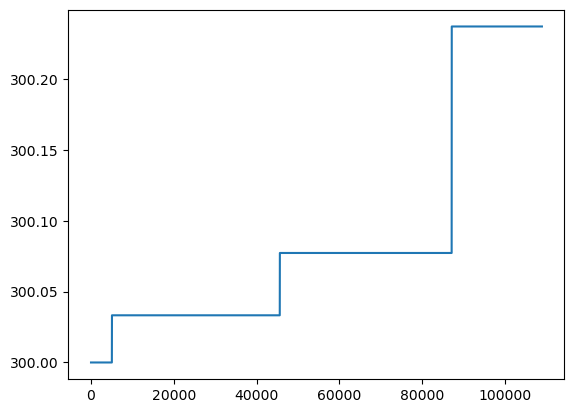

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0991751217292
Прибыль от 300 usdt за 100_000 тиков: 0.0910105640300792


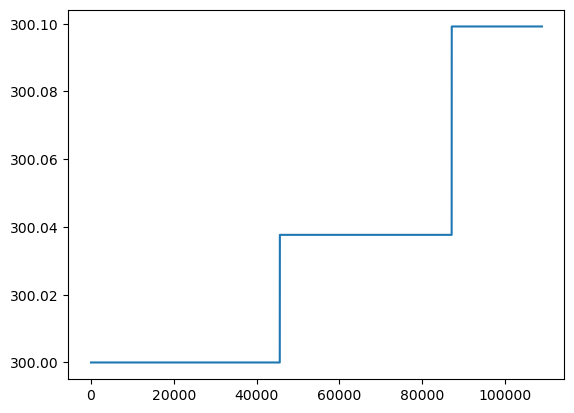

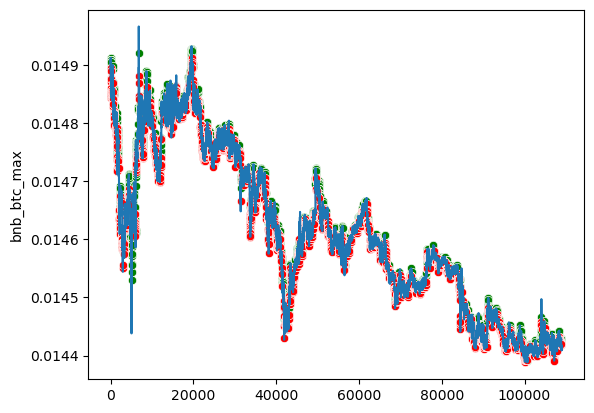

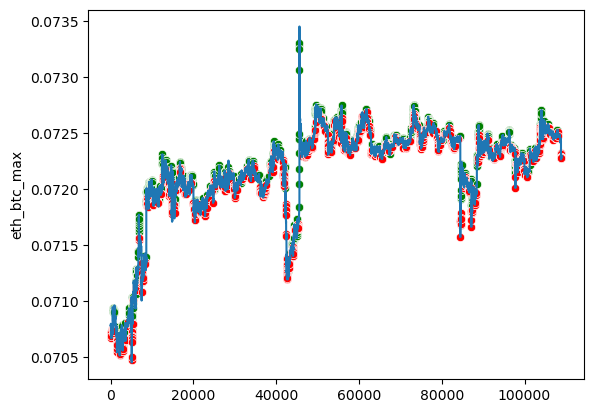

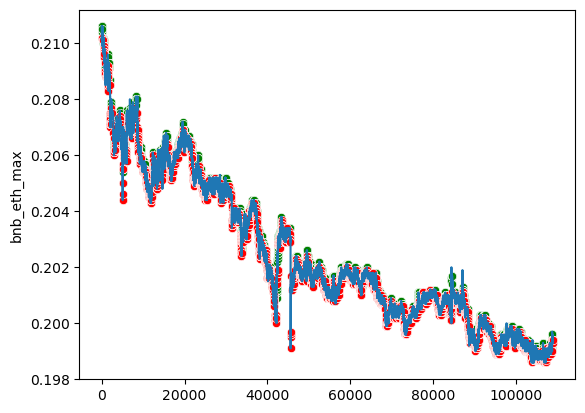

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 10, loss: 0.284
Traid counts: 25527 1: 3656 2: 3689 3: 1534 4: 2158 5: 6340 6: 8150
              precision    recall  f1-score   support

         0.0       1.00      0.77      0.87    108801
         1.0       0.00      0.55      0.01        31
         2.0       0.01      0.62      0.01        32
         3.0       0.00      0.38      0.01        16
         4.0       0.00      0.62      0.01        16
         5.0       0.00      0.46      0.01        37
         6.0       0.00      0.47      0.00        38

    accuracy                           0.77    108971
   macro avg       0.15      0.55      0.13    108971
weighted avg       1.00      0.77      0.87    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.7859424929577
Прибыль от 300 usdt за 100_000 тиков: 1.6389153930474178


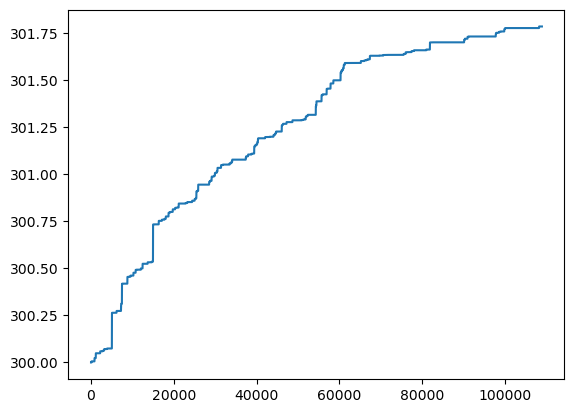

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.2606177138036
Прибыль от 300 usdt за 100_000 тиков: 0.23916245037999398


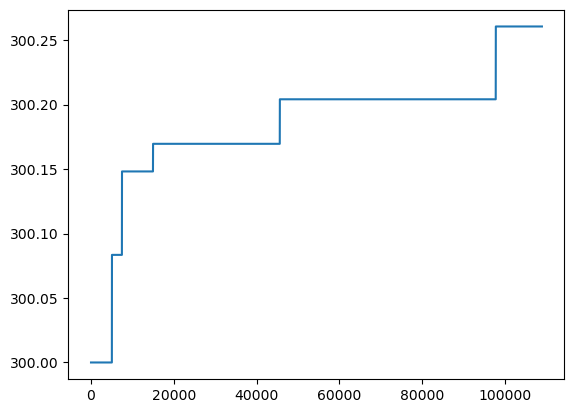

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0772419088364
Прибыль от 300 usdt за 100_000 тиков: 0.07088299532574091


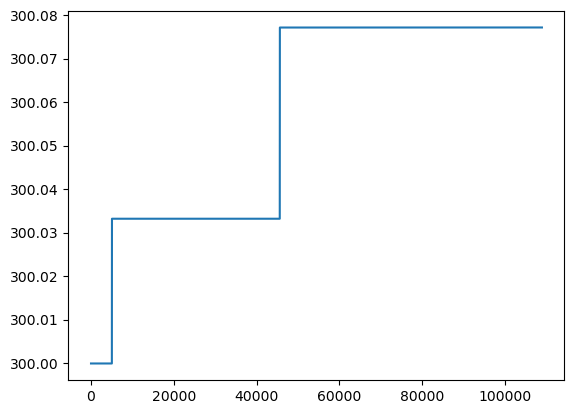

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0376704135977
Прибыль от 300 usdt за 100_000 тиков: 0.03456920978765845


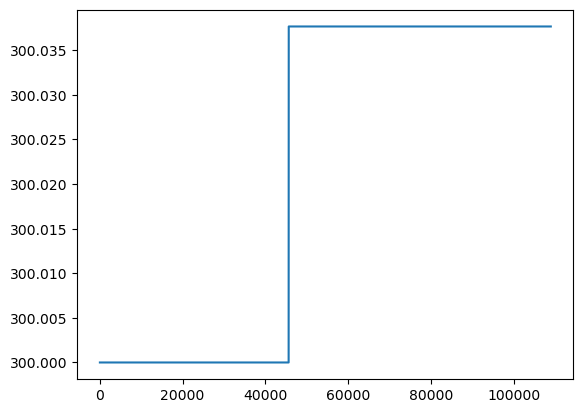

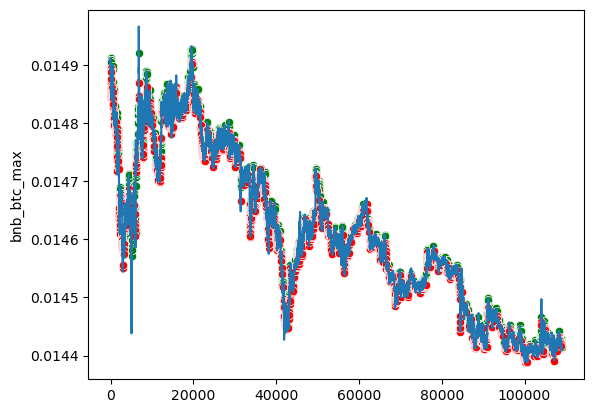

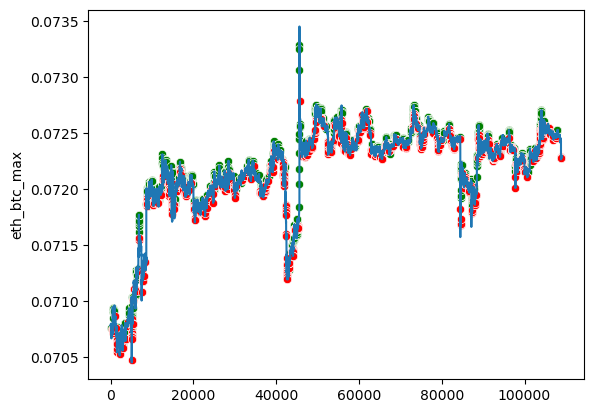

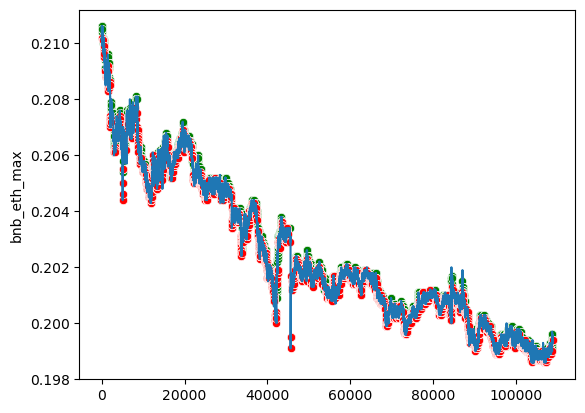

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 15, loss: 0.244
Traid counts: 20400 1: 3069 2: 3519 3: 1267 4: 1582 5: 4645 6: 6318
              precision    recall  f1-score   support

         0.0       1.00      0.81      0.90    108801
         1.0       0.01      0.58      0.01        31
         2.0       0.01      0.62      0.01        32
         3.0       0.00      0.31      0.01        16
         4.0       0.01      0.69      0.01        16
         5.0       0.00      0.46      0.01        37
         6.0       0.00      0.45      0.01        38

    accuracy                           0.81    108971
   macro avg       0.15      0.56      0.14    108971
weighted avg       1.00      0.81      0.90    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 302.19747465584385
Прибыль от 300 usdt за 100_000 тиков: 2.016568312527047


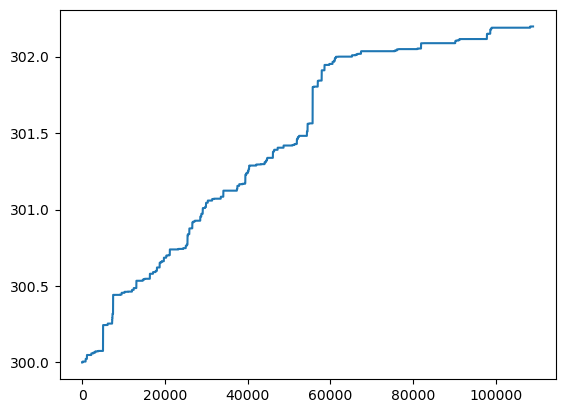

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.3229134089655
Прибыль от 300 usdt за 100_000 тиков: 0.2963296739183076


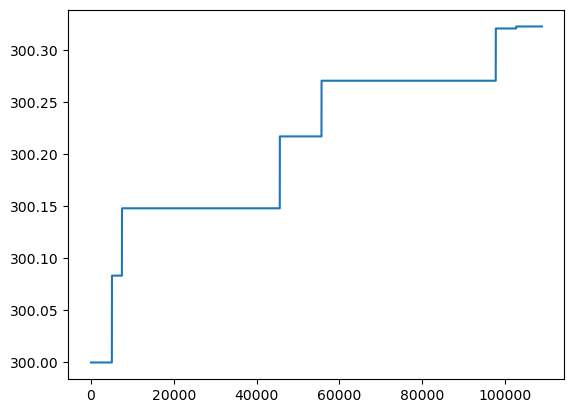

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0772419088364
Прибыль от 300 usdt за 100_000 тиков: 0.07088299532574091


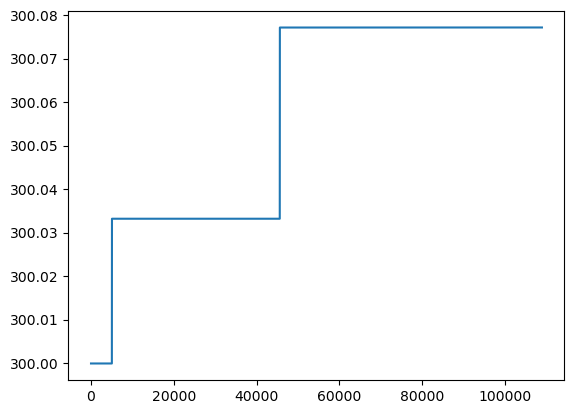

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0376704135977
Прибыль от 300 usdt за 100_000 тиков: 0.03456920978765845


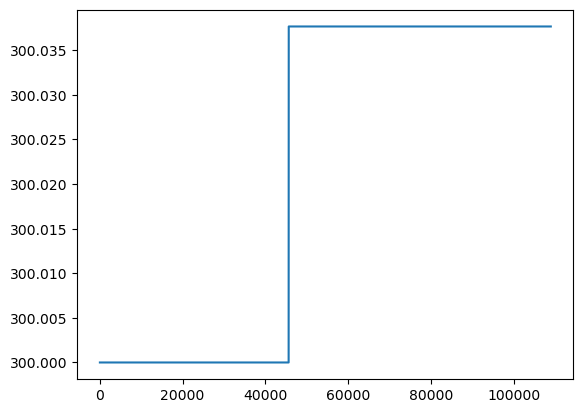

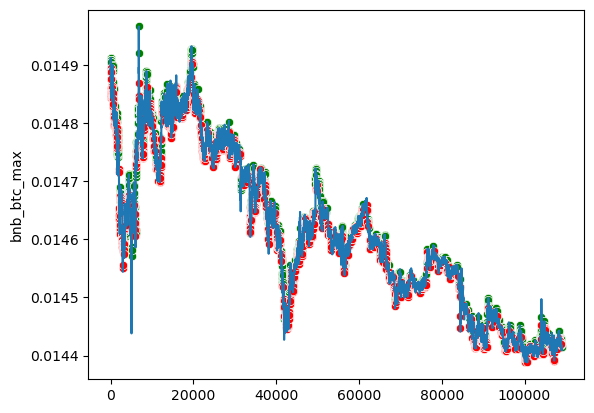

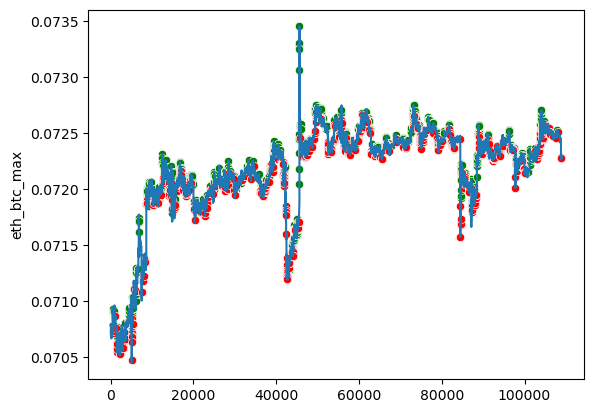

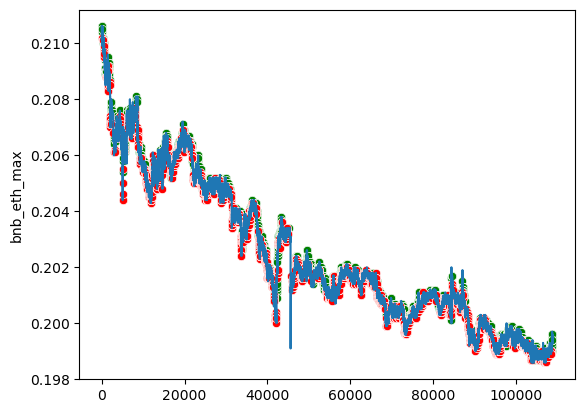

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 20, loss: 0.215
Traid counts: 18459 1: 3302 2: 2975 3: 1070 4: 1383 5: 4210 6: 5519
              precision    recall  f1-score   support

         0.0       1.00      0.83      0.91    108801
         1.0       0.01      0.58      0.01        31
         2.0       0.01      0.47      0.01        32
         3.0       0.00      0.25      0.01        16
         4.0       0.01      0.56      0.01        16
         5.0       0.00      0.43      0.01        37
         6.0       0.00      0.37      0.01        38

    accuracy                           0.83    108971
   macro avg       0.15      0.50      0.14    108971
weighted avg       1.00      0.83      0.91    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.86969411875845
Прибыль от 300 usdt за 100_000 тиков: 1.7157721951330591


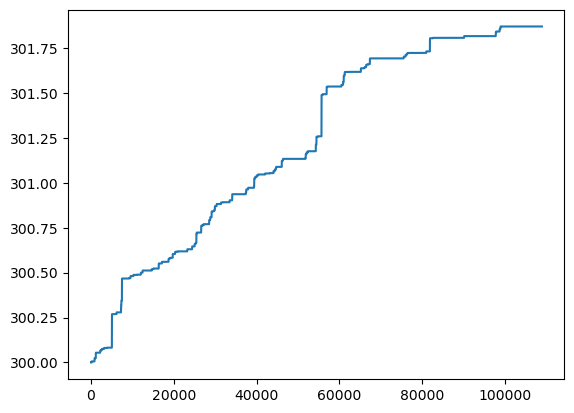

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.3229134089655
Прибыль от 300 usdt за 100_000 тиков: 0.2963296739183076


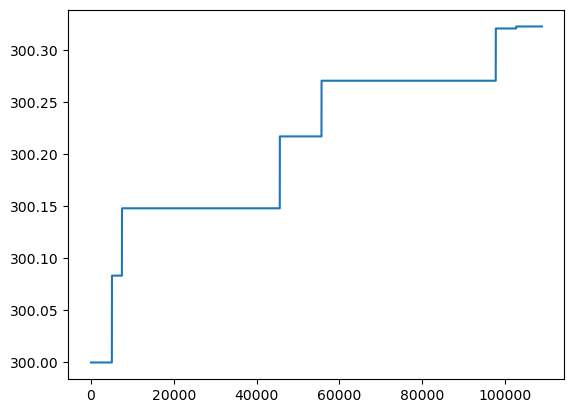

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0772419088364
Прибыль от 300 usdt за 100_000 тиков: 0.07088299532574091


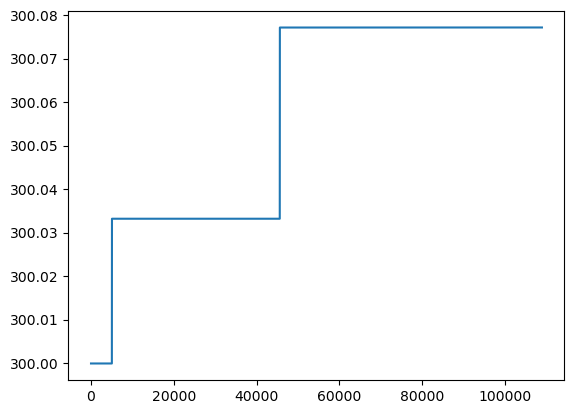

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0376704135977
Прибыль от 300 usdt за 100_000 тиков: 0.03456920978765845


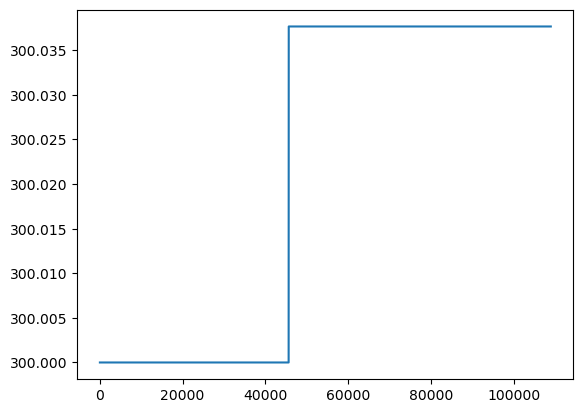

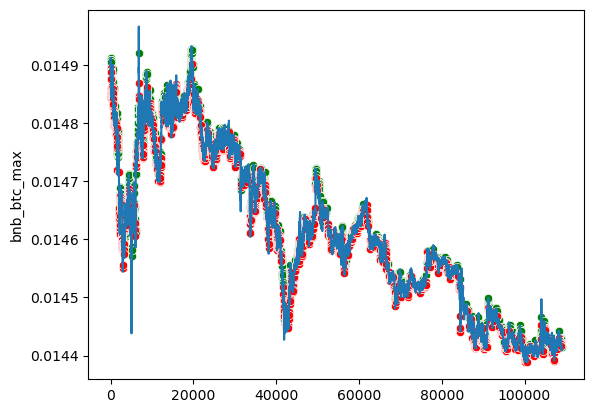

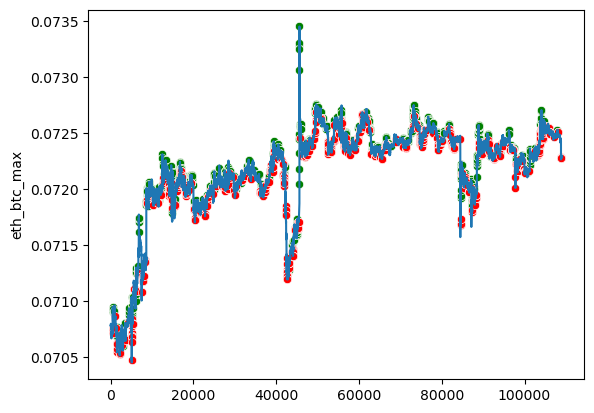

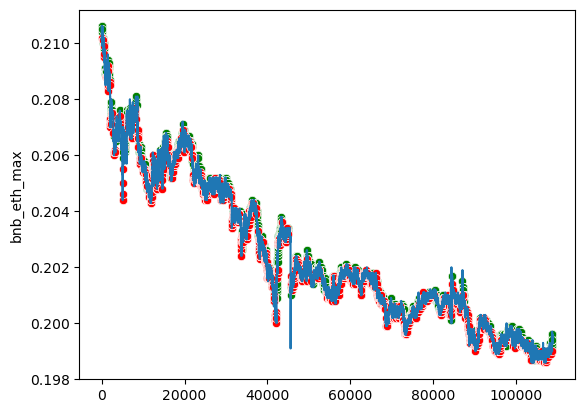

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 25, loss: 0.183
Traid counts: 16931 1: 3190 2: 2790 3: 878 4: 1076 5: 3651 6: 5346
              precision    recall  f1-score   support

         0.0       1.00      0.85      0.92    108801
         1.0       0.01      0.55      0.01        31
         2.0       0.01      0.50      0.01        32
         3.0       0.00      0.25      0.01        16
         4.0       0.01      0.38      0.01        16
         5.0       0.00      0.32      0.01        37
         6.0       0.00      0.37      0.01        38

    accuracy                           0.84    108971
   macro avg       0.15      0.46      0.14    108971
weighted avg       1.00      0.84      0.91    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.6637334186244
Прибыль от 300 usdt за 100_000 тиков: 1.5267671386189146


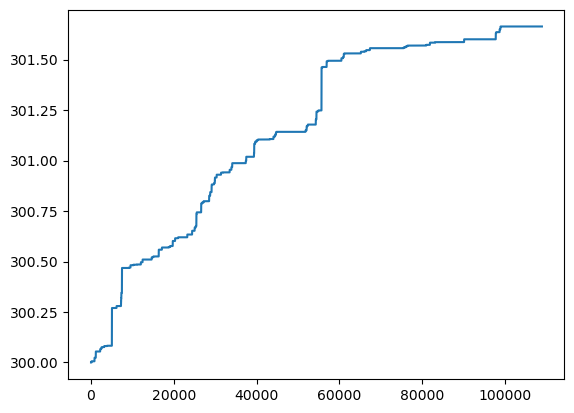

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.32098874403204
Прибыль от 300 usdt за 100_000 тиков: 0.2945634563618172


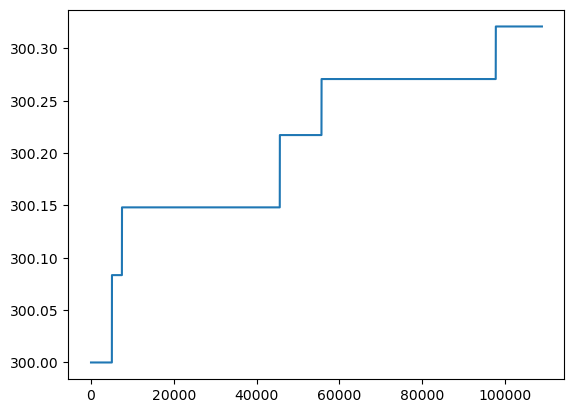

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0772419088364
Прибыль от 300 usdt за 100_000 тиков: 0.07088299532574091


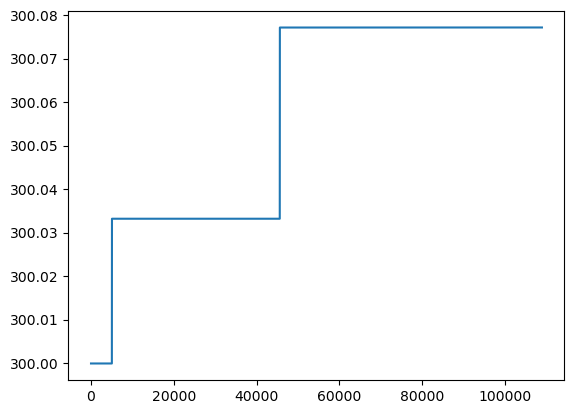

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0376704135977
Прибыль от 300 usdt за 100_000 тиков: 0.03456920978765845


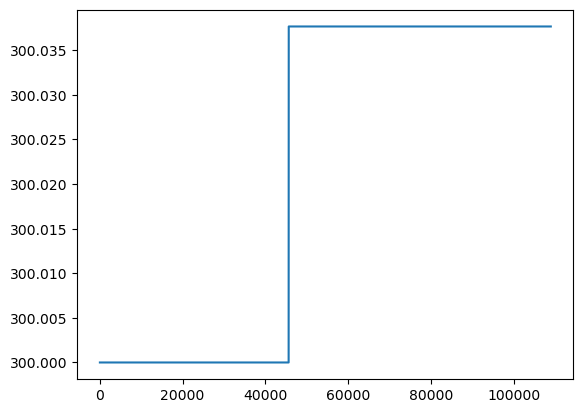

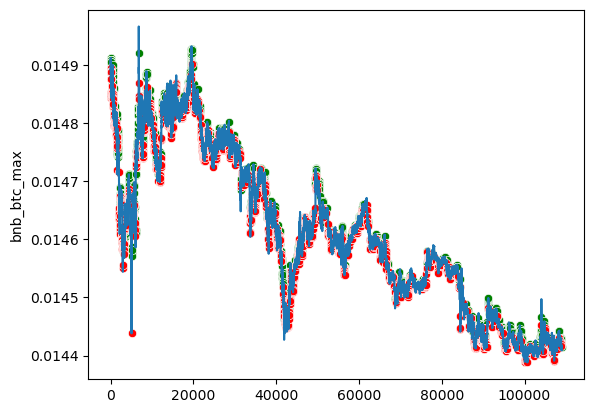

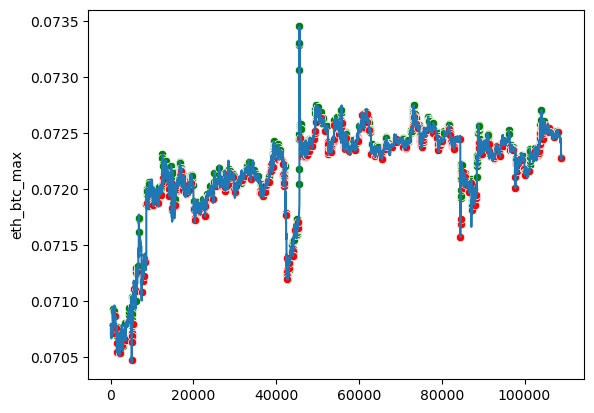

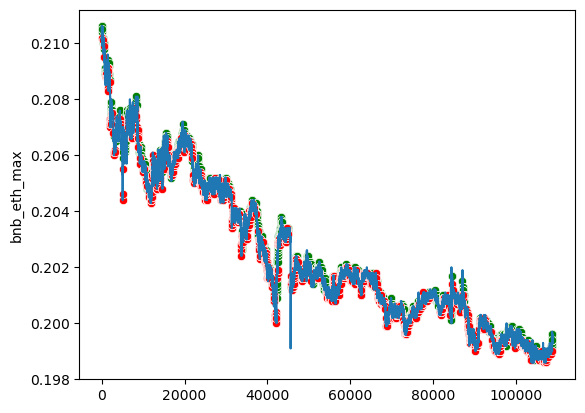

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 30, loss: 0.167
Traid counts: 15974 1: 2695 2: 2749 3: 893 4: 949 5: 2925 6: 5763
              precision    recall  f1-score   support

         0.0       1.00      0.85      0.92    108801
         1.0       0.00      0.32      0.01        31
         2.0       0.01      0.50      0.01        32
         3.0       0.00      0.25      0.01        16
         4.0       0.00      0.25      0.01        16
         5.0       0.00      0.27      0.01        37
         6.0       0.00      0.37      0.00        38

    accuracy                           0.85    108971
   macro avg       0.15      0.40      0.14    108971
weighted avg       1.00      0.85      0.92    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.3386971397524
Прибыль от 300 usdt за 100_000 тиков: 1.2284893593271715


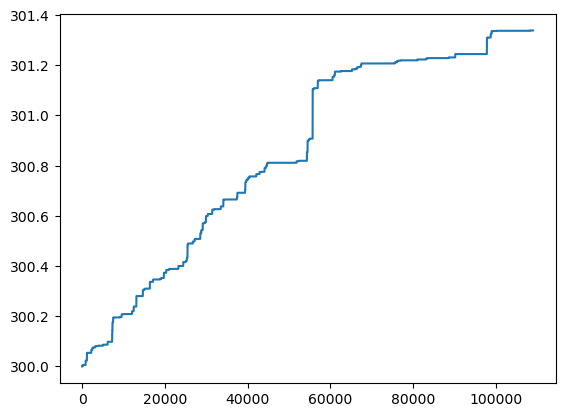

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.2440193840753
Прибыль от 300 usdt за 100_000 тиков: 0.22393057242318845


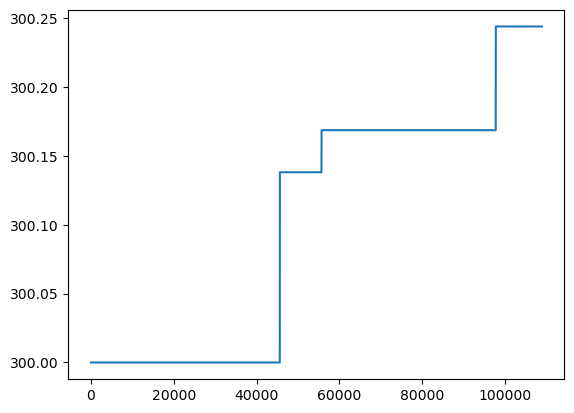

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0879196866144
Прибыль от 300 usdt за 100_000 тиков: 0.0806817287300147


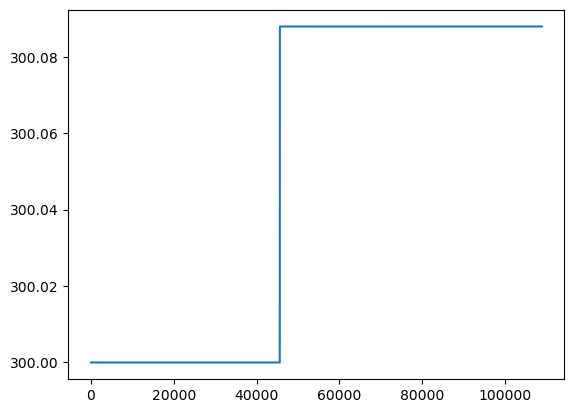

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0376704135977
Прибыль от 300 usdt за 100_000 тиков: 0.03456920978765845


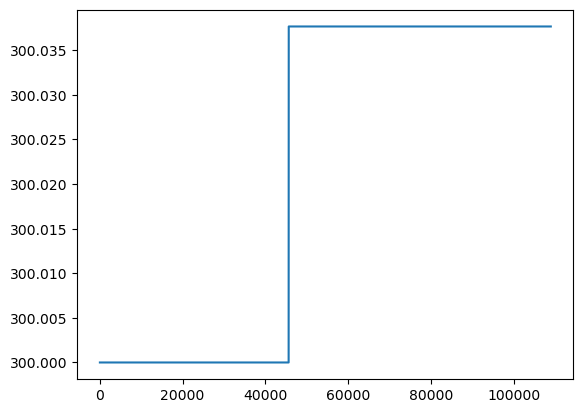

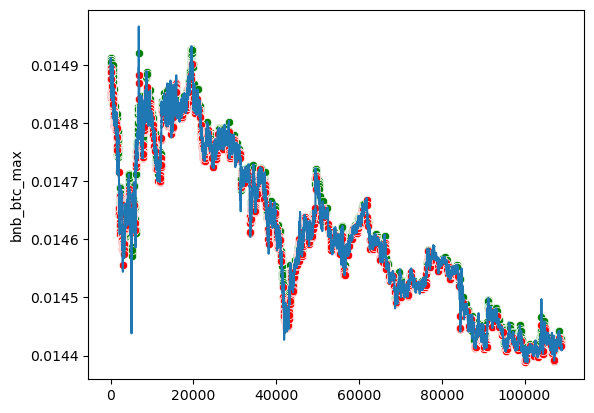

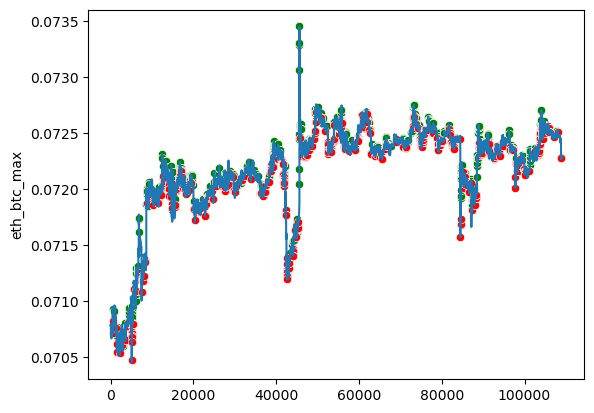

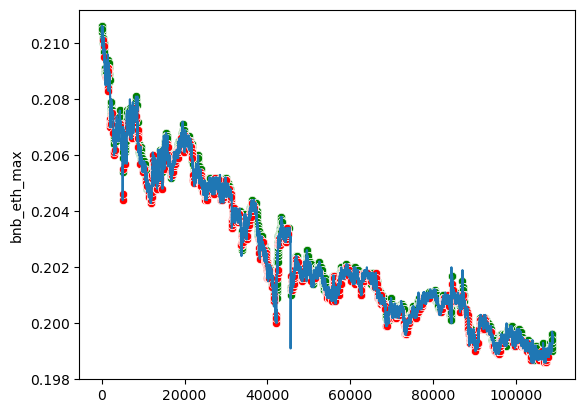

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 35, loss: 0.145
Traid counts: 15479 1: 3116 2: 2715 3: 749 4: 910 5: 3290 6: 4699
              precision    recall  f1-score   support

         0.0       1.00      0.86      0.92    108801
         1.0       0.00      0.45      0.01        31
         2.0       0.01      0.50      0.01        32
         3.0       0.01      0.25      0.01        16
         4.0       0.01      0.38      0.01        16
         5.0       0.00      0.32      0.01        37
         6.0       0.00      0.34      0.01        38

    accuracy                           0.86    108971
   macro avg       0.15      0.44      0.14    108971
weighted avg       1.00      0.86      0.92    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.148222420429
Прибыль от 300 usdt за 100_000 тиков: 1.0536954055932513


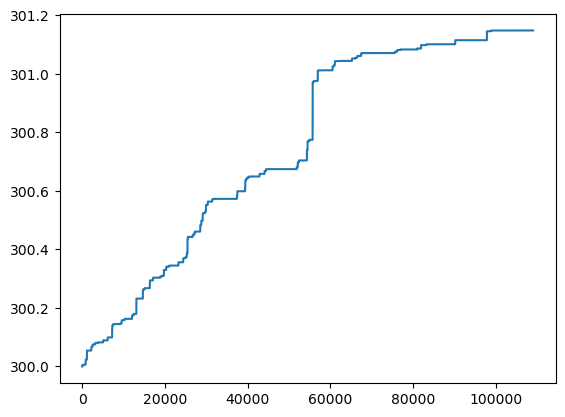

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.2440193840753
Прибыль от 300 usdt за 100_000 тиков: 0.22393057242318845


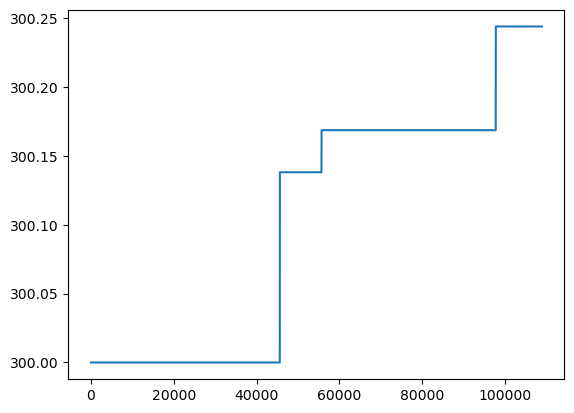

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0879196866144
Прибыль от 300 usdt за 100_000 тиков: 0.0806817287300147


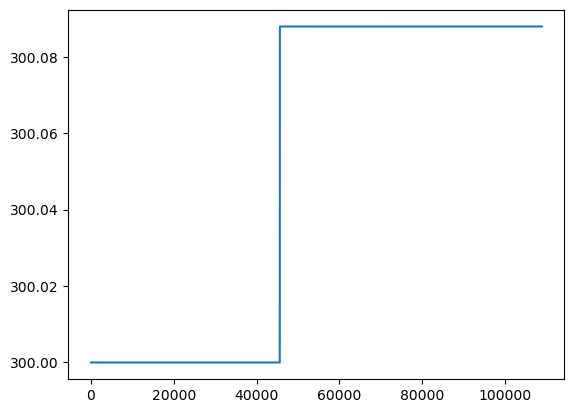

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0376704135977
Прибыль от 300 usdt за 100_000 тиков: 0.03456920978765845


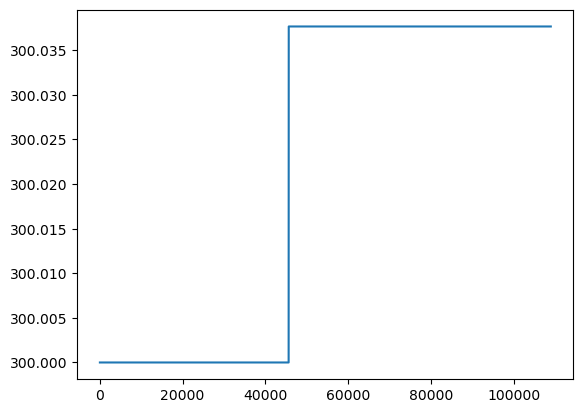

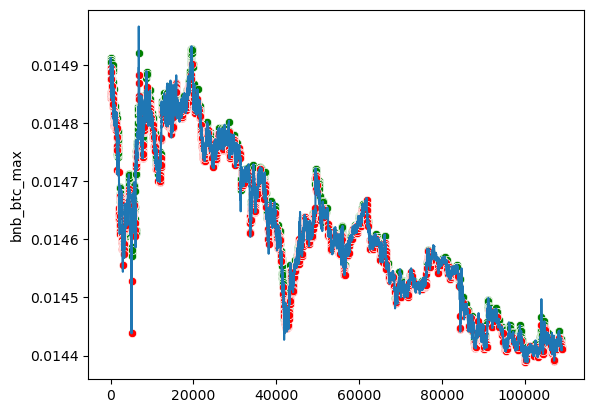

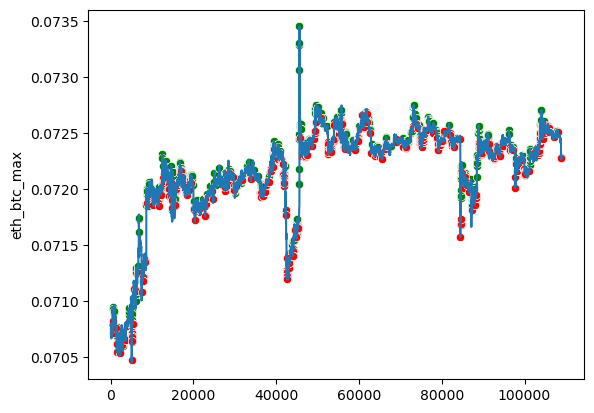

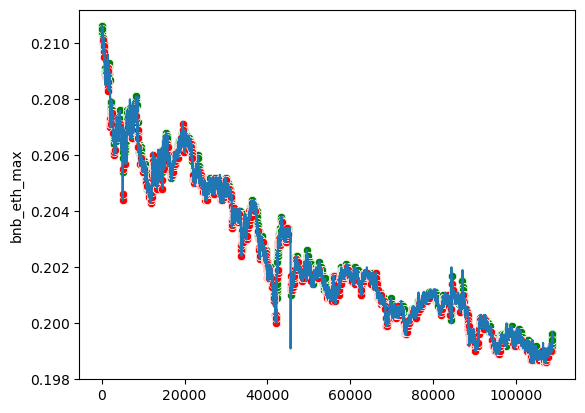

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 40, loss: 0.129
Traid counts: 15001 1: 2881 2: 2435 3: 789 4: 778 5: 3301 6: 4817
              precision    recall  f1-score   support

         0.0       1.00      0.86      0.93    108801
         1.0       0.00      0.39      0.01        31
         2.0       0.01      0.47      0.01        32
         3.0       0.01      0.31      0.01        16
         4.0       0.01      0.25      0.01        16
         5.0       0.00      0.27      0.01        37
         6.0       0.00      0.34      0.01        38

    accuracy                           0.86    108971
   macro avg       0.15      0.41      0.14    108971
weighted avg       1.00      0.86      0.92    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.1276119134984
Прибыль от 300 usdt за 100_000 тиков: 1.0347816515388615


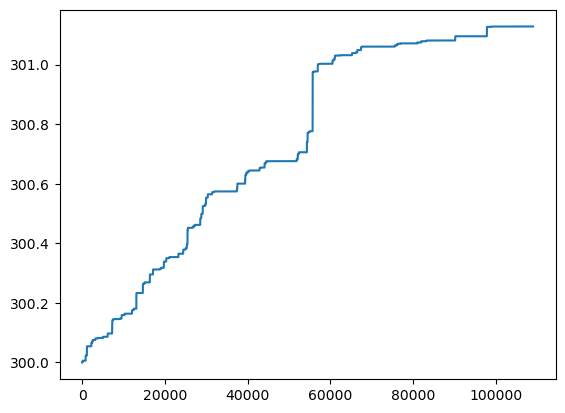

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.2440193840753
Прибыль от 300 usdt за 100_000 тиков: 0.22393057242318845


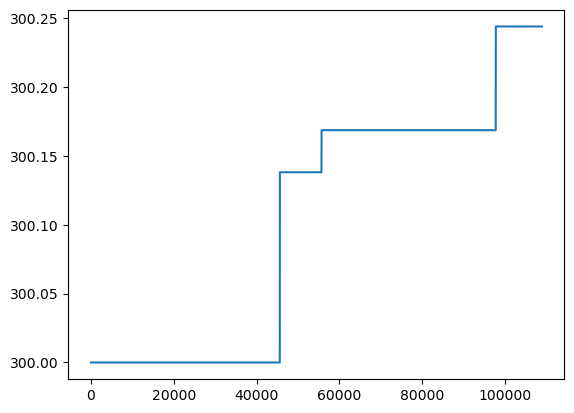

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0879196866144
Прибыль от 300 usdt за 100_000 тиков: 0.0806817287300147


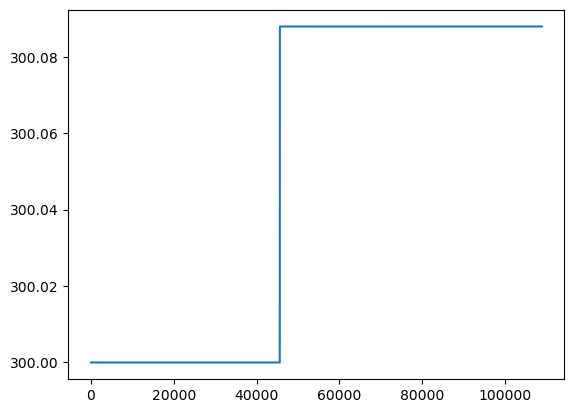

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0376704135977
Прибыль от 300 usdt за 100_000 тиков: 0.03456920978765845


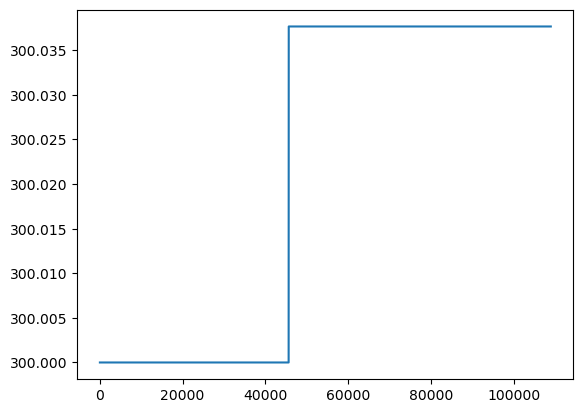

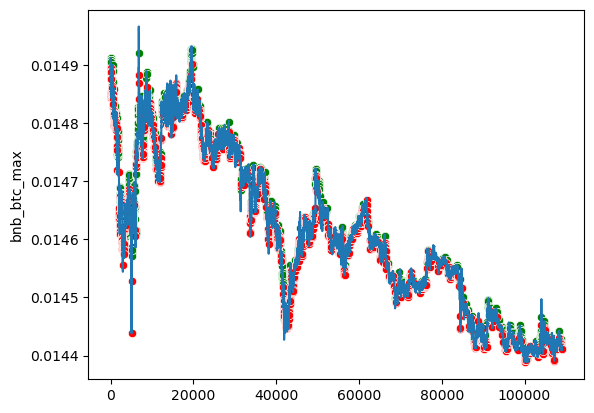

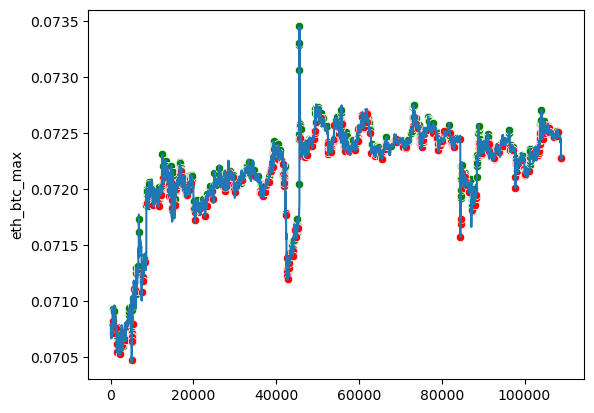

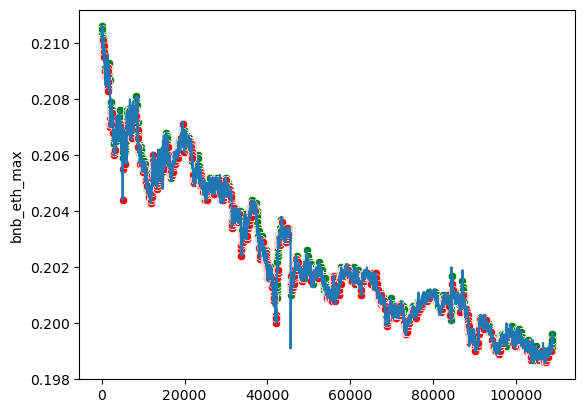

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 45, loss: 0.134
Traid counts: 15293 1: 3081 2: 2310 3: 697 4: 842 5: 3900 6: 4463
              precision    recall  f1-score   support

         0.0       1.00      0.86      0.92    108801
         1.0       0.00      0.42      0.01        31
         2.0       0.01      0.47      0.01        32
         3.0       0.01      0.31      0.01        16
         4.0       0.01      0.31      0.01        16
         5.0       0.00      0.32      0.01        37
         6.0       0.00      0.32      0.01        38

    accuracy                           0.86    108971
   macro avg       0.15      0.43      0.14    108971
weighted avg       1.00      0.86      0.92    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.2303406317797
Прибыль от 300 usdt за 100_000 тиков: 1.1290532635102102


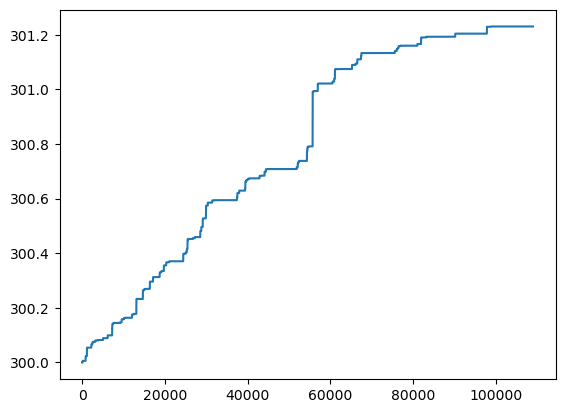

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.2440193840753
Прибыль от 300 usdt за 100_000 тиков: 0.22393057242318845


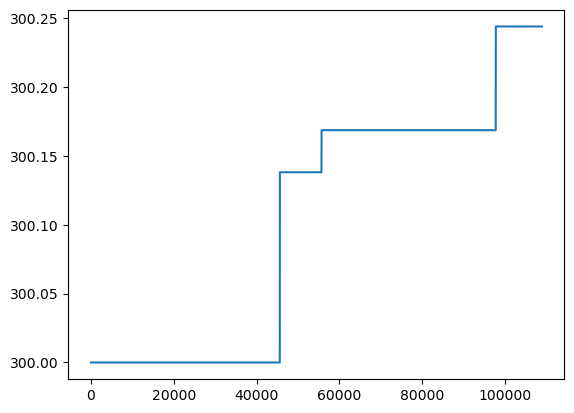

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0879196866144
Прибыль от 300 usdt за 100_000 тиков: 0.0806817287300147


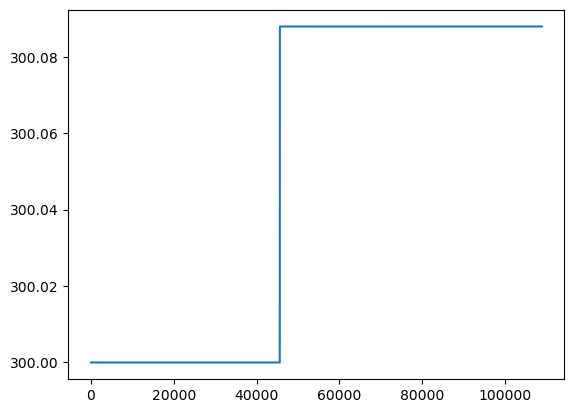

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0376704135977
Прибыль от 300 usdt за 100_000 тиков: 0.03456920978765845


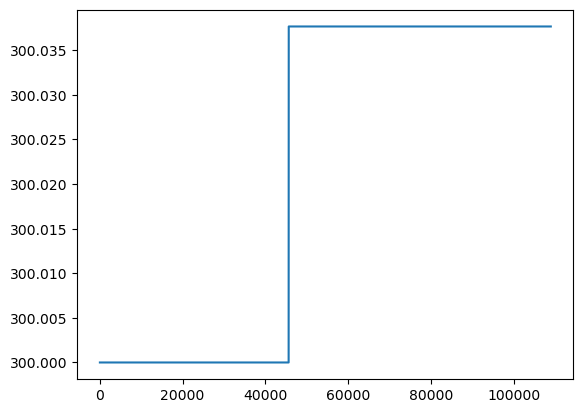

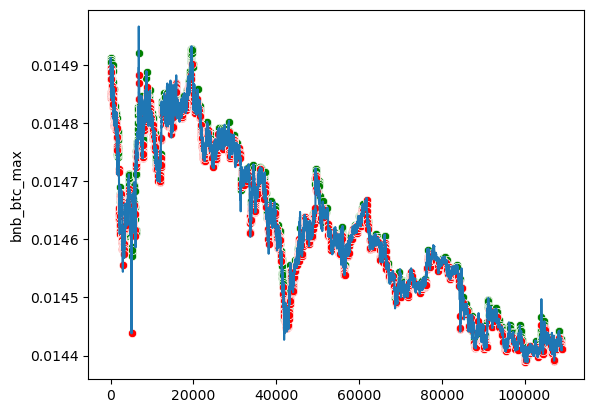

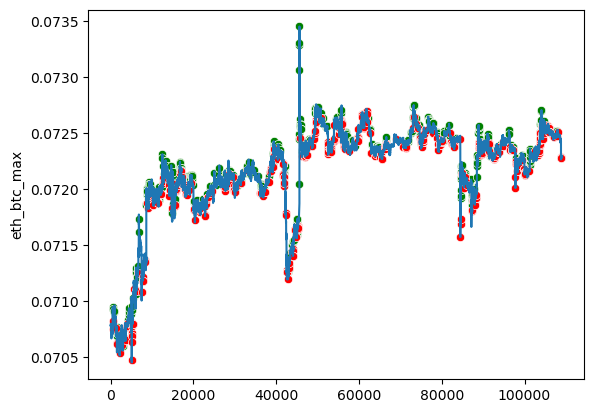

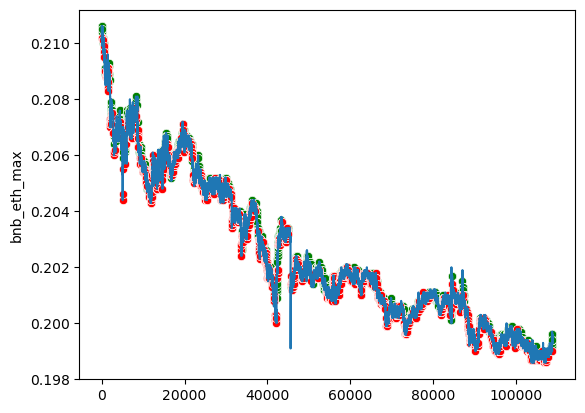

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 50, loss: 0.114
Traid counts: 15510 1: 2984 2: 2497 3: 728 4: 697 5: 3549 6: 5055
              precision    recall  f1-score   support

         0.0       1.00      0.86      0.92    108801
         1.0       0.00      0.42      0.01        31
         2.0       0.01      0.47      0.01        32
         3.0       0.01      0.31      0.01        16
         4.0       0.01      0.25      0.01        16
         5.0       0.00      0.27      0.01        37
         6.0       0.00      0.34      0.01        38

    accuracy                           0.86    108971
   macro avg       0.15      0.42      0.14    108971
weighted avg       1.00      0.86      0.92    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.17921701276157
Прибыль от 300 usdt за 100_000 тиков: 1.0821383787994687


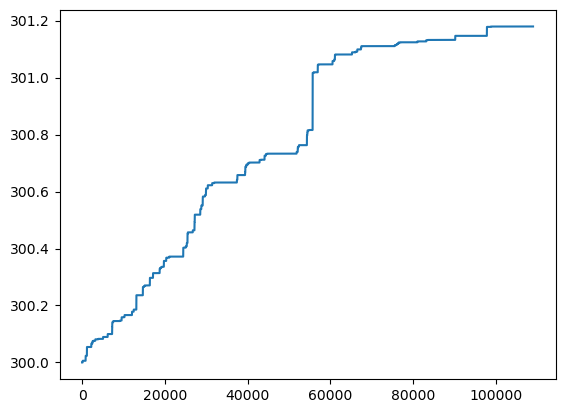

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.2440193840753
Прибыль от 300 usdt за 100_000 тиков: 0.22393057242318845


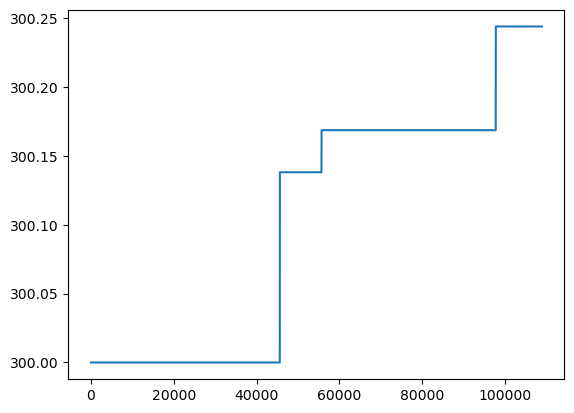

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0879196866144
Прибыль от 300 usdt за 100_000 тиков: 0.0806817287300147


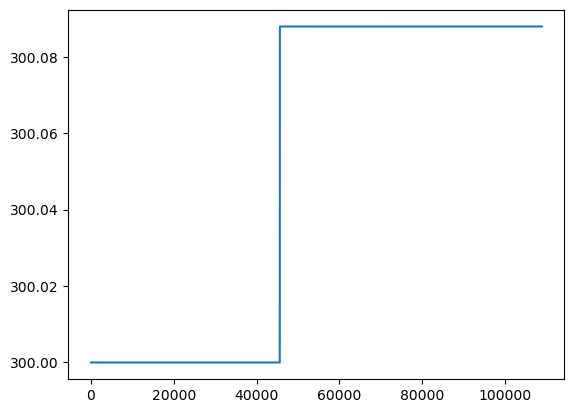

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0376704135977
Прибыль от 300 usdt за 100_000 тиков: 0.03456920978765845


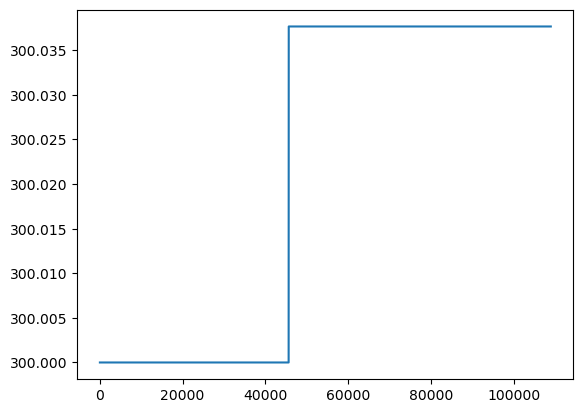

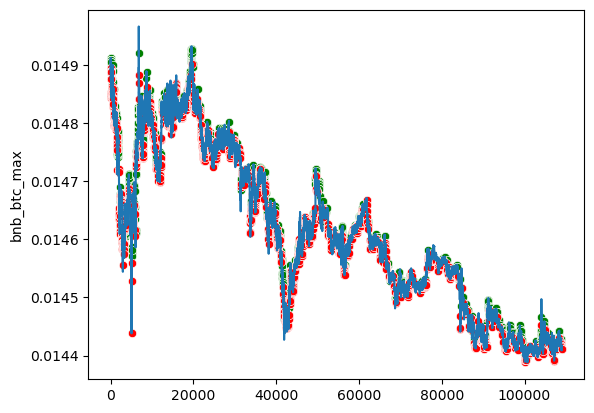

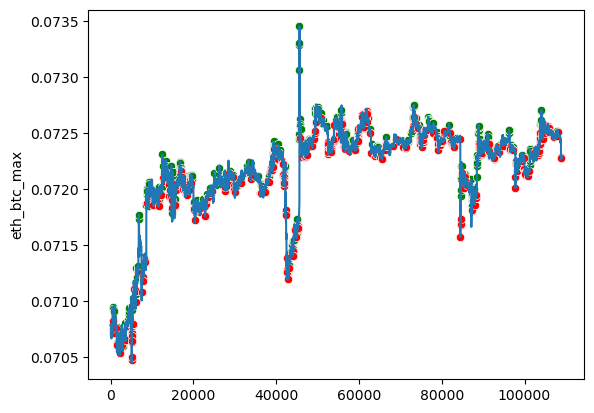

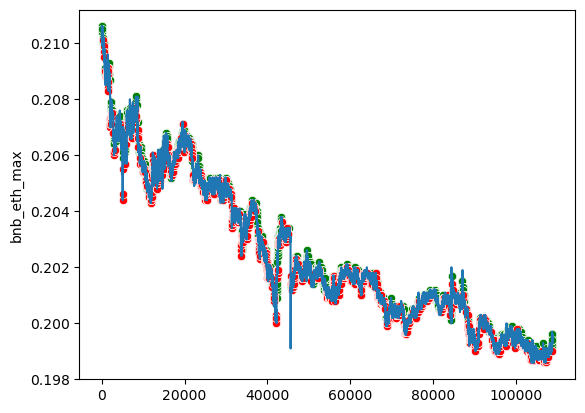

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 55, loss: 0.108
Traid counts: 15184 1: 2807 2: 2623 3: 613 4: 666 5: 3050 6: 5425
              precision    recall  f1-score   support

         0.0       1.00      0.86      0.93    108801
         1.0       0.00      0.45      0.01        31
         2.0       0.01      0.50      0.01        32
         3.0       0.01      0.25      0.01        16
         4.0       0.01      0.25      0.01        16
         5.0       0.00      0.24      0.01        37
         6.0       0.00      0.37      0.01        38

    accuracy                           0.86    108971
   macro avg       0.15      0.42      0.14    108971
weighted avg       1.00      0.86      0.92    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.3373254360865
Прибыль от 300 usdt за 100_000 тиков: 1.2272305806925452


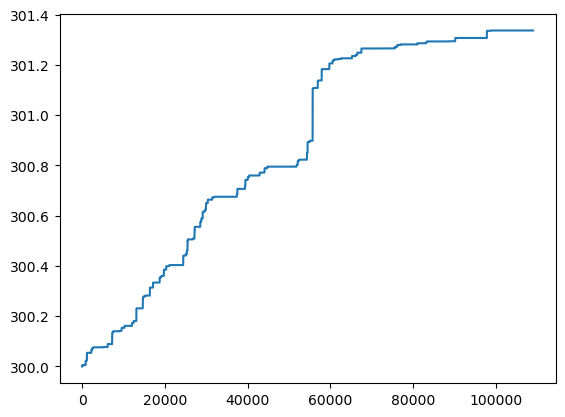

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.2440193840753
Прибыль от 300 usdt за 100_000 тиков: 0.22393057242318845


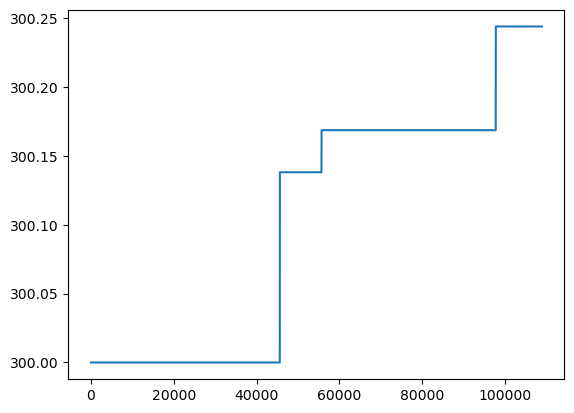

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0879196866144
Прибыль от 300 usdt за 100_000 тиков: 0.0806817287300147


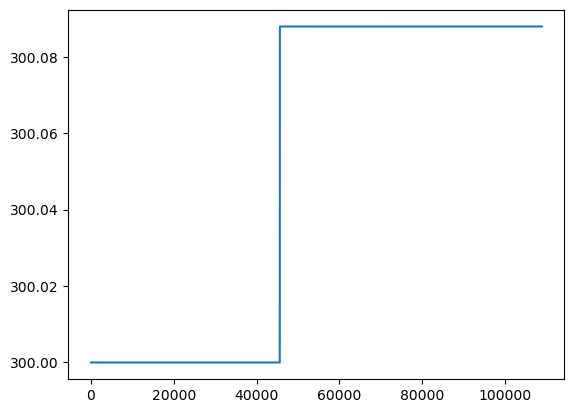

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0376704135977
Прибыль от 300 usdt за 100_000 тиков: 0.03456920978765845


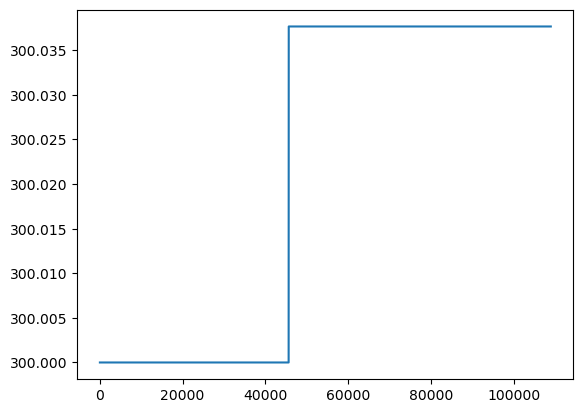

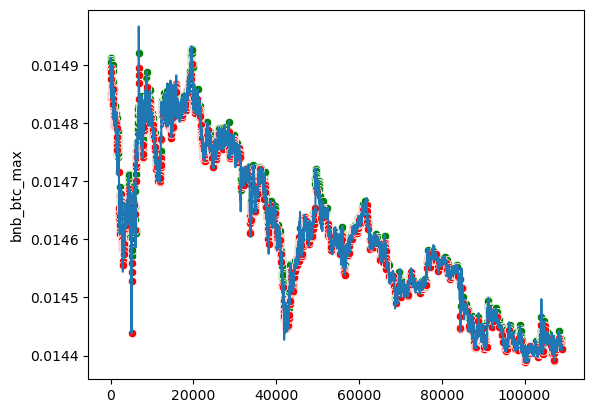

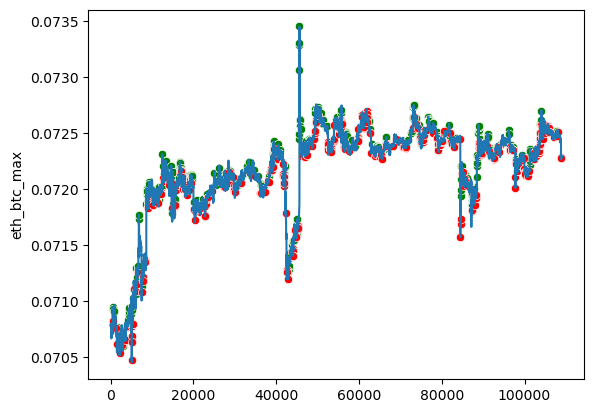

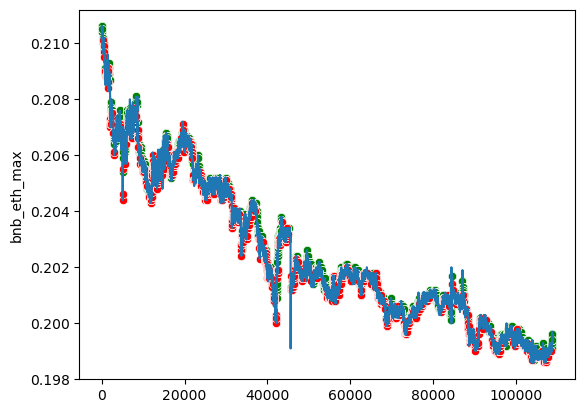

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 60, loss: 0.101
Traid counts: 15296 1: 2730 2: 2782 3: 631 4: 644 5: 2835 6: 5674
              precision    recall  f1-score   support

         0.0       1.00      0.86      0.92    108801
         1.0       0.00      0.32      0.01        31
         2.0       0.01      0.47      0.01        32
         3.0       0.01      0.31      0.02        16
         4.0       0.00      0.19      0.01        16
         5.0       0.00      0.22      0.01        37
         6.0       0.00      0.39      0.01        38

    accuracy                           0.86    108971
   macro avg       0.15      0.39      0.14    108971
weighted avg       1.00      0.86      0.92    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.20284609515494
Прибыль от 300 usdt за 100_000 тиков: 1.1038222051325024


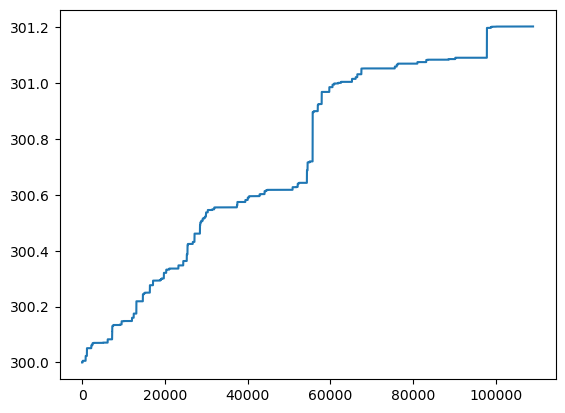

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.2440193840753
Прибыль от 300 usdt за 100_000 тиков: 0.22393057242318845


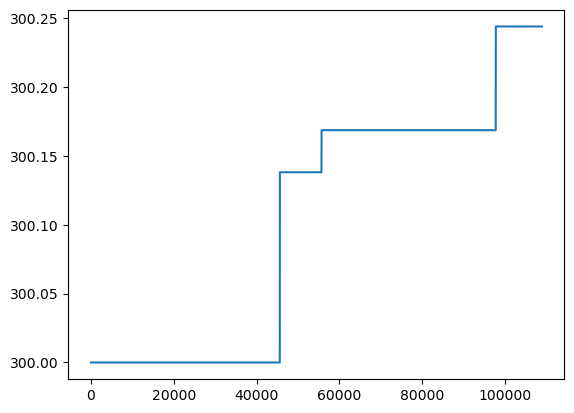

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0879196866144
Прибыль от 300 usdt за 100_000 тиков: 0.0806817287300147


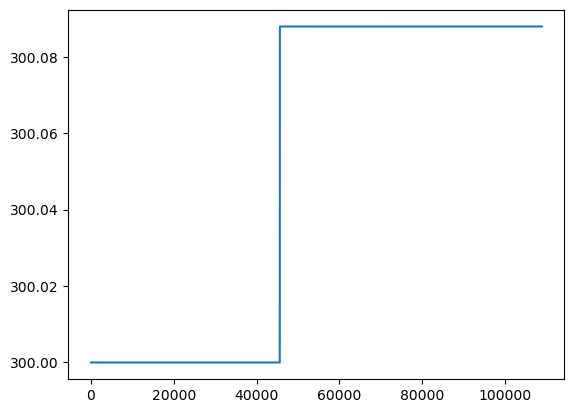

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0376704135977
Прибыль от 300 usdt за 100_000 тиков: 0.03456920978765845


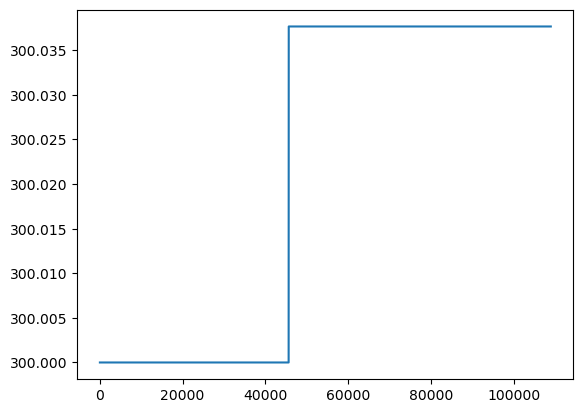

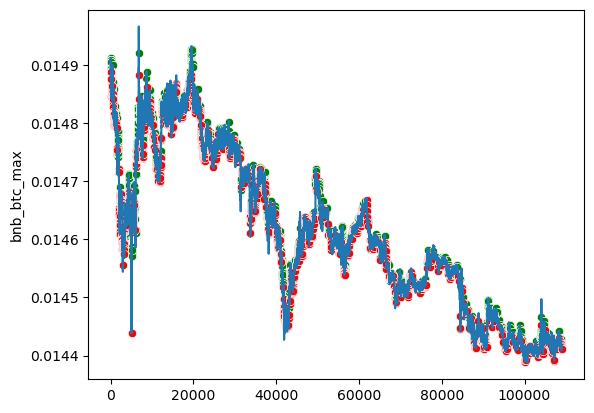

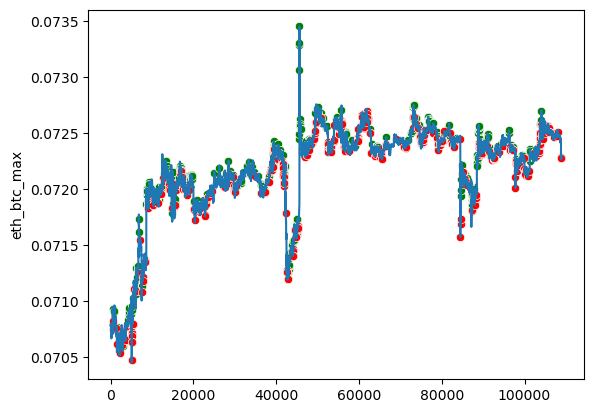

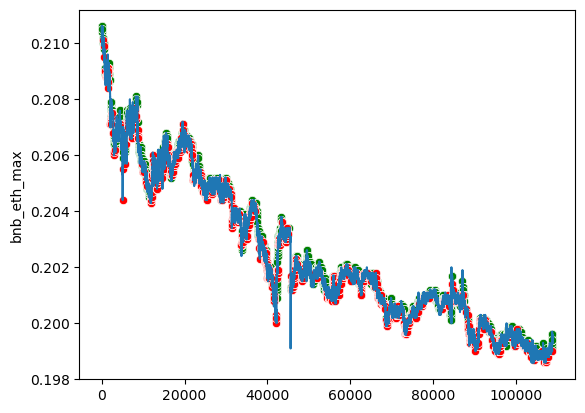

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 65, loss: 0.089
Traid counts: 14727 1: 2538 2: 2855 3: 610 4: 619 5: 2810 6: 5295
              precision    recall  f1-score   support

         0.0       1.00      0.87      0.93    108801
         1.0       0.00      0.32      0.01        31
         2.0       0.01      0.50      0.01        32
         3.0       0.01      0.25      0.01        16
         4.0       0.00      0.06      0.00        16
         5.0       0.00      0.24      0.01        37
         6.0       0.00      0.32      0.00        38

    accuracy                           0.86    108971
   macro avg       0.15      0.37      0.14    108971
weighted avg       1.00      0.86      0.93    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.16909774470224
Прибыль от 300 usdt за 100_000 тиков: 1.072852175993835


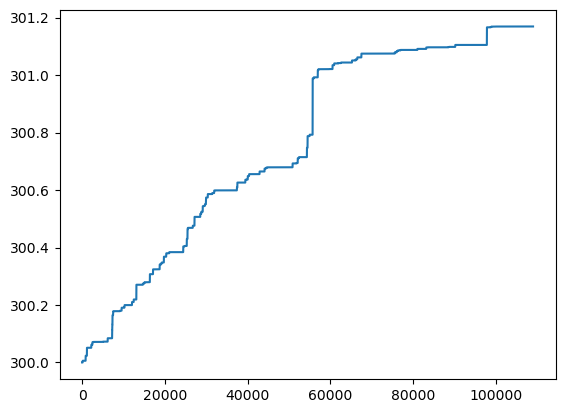

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.2440193840753
Прибыль от 300 usdt за 100_000 тиков: 0.22393057242318845


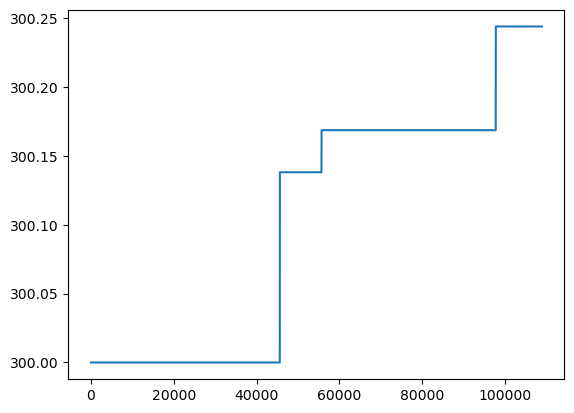

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0879196866144
Прибыль от 300 usdt за 100_000 тиков: 0.0806817287300147


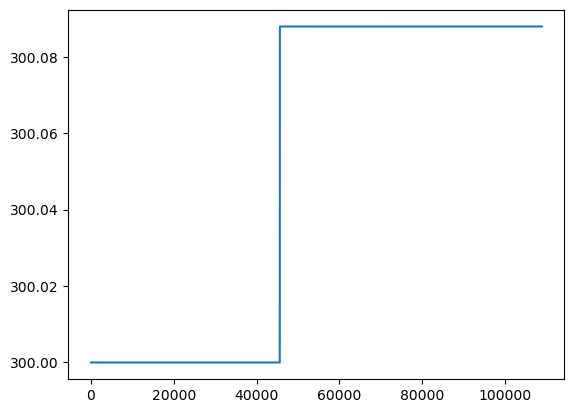

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0376704135977
Прибыль от 300 usdt за 100_000 тиков: 0.03456920978765845


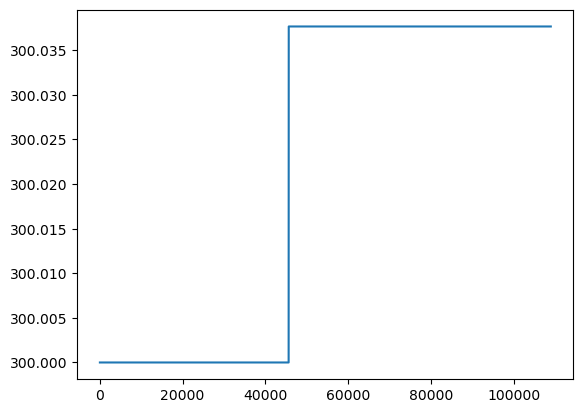

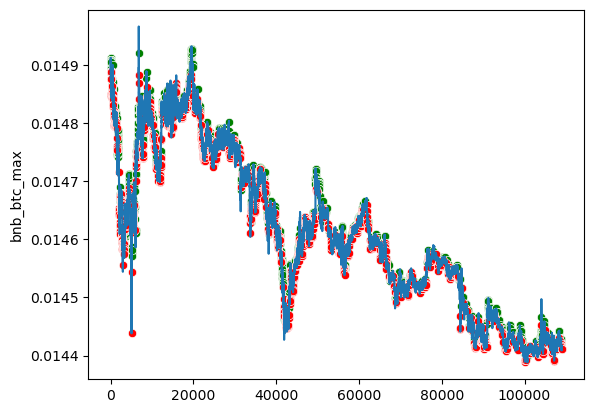

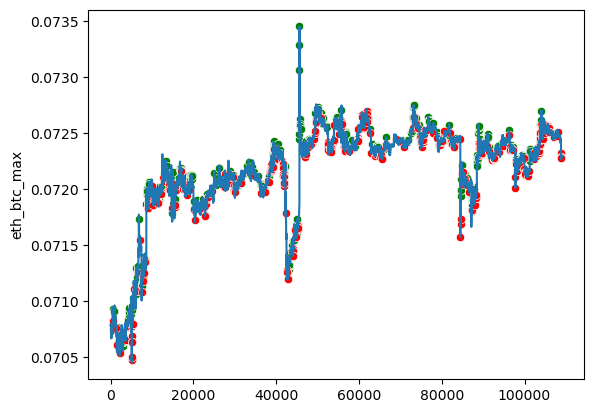

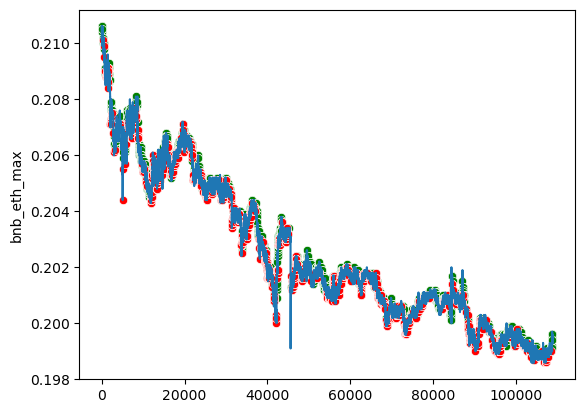

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 70, loss: 0.083
Traid counts: 14991 1: 2647 2: 2704 3: 661 4: 652 5: 2897 6: 5430
              precision    recall  f1-score   support

         0.0       1.00      0.86      0.93    108801
         1.0       0.00      0.32      0.01        31
         2.0       0.01      0.44      0.01        32
         3.0       0.01      0.31      0.01        16
         4.0       0.00      0.19      0.01        16
         5.0       0.00      0.22      0.01        37
         6.0       0.00      0.37      0.01        38

    accuracy                           0.86    108971
   macro avg       0.15      0.39      0.14    108971
weighted avg       1.00      0.86      0.92    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.2323416761391
Прибыль от 300 usdt за 100_000 тиков: 1.1308895725826795


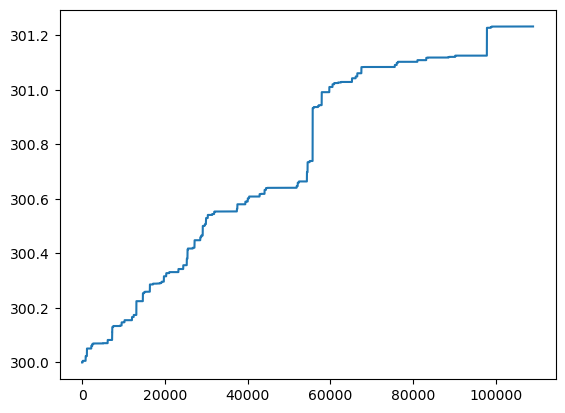

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.2440193840753
Прибыль от 300 usdt за 100_000 тиков: 0.22393057242318845


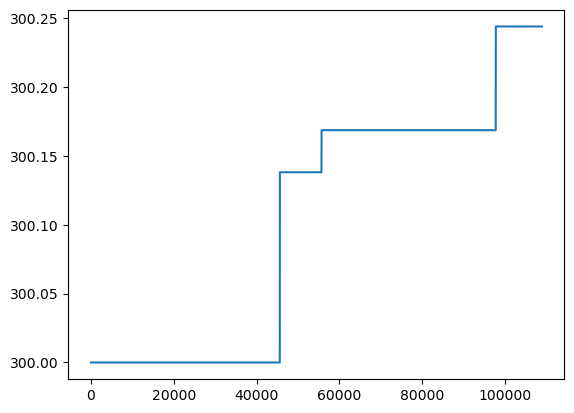

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0879196866144
Прибыль от 300 usdt за 100_000 тиков: 0.0806817287300147


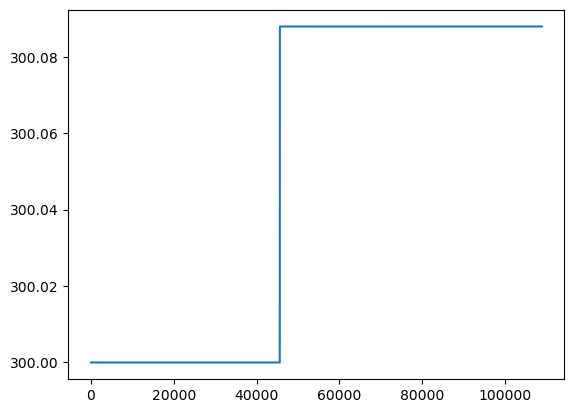

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0376704135977
Прибыль от 300 usdt за 100_000 тиков: 0.03456920978765845


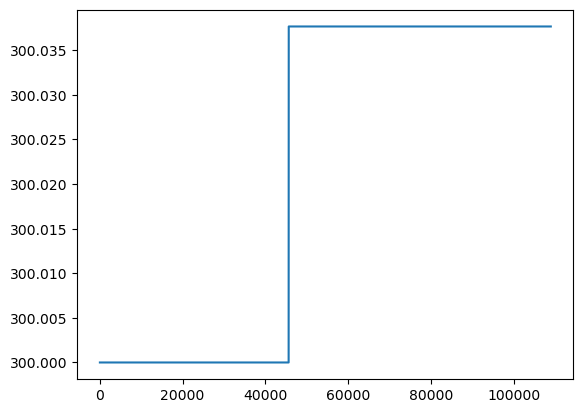

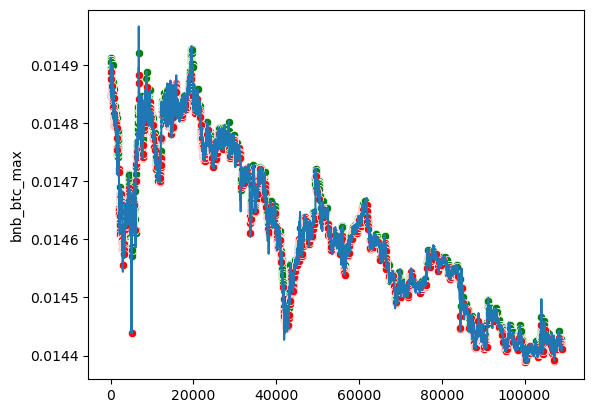

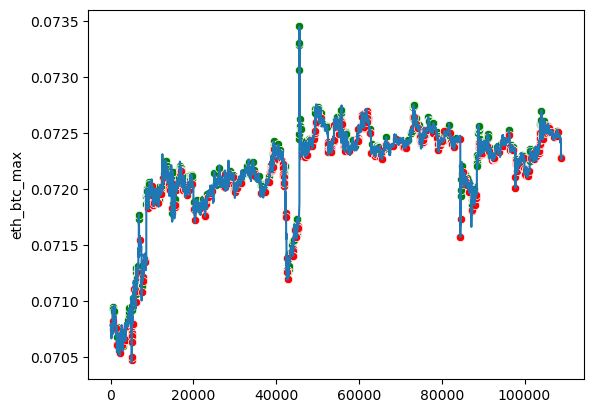

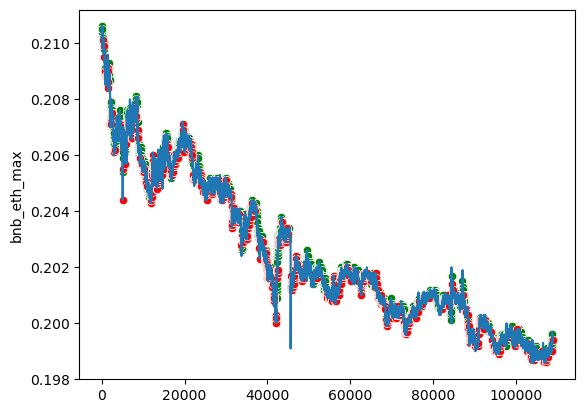

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 75, loss: 0.073
Traid counts: 14441 1: 2667 2: 2471 3: 663 4: 598 5: 2801 6: 5241
              precision    recall  f1-score   support

         0.0       1.00      0.87      0.93    108801
         1.0       0.00      0.32      0.01        31
         2.0       0.01      0.44      0.01        32
         3.0       0.01      0.31      0.01        16
         4.0       0.01      0.19      0.01        16
         5.0       0.00      0.24      0.01        37
         6.0       0.00      0.37      0.01        38

    accuracy                           0.87    108971
   macro avg       0.15      0.39      0.14    108971
weighted avg       1.00      0.87      0.93    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.1541010486283
Прибыль от 300 usdt за 100_000 тиков: 1.05909007775309


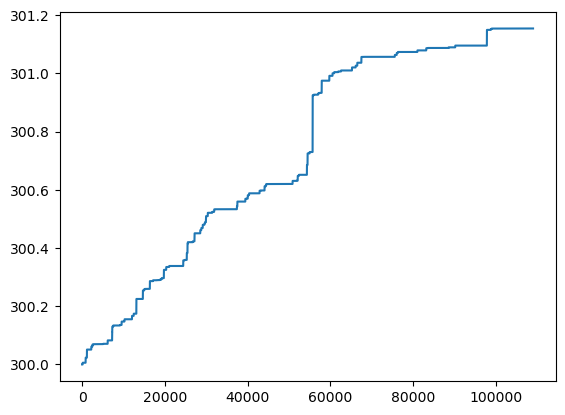

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.2440193840753
Прибыль от 300 usdt за 100_000 тиков: 0.22393057242318845


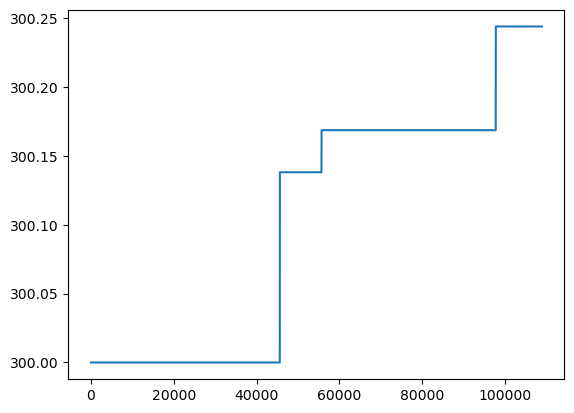

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0879196866144
Прибыль от 300 usdt за 100_000 тиков: 0.0806817287300147


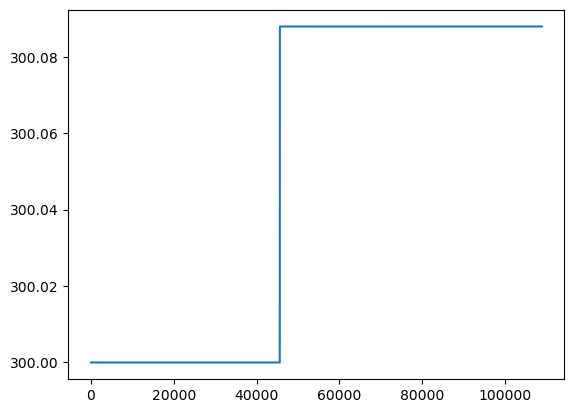

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0376704135977
Прибыль от 300 usdt за 100_000 тиков: 0.03456920978765845


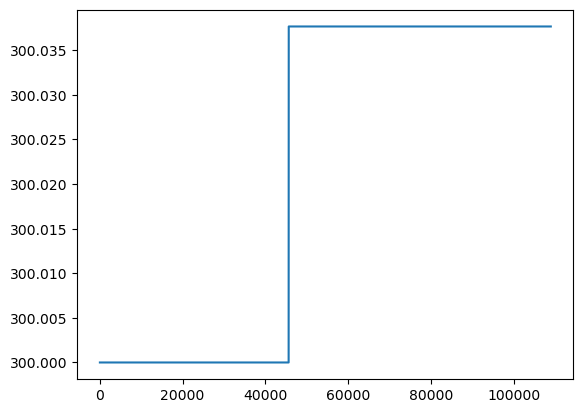

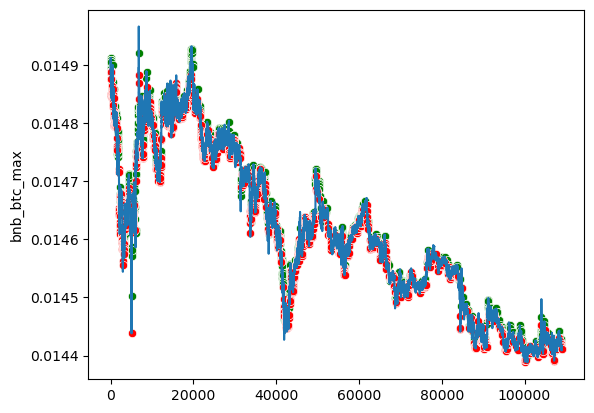

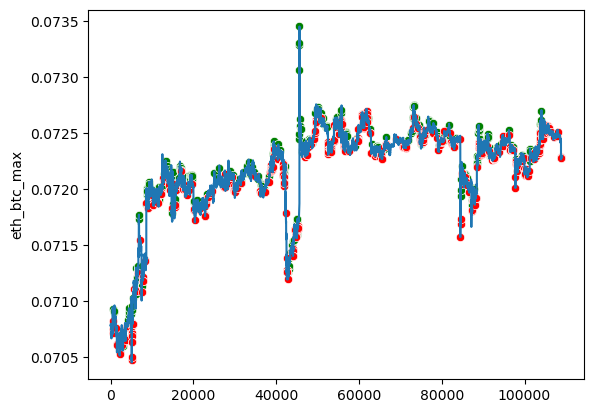

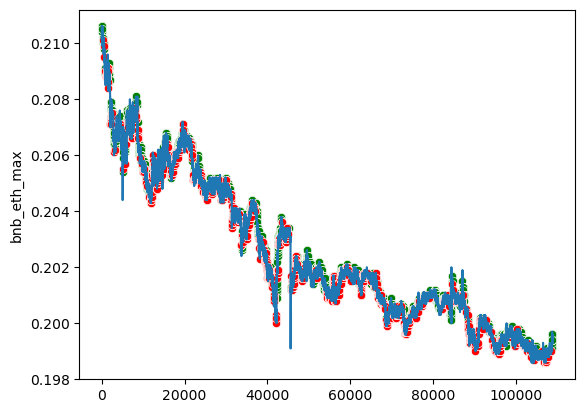

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 80, loss: 0.092
Traid counts: 15029 1: 2613 2: 2385 3: 805 4: 626 5: 3350 6: 5250
              precision    recall  f1-score   support

         0.0       1.00      0.86      0.93    108801
         1.0       0.00      0.29      0.01        31
         2.0       0.01      0.38      0.01        32
         3.0       0.00      0.25      0.01        16
         4.0       0.00      0.06      0.00        16
         5.0       0.00      0.22      0.00        37
         6.0       0.00      0.32      0.00        38

    accuracy                           0.86    108971
   macro avg       0.15      0.34      0.14    108971
weighted avg       1.00      0.86      0.92    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.17416728178375
Прибыль от 300 usdt за 100_000 тиков: 1.0775043651831704


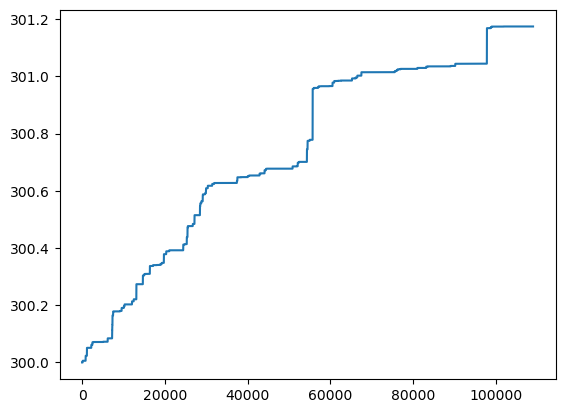

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.2440193840753
Прибыль от 300 usdt за 100_000 тиков: 0.22393057242318845


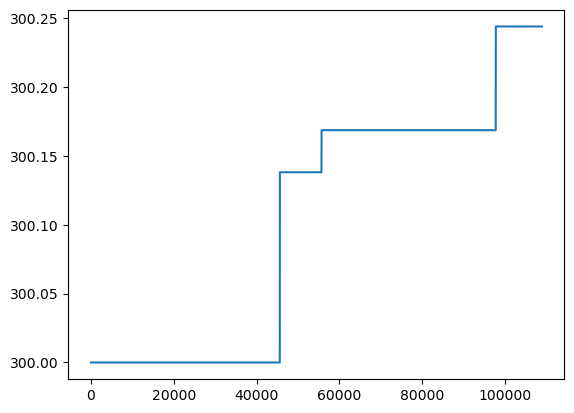

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0879196866144
Прибыль от 300 usdt за 100_000 тиков: 0.0806817287300147


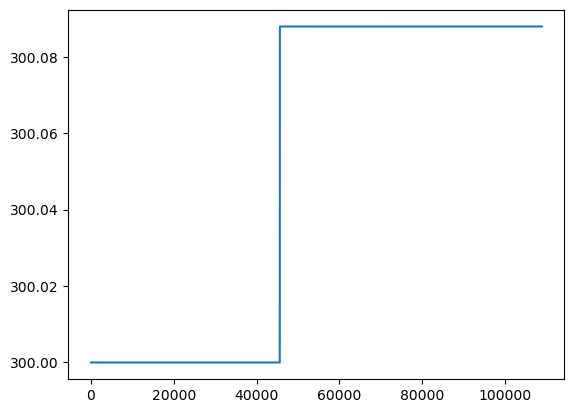

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0376704135977
Прибыль от 300 usdt за 100_000 тиков: 0.03456920978765845


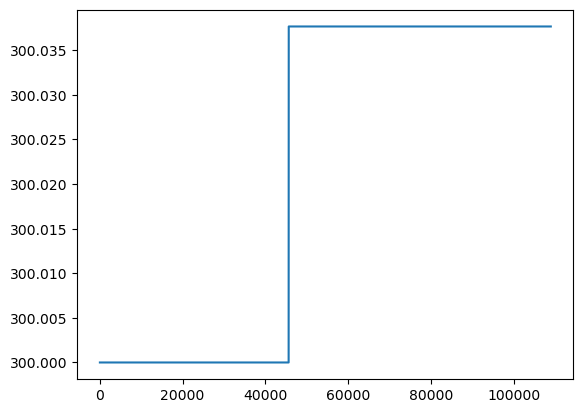

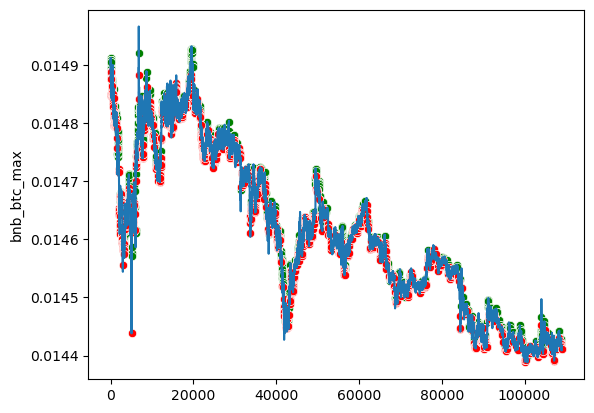

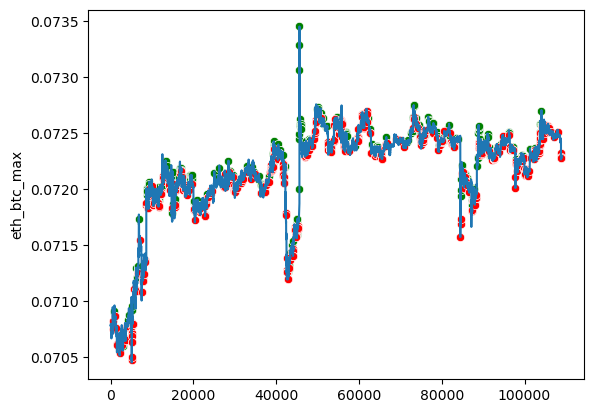

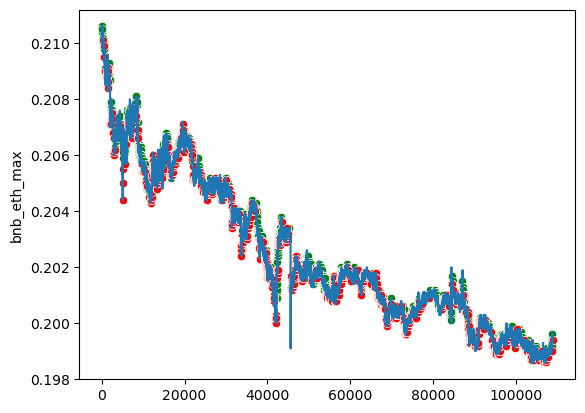

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 85, loss: 0.068
Traid counts: 14579 1: 2558 2: 2593 3: 644 4: 606 5: 2641 6: 5537
              precision    recall  f1-score   support

         0.0       1.00      0.87      0.93    108801
         1.0       0.00      0.32      0.01        31
         2.0       0.01      0.44      0.01        32
         3.0       0.01      0.25      0.01        16
         4.0       0.01      0.25      0.01        16
         5.0       0.00      0.14      0.00        37
         6.0       0.00      0.34      0.00        38

    accuracy                           0.87    108971
   macro avg       0.15      0.37      0.14    108971
weighted avg       1.00      0.87      0.93    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.1690320695369
Прибыль от 300 usdt за 100_000 тиков: 1.0727919075138441


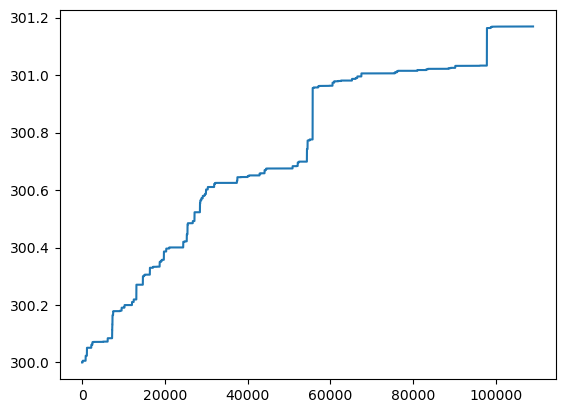

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.2440193840753
Прибыль от 300 usdt за 100_000 тиков: 0.22393057242318845


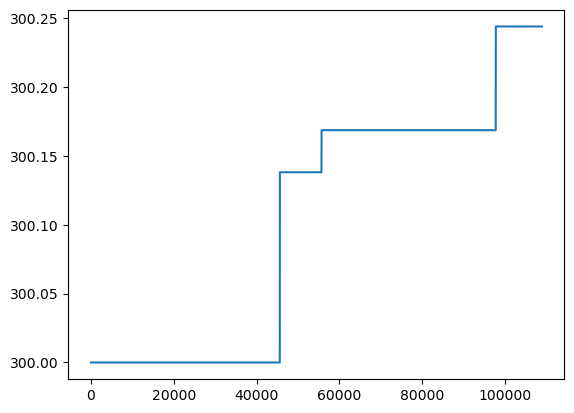

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0879196866144
Прибыль от 300 usdt за 100_000 тиков: 0.0806817287300147


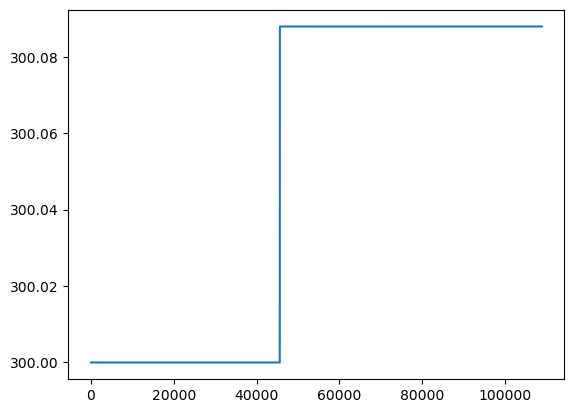

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0376704135977
Прибыль от 300 usdt за 100_000 тиков: 0.03456920978765845


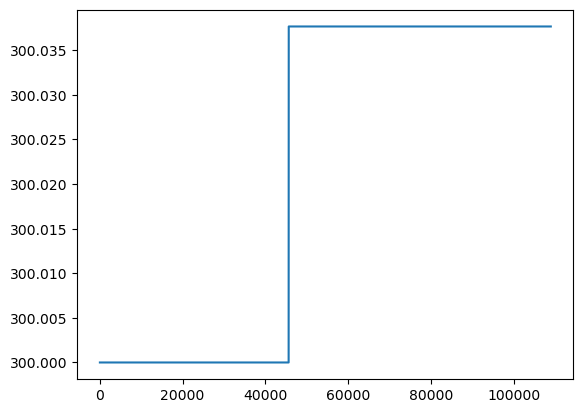

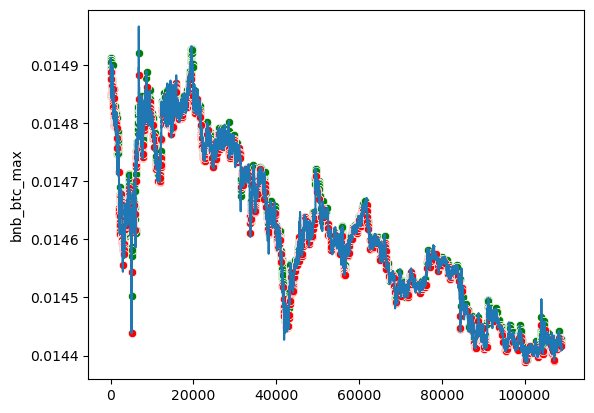

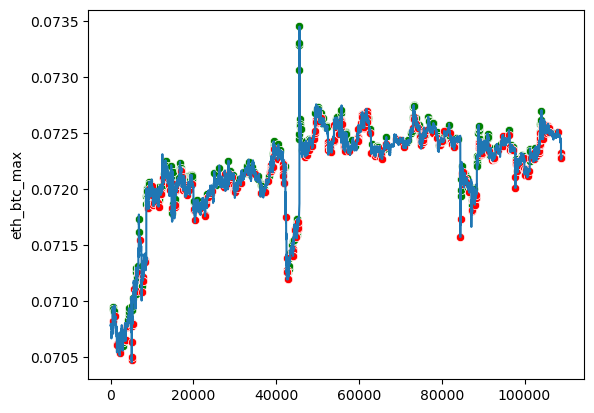

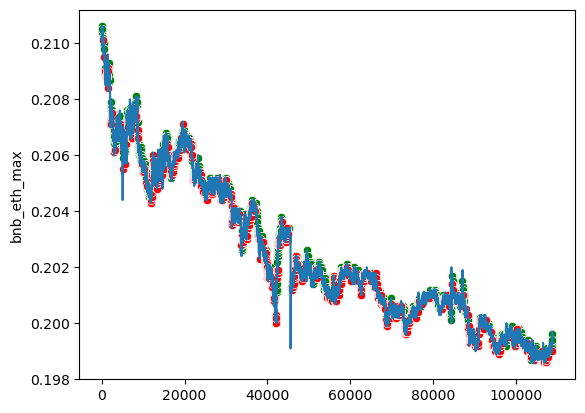

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 90, loss: 0.067
Traid counts: 14430 1: 2586 2: 2158 3: 610 4: 557 5: 2944 6: 5575
              precision    recall  f1-score   support

         0.0       1.00      0.87      0.93    108801
         1.0       0.00      0.32      0.01        31
         2.0       0.01      0.41      0.01        32
         3.0       0.01      0.25      0.01        16
         4.0       0.01      0.19      0.01        16
         5.0       0.00      0.19      0.00        37
         6.0       0.00      0.39      0.01        38

    accuracy                           0.87    108971
   macro avg       0.15      0.37      0.14    108971
weighted avg       1.00      0.87      0.93    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.3094803623293
Прибыль от 300 usdt за 100_000 тиков: 1.2016778430309734


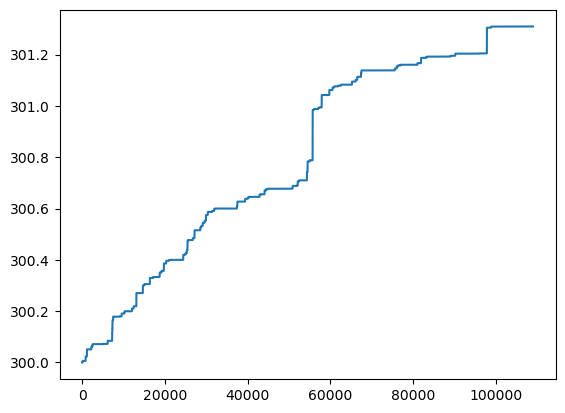

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.2440193840753
Прибыль от 300 usdt за 100_000 тиков: 0.22393057242318845


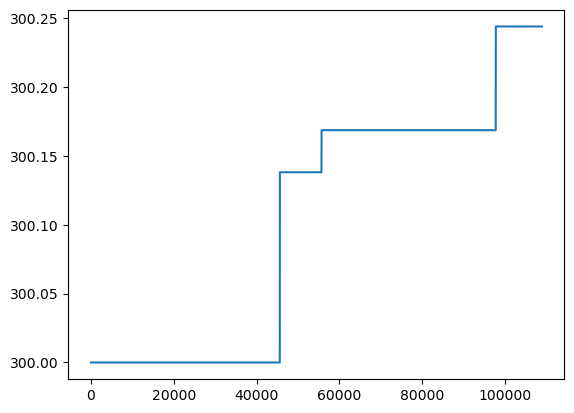

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0879196866144
Прибыль от 300 usdt за 100_000 тиков: 0.0806817287300147


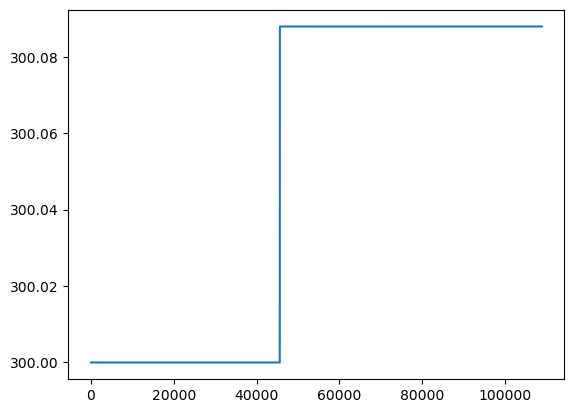

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0376704135977
Прибыль от 300 usdt за 100_000 тиков: 0.03456920978765845


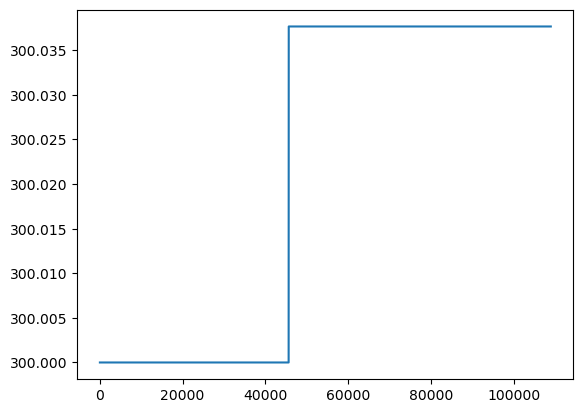

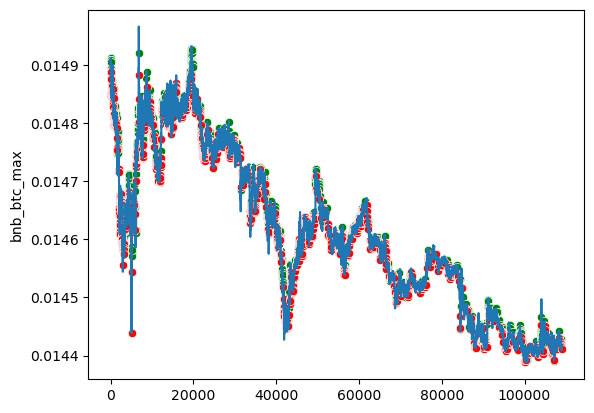

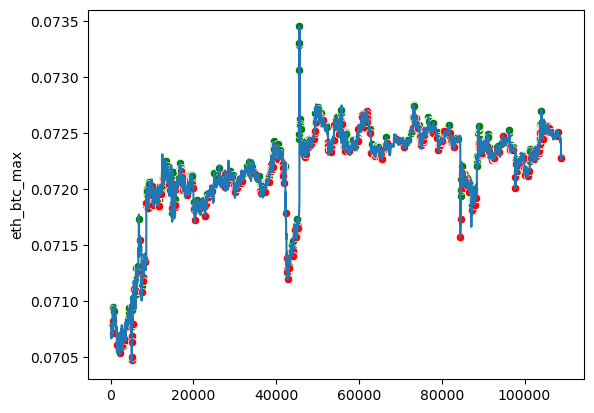

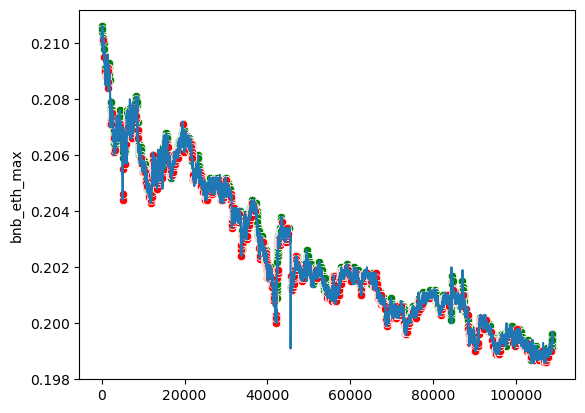

---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
Epoch: 95, loss: 0.067
Traid counts: 14620 1: 2950 2: 2108 3: 641 4: 617 5: 3030 6: 5274
              precision    recall  f1-score   support

         0.0       1.00      0.87      0.93    108801
         1.0       0.00      0.42      0.01        31
         2.0       0.01      0.34      0.01        32
         3.0       0.01      0.25      0.01        16
         4.0       0.01      0.25      0.01        16
         5.0       0.00      0.16      0.00        37
         6.0       0.00      0.37      0.01        38

    accuracy                           0.87    108971
   macro avg       0.15      0.38      0.14    108971
weighted avg       1.00      0.87      0.93    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 301.1529807548143
Прибыль от 300 usdt за 100_000 тиков: 1.0580620117409951


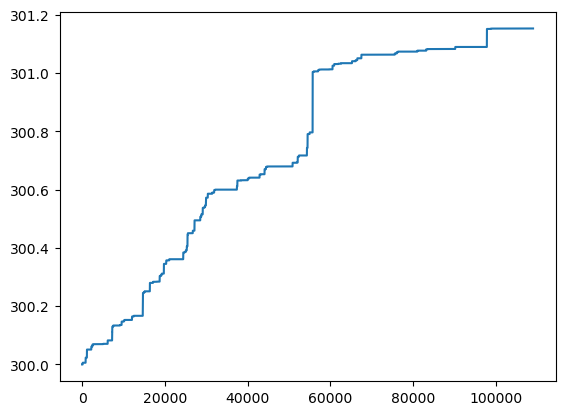

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.2440193840753
Прибыль от 300 usdt за 100_000 тиков: 0.22393057242318845


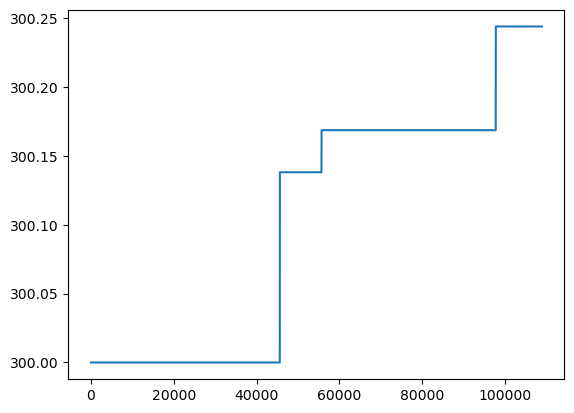

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0879196866144
Прибыль от 300 usdt за 100_000 тиков: 0.0806817287300147


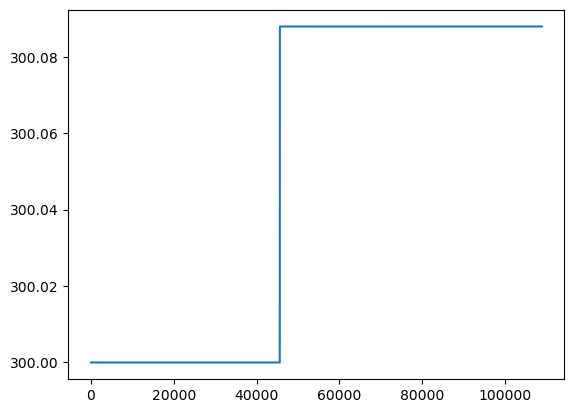

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0376704135977
Прибыль от 300 usdt за 100_000 тиков: 0.03456920978765845


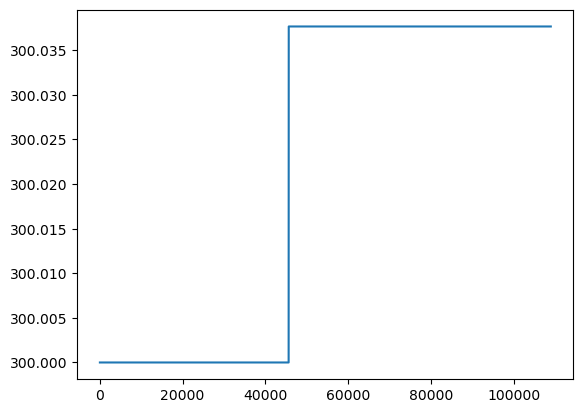

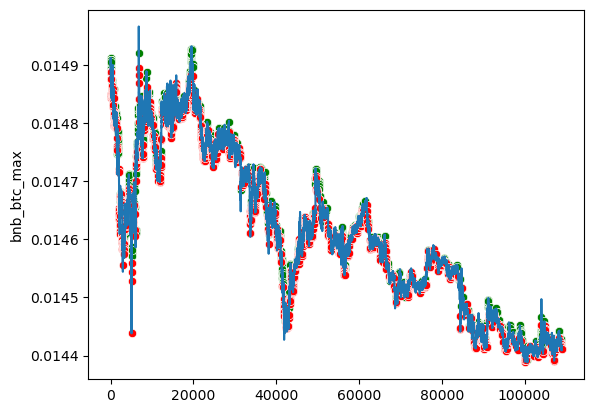

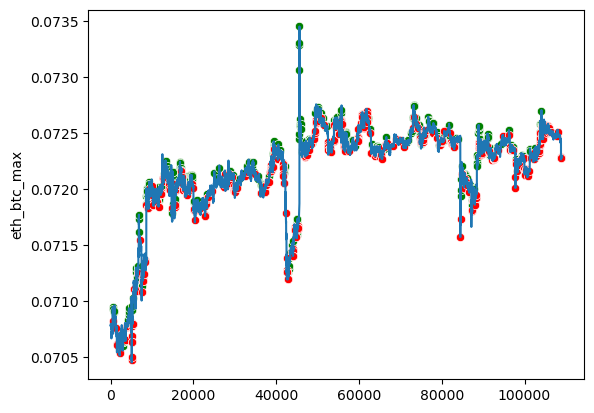

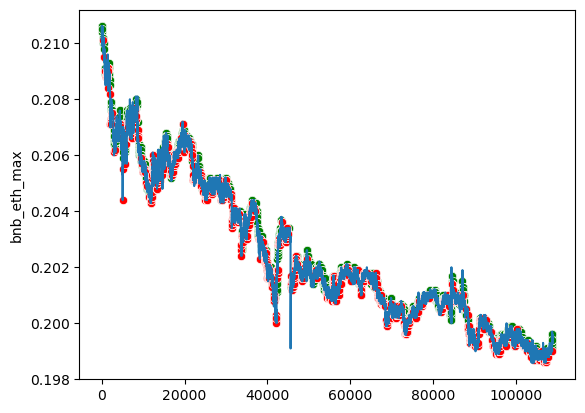

CPU times: total: 5h 19min 37s
Wall time: 5h 16min 54s


In [48]:
%%time

epoch_list = list()
loss_list = list()
traid_counts_list = list()
profit_300_1_list = list()
profit_300_2_list = list()
profit_300_3_list = list()
profit_300_4_list = list()

ticker_price_valid_values = ticker_price_valid.values
ticker_price_valid_fig = ticker_price_valid

min_max_net = MinMaxNet().to('cuda')

loss_fn = nn.CrossEntropyLoss()
optimizer = optim.Adam(min_max_net.parameters(), lr=0.0001)

for epoch in range(EPOCH):
    loss_array = np.array([], dtype=float)
    for i, batch in enumerate(train_loader):
        optimizer.zero_grad()
        
        _, _, _, X_last_min_max_batch,  depth_scaled_batch, y_batch = batch
        X_last_min_max_batch = X_last_min_max_batch.to('cuda')
        depth_scaled_batch = depth_scaled_batch.to('cuda')
        y_batch = y_batch.to('cuda')
        
        output = min_max_net.forward(X_last_min_max_batch, depth_scaled_batch)
        loss =loss_fn(output, y_batch)
        loss.backward()
        optimizer.step()
        loss_array = np.append(loss_array, loss.to('cpu').detach().numpy())
    if epoch % 5 == 0:
        print('---***---***---***---***---***---***---***---***---***---***---***---***---')
        print('Predict start')
        predict = torch.empty((1), dtype=torch.float).to('cuda')
        y_valid_tensor = torch.empty((1), dtype=torch.float)
        
        for i_valid, batch_valid in enumerate(valid_loader):
            
            _, _, _, X_last_min_max_batch_valid,  depth_scaled_batch_valid, y_batch_valid = batch_valid
            X_last_min_max_batch_valid = X_last_min_max_batch_valid.to('cuda')
            depth_scaled_batch_valid = depth_scaled_batch_valid.to('cuda')
            
            predict_batch = torch.argmax(min_max_net.inference(X_last_min_max_batch_valid, depth_scaled_batch_valid), dim=1)
            predict = torch.cat((predict, predict_batch), 0)
            y_valid_tensor = torch.cat((y_valid_tensor, y_batch_valid), 0)
        
        
        predict = predict[1:]
        y_valid_tensor = y_valid_tensor[1:]
        epoch_list.append(epoch)
        loss_mean = loss_array.mean()
        loss_list.append(loss_mean)
        print(f'Epoch: {epoch}, loss: {loss_mean:.3f}')
        traid_counts = (predict!=0).sum()
        traid_counts_list.append(traid_counts)
        print(f'Traid counts: {traid_counts}',
              f'1: {(predict==1).sum()}',
              f'2: {(predict==2).sum()}',
              f'3: {(predict==3).sum()}',
              f'4: {(predict==4).sum()}',
              f'5: {(predict==5).sum()}',
              f'6: {(predict==6).sum()}'
             )
        predict = predict.to('cpu').detach().numpy()
        print(classification_report(y_valid_tensor.detach().numpy(), predict))
        
        for slip_n in range(1,5):
            print("-------------")
            print(f'SLIP_N = {slip_n}')
            trade_result, volume_not_trade = trade(ticker_price_valid_values, predict, FEE, slip_n)
            trade_result = np.array(trade_result)
            print(f'Без торгов за счёт изменения курса с 300 usdt: {volume_not_trade}')
            print(f'Результат торгов с 300 usdt: {trade_result[-1]}')
            
            profit_300 = (trade_result[-1]-300)*100_000/predict.shape[0]
            if slip_n == 1:
                profit_300_1_list.append(profit_300)
            elif slip_n == 2:
                profit_300_2_list.append(profit_300)
            elif slip_n == 3:
                profit_300_3_list.append(profit_300)
            elif slip_n == 4:
                profit_300_4_list.append(profit_300)
            print(f'Прибыль от 300 usdt за 100_000 тиков: {profit_300}')
            sns.lineplot(x=range(trade_result.shape[0]),y=trade_result)
            plt.show()
            
        # отрисовка сделок на тренде
        x_len = predict.shape[0]

        ticker_price_valid_fig[PAIRS_NAME[0]+'_min'] = ticker_price_valid_values[:,0]*(predict == 1)
        ticker_price_valid_fig[PAIRS_NAME[0]+'_max'] = ticker_price_valid_values[:,0]*(predict == 2)
        ticker_price_valid_fig[PAIRS_NAME[1]+'_min'] = ticker_price_valid_values[:,1]*(predict == 3)
        ticker_price_valid_fig[PAIRS_NAME[1]+'_max'] = ticker_price_valid_values[:,1]*(predict == 4)
        ticker_price_valid_fig[PAIRS_NAME[2]+'_min'] = ticker_price_valid_values[:,2]*(predict == 5)
        ticker_price_valid_fig[PAIRS_NAME[2]+'_max'] = ticker_price_valid_values[:,2]*(predict == 6)
        ticker_price_valid_fig = ticker_price_valid_fig.replace(0, np.nan)

        for i, pair in enumerate(['bnb_btc','eth_btc','bnb_eth']):

            fig, ax = plt.subplots()
            ax.plot(range(x_len),ticker_price_valid_values[:x_len,i])
            #ax.plot(range(x_len),trade_result['bnb_btc_max'][:x_len])
            sns.scatterplot(data=ticker_price_valid_fig[:x_len], x=range(x_len), y=pair+'_max', ax=ax, color='green')
            sns.scatterplot(data=ticker_price_valid_fig[:x_len], x=range(x_len), y=pair+'_min', ax=ax, color='red')
            #plt.ylim([ticker_price_valid_fig[pair+'_min'][:x_len].min(), ticker_price_valid_fig[pair+'_max'][:x_len].max()])
            plt.show()

trade_df = pd.DataFrame(data=[epoch_list, 
                              loss_list, 
                              traid_counts_list, 
                              profit_300_1_list, 
                              profit_300_2_list, 
                              profit_300_3_list, 
                              profit_300_4_list]).T.rename(columns={0:'epoch_list',
                                                                     1:'loss_list',
                                                                     2:'traid_counts',
                                                                     3:'profit_300_1',
                                                                     4:'profit_300_2',
                                                                     5:'profit_300_3',
                                                                     6:'profit_300_4'})

In [49]:
trade_df

,epoch_list,loss_list,traid_counts,profit_300_1,profit_300_2,profit_300_3,profit_300_4
0,0,0.835442,"tensor(30152, device='cuda:0')",2.338698,0.214682,0.033897,0.0
1,5,0.335821,"tensor(32057, device='cuda:0')",2.419104,0.353108,0.217459,0.091011
2,10,0.283813,"tensor(25527, device='cuda:0')",1.638915,0.239162,0.070883,0.034569
3,15,0.243701,"tensor(20400, device='cuda:0')",2.016568,0.29633,0.070883,0.034569
4,20,0.215206,"tensor(18459, device='cuda:0')",1.715772,0.29633,0.070883,0.034569
5,25,0.183389,"tensor(16931, device='cuda:0')",1.526767,0.294563,0.070883,0.034569
6,30,0.167221,"tensor(15974, device='cuda:0')",1.228489,0.223931,0.080682,0.034569
7,35,0.145314,"tensor(15479, device='cuda:0')",1.053695,0.223931,0.080682,0.034569
8,40,0.129043,"tensor(15001, device='cuda:0')",1.034782,0.223931,0.080682,0.034569
9,45,0.134139,"tensor(15293, device='cuda:0')",1.129053,0.223931,0.080682,0.034569


In [ ]:
trade_df[trade_df['profit_300_1'] == trade_df['profit_300_1'].max()]

## Модель MixNet
Совмещение ResNet и LineNet

In [ ]:
### ResNet1D_N

class Bottleneck(nn.Module):
    def __init__(self, in_channels, inter_channels, out_channels, inter_stride):
        super(Bottleneck,self).__init__()
        self.conv1 = nn.Conv1d(in_channels, inter_channels, kernel_size=1, stride=1, bias=False)
        self.bn1 = nn.BatchNorm1d(inter_channels, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.conv2 = nn.Conv1d(inter_channels, inter_channels, kernel_size=3, stride=inter_stride, padding=1, bias=False)
        self.bn2 = nn.BatchNorm1d(inter_channels, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.conv3 = nn.Conv1d(inter_channels, out_channels, kernel_size=1, stride=1, bias=False)
        self.bn3 = nn.BatchNorm1d(out_channels, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.relu = nn.ReLU(inplace=True)
    
    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.conv3(x)
        x = self.bn3(x)
        x = self.relu(x)
        return x

class Downsample(nn.Module):
    def __init__(self, in_channels, out_channels, stride):
        super(Downsample,self).__init__()
        self.conv = nn.Conv1d(in_channels, out_channels, kernel_size=1, stride=stride, bias=False)
        self.bn = nn.BatchNorm1d(out_channels, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    
    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        return x
    
class ResNet1D(nn.Module):
    def __init__(self, kernel):
        super(ResNet1D,self).__init__()
        
        # input
        #self.conv1 = nn.Conv1d(6, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.conv1 = nn.Conv1d(6, 64, kernel_size=kernel, stride=2, padding=3, bias=False) # kernel_size = 4 по умолчанию 7
        self.bn1 = nn.BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.relu1 = nn.ReLU(inplace=True)
        self.max_pool1 = nn.MaxPool1d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
        
        # layer 1
        self.downsample_1 = Downsample(64, 256, 1)
        self.bottleneck_1_0 = Bottleneck(64, 64, 256, 1)
        self.bottleneck_1_1 = Bottleneck(256, 64, 256, 1)
        self.bottleneck_1_2 = Bottleneck(256, 64, 256, 1)
        
        # layer 2
        self.downsample_2 = Downsample(256, 512, 2) 
        self.bottleneck_2_0 = Bottleneck(256, 128, 512, 2)
        self.bottleneck_2_1 = Bottleneck(512, 128, 512, 1)
        self.bottleneck_2_2 = Bottleneck(512, 128, 512, 1)
        self.bottleneck_2_3 = Bottleneck(512, 128, 512, 1)
               
        # layer 3
        self.downsample_3 = Downsample(512, 1024, 2)
        self.bottleneck_3_0 = Bottleneck(512, 256, 1024, 2)
        self.bottleneck_3_1 = Bottleneck(1024, 256, 1024, 1)
        self.bottleneck_3_2 = Bottleneck(1024, 256, 1024, 1)
        self.bottleneck_3_3 = Bottleneck(1024, 256, 1024, 1)
        self.bottleneck_3_4 = Bottleneck(1024, 256, 1024, 1)
        self.bottleneck_3_5 = Bottleneck(1024, 256, 1024, 1)
                   
        # layer 4
        self.downsample_4 = Downsample(1024, 2048, 2)
        self.bottleneck_4_0 = Bottleneck(1024, 512, 2048, 2)
        self.bottleneck_4_1 = Bottleneck(2048, 512, 2048, 1)
        self.bottleneck_4_2 = Bottleneck(2048, 512, 2048, 1)
        
        # linear
        self.bn2 = nn.BatchNorm1d(12, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.avg_pool = nn.AdaptiveAvgPool1d(output_size=1)
        self.flatten = nn.Flatten()
        self.linear1 = nn.Linear(in_features=2048, out_features=1024, bias=True)

    
    def forward(self, x):
        # input
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu1(x)
        x = self.max_pool1(x)
        # layer 1
        x_downsampled = self.downsample_1(x)
        x = self.bottleneck_1_0(x)
        x = self.bottleneck_1_1(x)
        x = self.bottleneck_1_2(x)
        x = x + x_downsampled
        # layer 2
        x_downsampled = self.downsample_2(x)
        x = self.bottleneck_2_0(x)
        x = self.bottleneck_2_1(x)
        x = self.bottleneck_2_2(x)
        x = self.bottleneck_2_3(x)
        x = x + x_downsampled        
        # layer 3
        x_downsampled = self.downsample_3(x)
        x = self.bottleneck_3_0(x)
        x = self.bottleneck_3_1(x)
        x = self.bottleneck_3_2(x)
        x = self.bottleneck_3_3(x)
        x = self.bottleneck_3_4(x)
        x = self.bottleneck_3_5(x)
        x = x + x_downsampled          
        # layer 4
        x_downsampled = self.downsample_4(x)
        x = self.bottleneck_4_0(x)
        x = self.bottleneck_4_1(x)
        x = self.bottleneck_4_2(x)
        x = x + x_downsampled        
        # linear
        x = self.avg_pool(x)
        x = self.flatten(x)
        x = self.linear1(x)
        return x
    
class ResNet1D_N(nn.Module):
    def __init__(self):
        super(ResNet1D_N,self).__init__()
        # ResNet kernel=5
        self.res_net_5 = ResNet1D(5)
        # ResNet kernel=15
        self.res_net_15 = ResNet1D(15)
        # ResNet kernel=30
        self.res_net_30 = ResNet1D(30)
        # ResNet1D_N
        self.linear1 = nn.Linear(1024*3, 1024, bias=True)

    def forward(self, x):
        x_5 = self.res_net_5(x)
        x_15 = self.res_net_15(x)
        x_30 = self.res_net_30(x)
        x = torch.cat((x_5, x_15, x_30), 1)
        x = self.linear1(x)
        return x
    

### MinMaxNet

class MinMaxNet(nn.Module):
    def __init__(self):
        super(MinMaxNet,self).__init__()
        
        self.linear1 = nn.Linear(in_features=12, out_features=2048, bias=True)
        self.bn1 = nn.BatchNorm1d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.linear2 = nn.Linear(in_features=2048, out_features=1024, bias=True)
        self.bn2 = nn.BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.linear3 = nn.Linear(in_features=1024, out_features=2048, bias=True)
        self.bn3 = nn.BatchNorm1d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        self.linear4 = nn.Linear(in_features=2048, out_features=1024, bias=True)

    def forward(self, x_min_max):        
        x = self.linear1(x_min_max)
        x = self.bn1(x)
        x = F.relu(x)
        x = self.linear2(x)
        x = self.bn2(x)
        x = F.relu(x)        
        x = self.linear3(x)
        x = self.bn3(x)
        x = F.relu(x)        
        x = self.linear4(x)
        return x

    
    
### MixNet

class MixNet(nn.Module):
    def __init__(self):
        super(MixNet,self).__init__()
        # ResNet
        self.res_net_n = ResNet1D_N()
        # MinMaxNet
        self.min_max_net = MinMaxNet()
        # MixNet
        self.linear1 = nn.Linear(2048, 1024, bias=True)
        self.linear2 = nn.Linear(1024, 7, bias=False)
        self.sm = nn.Softmax(dim=1)

    def forward(self, x, x_min_max):
        x = self.res_net_n(x)
        x_min_max = self.min_max_net(x_min_max)
        x = torch.cat((x, x_min_max), 1)
        x = self.linear1(x)
        x = F.relu(x)
        x = self.linear2(x)
        return x
    
    def inference(self, x, x_min_max):
        x = self.forward(x, x_min_max)
        x = self.sm(x)
        return x

In [ ]:
%%time

mix_net = MixNet().to('cuda')

loss_fn = nn.CrossEntropyLoss()
optimizer = optim.Adam(mix_net.parameters(), lr=0.001)

for epoch in range(EPOCH):
    loss_array = np.array([], dtype=float)
    for i, batch in enumerate(train_loader):
        optimizer.zero_grad()
        X_batch, X_min_max_batch, y_batch = batch
        X_batch = X_batch.to('cuda')
        X_min_max_batch = X_min_max_batch.to('cuda')
        y_batch = y_batch.to('cuda')
        output = mix_net.forward(X_batch, X_min_max_batch)
        loss =loss_fn(output, y_batch)
        loss.backward()
        optimizer.step()
        loss_array = np.append(loss_array, loss.to('cpu').detach().numpy())
    if epoch % 5 == 0:
        print('---***---***---***---***---***---***---***---***---***---***---***---***---')
        print('Predict start')
        predict = torch.empty((1), dtype=torch.float).to('cuda')
        y_valid_tensor = torch.empty((1), dtype=torch.float)
        
        for i_valid, batch_valid in enumerate(valid_loader):
            X_batch_valid, X_min_max_batch_valid, y_batch_valid = batch_valid
            X_batch_valid = X_batch_valid.to('cuda')
            X_min_max_batch_valid = X_min_max_batch_valid.to('cuda')
            predict_batch = torch.argmax(mix_net.inference(X_batch_valid, X_min_max_batch_valid), dim=1)
            predict = torch.cat((predict, predict_batch), 0)
            y_valid_tensor = torch.cat((y_valid_tensor, y_batch_valid), 0)
        
        
        predict = predict[1:]
        y_valid_tensor = y_valid_tensor[1:]
        print(f'Epoch: {epoch}, loss: {loss_array.mean():.3f}')
        print(f'Traid counts: {(predict!=0).sum()}',
              f'1: {(predict==1).sum()}',
              f'2: {(predict==2).sum()}',
              f'3: {(predict==3).sum()}',
              f'4: {(predict==4).sum()}',
              f'5: {(predict==5).sum()}',
              f'6: {(predict==6).sum()}'
             )
        predict = predict.to('cpu').detach().numpy()
        print(classification_report(y_valid_tensor.detach().numpy(), predict))
        
        for slip_n in range(1,4):
            print("-------------")
            print(f'SLIP_N = {slip_n}')
            trade_result, volume_not_trade = trade(ticker_price_valid, predict, FEE, slip_n)
            trade_result = np.array(trade_result)
            print(f'Без торгов за счёт изменения курса с 300 usdt: {volume_not_trade}')
            print(f'Результат торгов с 300 usdt: {trade_result[-1]}')
            print(f'Прибыль от 300 usdt за 100_000 тиков: {(trade_result[-1]-300)*100_000/predict.shape[0]}')
            sns.lineplot(x=range(trade_result.shape[0]),y=trade_result)
            plt.show()

## LogisticRegression

In [13]:
features = np.concatenate((np.reshape(X_scaled_small, (X_scaled_small.shape[0], -1)),
                           np.reshape(X_scaled_medium, (X_scaled_medium.shape[0], -1)),
                           np.reshape(X_scaled_big, (X_scaled_big.shape[0], -1))), axis=1)

features_valid = np.concatenate((np.reshape(X_scaled_small_valid, (X_scaled_small_valid.shape[0], -1)),
                                 np.reshape(X_scaled_medium_valid, (X_scaled_medium_valid.shape[0], -1)),
                                 np.reshape(X_scaled_big_valid, (X_scaled_big_valid.shape[0], -1))), axis=1)

In [14]:
features.shape

(6110874, 630)

  0%|                                                                                            | 0/1 [00:00<?, ?it/s]C:\Users\denis\anaconda3\envs\python_3_10_4_torch\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


---***---***---***---***---***---***---***---***---***---***---***---***---
Predict start
C: 1.0
Traid counts: 208 1: 15 2: 22 3: 67 4: 66 5: 19 6: 19
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    108801
           1       0.33      0.16      0.22        31
           2       0.05      0.03      0.04        32
           3       0.07      0.31      0.12        16
           4       0.05      0.19      0.07        16
           5       0.21      0.11      0.14        37
           6       0.16      0.08      0.11        38

    accuracy                           1.00    108971
   macro avg       0.27      0.27      0.24    108971
weighted avg       1.00      1.00      1.00    108971

-------------
SLIP_N = 1
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.182212285178
Прибыль от 300 usdt за 100_000 тиков: 0.1672117216305485
 


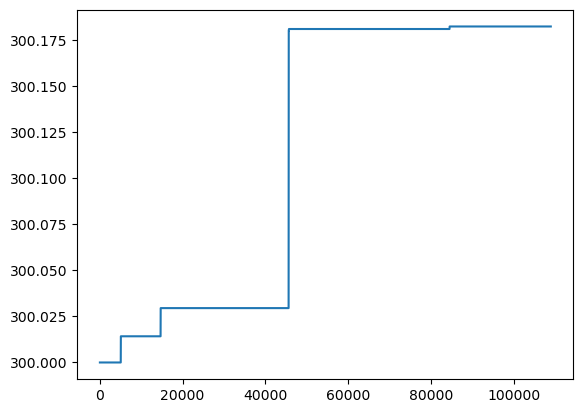

-------------
SLIP_N = 2
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.1381476634242
Прибыль от 300 usdt за 100_000 тиков: 0.12677470466840376
 


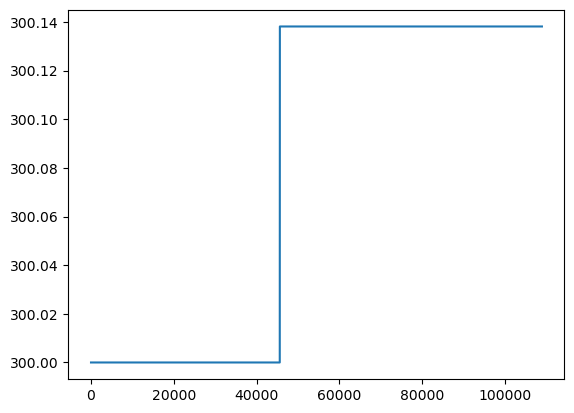

-------------
SLIP_N = 3
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.08790903851093
Прибыль от 300 usdt за 100_000 тиков: 0.08067195722800502
 


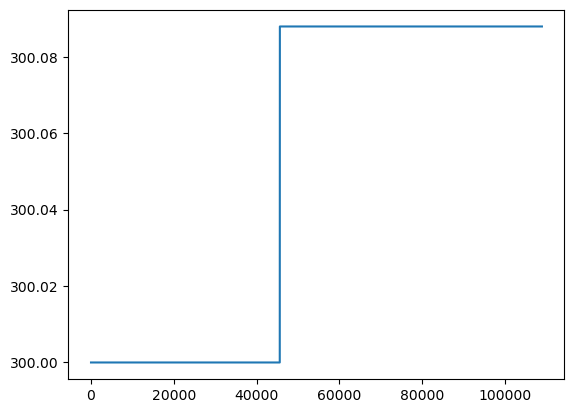

-------------
SLIP_N = 4
Без торгов за счёт изменения курса с 300 usdt: 301.50196028159473
Результат торгов с 300 usdt: 300.0376704135977
Прибыль от 300 usdt за 100_000 тиков: 0.03456920978765845
 


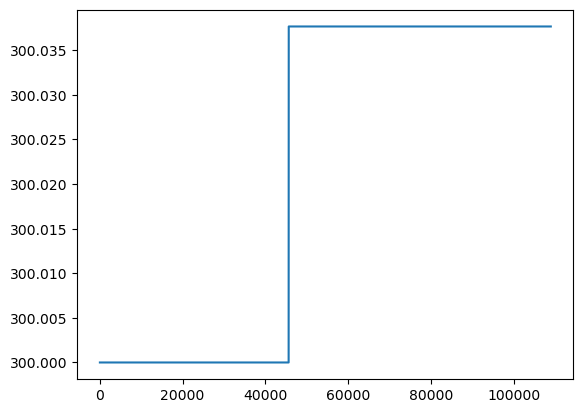

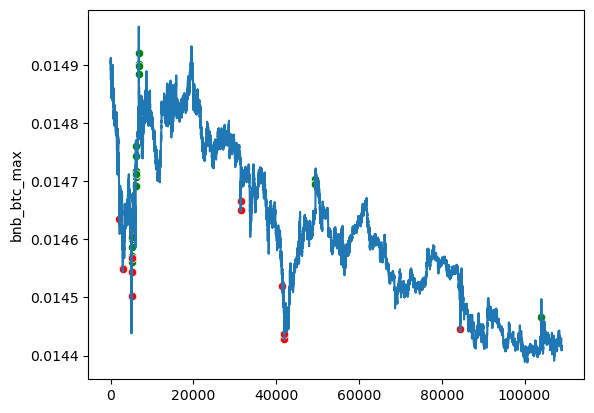

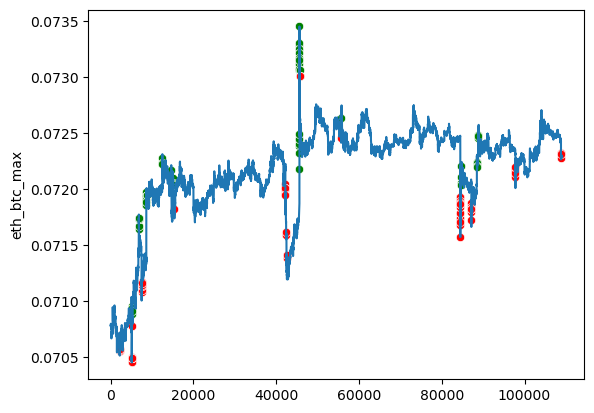

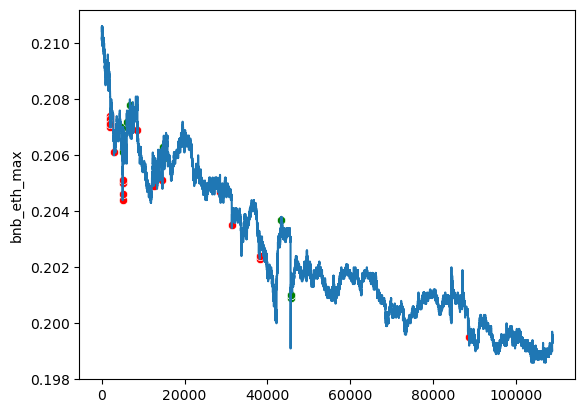

100%|███████████████████████████████████████████████████████████████████████████████████| 1/1 [15:07<00:00, 907.78s/it]

CPU times: total: 1h 24min 2s
Wall time: 15min 7s


In [15]:
%%time

C_list = list()
traid_counts_list = list()
profit_300_1_list = list()
profit_300_2_list = list()
profit_300_3_list = list()
profit_300_4_list = list()

ticker_price_valid_values = ticker_price_valid.values
ticker_price_valid_fig = ticker_price_valid

for C in tqdm(range(10,11)):
    model_LR = LogisticRegression(C=C/10, solver='lbfgs', multi_class='auto', random_state=RANDOM)
    model_LR.fit(features, labels)
    
    print('---***---***---***---***---***---***---***---***---***---***---***---***---')
    print('Predict start')
    predict = model_LR.predict(features_valid)

    print(f'C: {C/10}')
    C_list.append(C/10)
    
    traid_counts = (predict!=0).sum()
    traid_counts_list.append(traid_counts)
    print(f'Traid counts: {traid_counts}',
          f'1: {(predict==1).sum()}',
          f'2: {(predict==2).sum()}',
          f'3: {(predict==3).sum()}',
          f'4: {(predict==4).sum()}',
          f'5: {(predict==5).sum()}',
          f'6: {(predict==6).sum()}'
         )
    print(classification_report(labels_valid, predict))

    for slip_n in range(1,5):
        print("-------------")
        print(f'SLIP_N = {slip_n}')
        trade_result, volume_not_trade = trade(ticker_price_valid_values, predict, FEE, slip_n)
        trade_result = np.array(trade_result)
        print(f'Без торгов за счёт изменения курса с 300 usdt: {volume_not_trade}')
        print(f'Результат торгов с 300 usdt: {trade_result[-1]}')
        profit_300 = (trade_result[-1]-300)*100_000/predict.shape[0]
        if slip_n == 1:
            profit_300_1_list.append(profit_300)
        elif slip_n == 2:
            profit_300_2_list.append(profit_300)
        elif slip_n == 3:
            profit_300_3_list.append(profit_300)
        elif slip_n == 4:
            profit_300_4_list.append(profit_300)
        print(f'Прибыль от 300 usdt за 100_000 тиков: {profit_300}')
        print(' ')
        # отрисовка изменение объёма кошелька
        sns.lineplot(x=range(trade_result.shape[0]),y=trade_result)
        plt.show()
    
    # отрисовка сделок на тренде
    x_len = predict.shape[0]
      
    ticker_price_valid_fig[PAIRS_NAME[0]+'_min'] = ticker_price_valid_values[:,0]*(predict == 1)
    ticker_price_valid_fig[PAIRS_NAME[0]+'_max'] = ticker_price_valid_values[:,0]*(predict == 2)
    ticker_price_valid_fig[PAIRS_NAME[1]+'_min'] = ticker_price_valid_values[:,1]*(predict == 3)
    ticker_price_valid_fig[PAIRS_NAME[1]+'_max'] = ticker_price_valid_values[:,1]*(predict == 4)
    ticker_price_valid_fig[PAIRS_NAME[2]+'_min'] = ticker_price_valid_values[:,2]*(predict == 5)
    ticker_price_valid_fig[PAIRS_NAME[2]+'_max'] = ticker_price_valid_values[:,2]*(predict == 6)
    ticker_price_valid_fig = ticker_price_valid_fig.replace(0, np.nan)
        
    for i, pair in enumerate(['bnb_btc','eth_btc','bnb_eth']):
            
        fig, ax = plt.subplots()
        ax.plot(range(x_len),ticker_price_valid_values[:x_len,i])
        #ax.plot(range(x_len),trade_result['bnb_btc_max'][:x_len])
        sns.scatterplot(data=ticker_price_valid_fig[:x_len], x=range(x_len), y=pair+'_max', ax=ax, color='green')
        sns.scatterplot(data=ticker_price_valid_fig[:x_len], x=range(x_len), y=pair+'_min', ax=ax, color='red')
        #plt.ylim([ticker_price_valid_fig[pair+'_min'][:x_len].min(), ticker_price_valid_fig[pair+'_max'][:x_len].max()])
        plt.show()

trade_df = pd.DataFrame(data=[C_list, 
                              traid_counts_list, 
                              profit_300_1_list, 
                              profit_300_2_list, 
                              profit_300_3_list, 
                              profit_300_4_list]).T.rename(columns={0:'C',
                                                                     1:'traid_counts',
                                                                     2:'profit_300_1',
                                                                     3:'profit_300_2',
                                                                     4:'profit_300_3',
                                                                     5:'profit_300_4'})

## Проверка модели при продаже на тестовых данных

### Предсказание на test

In [ ]:
ticker_price_test.shape, labels_test.shape

In [ ]:
X_scaled_test = list()
X_delta_maxmin_test = list()

#scaler = StandardScaler()
scaler_X_trend = MinMaxScaler()

for i in tqdm(range(FEATURES_LENGTH, ticker_price_test.shape[0])):
    
    X_trend_test = ticker_price_test.iloc[i-FEATURES_LENGTH:i] # .iloc невключая i
    X_delta_test = X_trend_test.max()-X_trend_test.min()
    X_delta_maxmin_test.append(X_delta_test)
    X_scaled_test.append(scaler_X_trend.fit_transform(X_trend_test).T)

X_scaled_test = np.array(X_scaled_test)
X_delta_maxmin_test = np.array(X_delta_maxmin_test)

In [ ]:
y_trend_test = labels_test['label'].iloc[FEATURES_LENGTH-1:-1].values
trend_test = ticker_price_test.iloc[FEATURES_LENGTH-1:-1].values

In [ ]:
X_scaled_test = X_scaled_test[:,:6,-IMAGE_LENGTH:]
X_scaled_test_tensor = torch.tensor(X_scaled_test.astype('float32'))

In [ ]:
predict_test = torch.argmax(res_net.to('cpu').inference(X_scaled_test_tensor), dim=1).detach().numpy()

### Предсказание на графике

In [ ]:
predict_test_fig = predict_test

In [ ]:
trade_result = ticker_test.iloc[FEATURES_LENGTH-1:-1]

In [ ]:
trade_result[PAIRS_NAME[0]+'_min'] = trend_test[:,0]*(predict_test_fig == 1)
trade_result[PAIRS_NAME[0]+'_max'] = trend_test[:,0]*(predict_test_fig == 2)
trade_result[PAIRS_NAME[1]+'_min'] = trend_test[:,1]*(predict_test_fig == 3)
trade_result[PAIRS_NAME[1]+'_max'] = trend_test[:,1]*(predict_test_fig == 4)
trade_result[PAIRS_NAME[2]+'_min'] = trend_test[:,2]*(predict_test_fig == 5)
trade_result[PAIRS_NAME[2]+'_max'] = trend_test[:,2]*(predict_test_fig == 6)

In [ ]:
trade_result = trade_result.replace(0, np.nan)

In [ ]:
x_len = 2000
pair = 'bnb_btc'

fig, ax = plt.subplots()
ax.plot(range(x_len),trend_test[:x_len,0])
#ax.plot(range(x_len),trade_result['bnb_btc_max'][:x_len])
sns.scatterplot(data=trade_result[:x_len], x=range(x_len), y=pair+'_max', ax=ax, color='green')
sns.scatterplot(data=trade_result[:x_len], x=range(x_len), y=pair+'_min', ax=ax, color='red')
plt.ylim([trade_result[pair+'_min'][:x_len].min(), trade_result[pair+'_max'][:x_len].max()])
plt.show()

In [ ]:
trade_result['bnb_eth_max'].sum() - trade_result['bnb_eth_min'].sum()